# Chapter 2: Scalable ML on Big Data using Apache Spark

## 1. Understanding how Apache Spark works:

### A: Parallel data processing in Apache Spark

When we talk about ApacheSpark, we talk about a Java Virtual Machine. The underlying execution engine in ApacheSpark is written in it's color, a JVM compatible programming language.

If we want to use large compute clusters but still don't want to take care of parallelizing our programs, ApacheSpark kicks in. Let's turn our single node JVM application into a so called driver program which is not involved in any computations anymore, but only managing remote Compute Nodes. We call those Compute Nodes the Worker Nodes. And those remote Compute Nodes at JVM is running, and they are responsible for executing your parallel version of your analytics workflow.

Basically there are two options for attaching to an ApacheSpark cluster. 

The simplest one is using an off node storage approach, where the third system is attached to the cluster using a fast network connection. In case high out bandwidth is needed a certain type of network technology called switching fabric is used which guarantees the maximum network performance between the storage system and the worker nodes. In this course, we will only use this topology.

The other option is that you can simply attach hard drives directly to the worker nodes. This is called the JBOD approach, Just a Bunch Of Discs, or sometimes this approach is called directly attached storage.
In order to retrieve the combined storage capacity of all disks as one large virtual file system, we have to add a software component to the cluster. This component is called HDFS which stands for Hadoop Distributed File System. HDFS creates a virtual view on top of the individual chunks of which the entire data consists so that it can be treated as a single large file spanning the whole cluster. 

One advantage of the technology is data locality. Since HDFS is aware of the location of individual chunks of the file, computations can be done in parallel using CPU's residing on the same physical worker node. The central first class citizen in the ApacheSpark is the so called **Resilient Distributed Dataset RDD.**

Once an RDD is created, it resides distributed in the main memory of the different worker nodes. When the aggregated main memory of all the worker nodes is not sufficient, then data gets split to disk. Finally, RDDs are lazy. That means only if the data is really needed for a certain computation, it is read from the underlying storage system, otherwise not.

Once we execute an RDD code, this triggers the execution of a spark trip which gets divided into individual spark tasks. Those spark tasks are executed in parallel on the cluster using this spark executor JVMs. 

Other programming becomes easy when using ApacheSpark because when using the RDD API you simply can't write non parallel programs.

It doesn't matter how much data you process, the program always stays the same. RDD provides the central API for achieving this. And you don't have to worry about data and task distribution. ApacheSpark will handle this for you.

### B: Functional Programing basics

We are ready to explore Para-programming on Apache Spark. This requires the basic understanding of functional programming.

Functional programming, or FP, makes use of the mathematical concept called lambda calculus. To keep it very simple, it basically says that every computation can be expressed as an anonymous function which is applied to a data set.

Lambda Calculus is too incomplete which basically means that you can convert any program into a pure function of program using Lambda Calculus. So, how does this work? In FP, a function is fitted the same way as a constant, variable or object. So basically, a function kind of functions as parameters, and also return functions as a result of a call.

So let's consider a function called function creator, which is a recite of being called can return a function. You can even return a function, which itself can return other functions. This function actually takes a value, increments it by 1, and returns it. Let's consider a data set in this case a list of integers with cardinality 4. In functional programming you actually can apply a function to a list. This means that the function is sent to the list, and applied to each element of the list, and the result of each function call basically generates a new list. And the new list reflects the computation, which the function expresses. So each element is incremented by 1. 

In procedural or object-oriented programming paradigms, you would have to iterate over the list and then increment each element. But in functional programming, the computation basically is sent to the data, and this makes it very easy to parallelize. 

So how does parallelization work on Apache Spark? Basically we just take the function and apply it to the data.

But now, let's consider that a data set is so big that we have to distribute it on multiple notes.

This can be done using HTFS the Hadoop distributed file system as mentioned in the previous lecture. And by using RDDs, your data automatically gets distributed among the main memory and disk storage of the cluster nodes in an Apache Spark cluster. Now, we sent the function over the network to all Apache Spark worker nodes, and apply to subsets of the data on each of the worker nodes. The final result is the same as it would have applied the function on only a single node.

But note, this case our function was running three times in parallel without requiring changes to the function or code.

In [46]:
!pip install pyspark==2.4.5

You should consider upgrading via the '/Users/nikolas.anic/opt/anaconda3/bin/python -m pip install --upgrade pip' command.


In [47]:
try:
    from pyspark import SparkContext, SparkConf
    from pyspark.sql import SparkSession
except ImportError as e:
    printmd('<<<<<!!!!! Please restart your kernel after installing Apache Spark !!!!!>>>>>')

In [48]:
sc = SparkContext.getOrCreate(SparkConf().setMaster("local[*]"))

spark = SparkSession \
    .builder \
    .getOrCreate()

In [39]:
rdd = sc.parallelize(range(100))

In [42]:
rdd.sum()

4950

In [43]:
rdd.count()

100

In [45]:
#let's shuffle our list to make it a bit more interesting
from random import shuffle
l = list(range(100))
shuffle(l)

In [46]:
rdd = sc.parallelize(l)

In [55]:
# And create a function lambda
rdd.filter(lambda i: i > 50).collect()

[76,
 97,
 74,
 80,
 53,
 95,
 51,
 71,
 57,
 54,
 99,
 66,
 89,
 70,
 90,
 78,
 62,
 73,
 68,
 55,
 65,
 64,
 87,
 60,
 72,
 82,
 67,
 86,
 61,
 75,
 98,
 56,
 91,
 94,
 88,
 96,
 85,
 93,
 84,
 69,
 58,
 92,
 59,
 63,
 77,
 52,
 83,
 81,
 79]

In [49]:
# Let’s consider the same list of integers. Now we want to compute the sum for elements in that list which are 
# greater than 50 but less than 75.

In [51]:
rdd.filter(lambda x: x>50).filter(lambda x: x < 75).sum()

1500

In [54]:
rdd.reduce(lambda a,b : a+b) # Which is the arithmetic sum

4950

### C: Datasets in ApacheSparkSQL

Apache Spark SQL provides an LC 2003 compliant SQL interface to your data. The RDD is still a first class citizen, so what ApacheSparkSQL basically does is wrapping the RDD with a DataFrame object actually abstracting the API to a relational one. We will cover the SQL API, which enables you to write ordinary NCS query statements against your data. 

RDDs are in inherently schema less, so when using data frames a schema is maintained as meter information on top of the RDD. Schemas can be implicit, lazy and inferred automatically from the data read or also explicitly defined. 

Independently, if you are using SQL or the DataFrame API, or both at the same time, internally Apache Spark **creates a so-called abstract syntax tree out of this.** This tree can be rearranged and transformed to generate an execution plan which performs best. This is where a catalyst optimizer kicks in. Having a schema allows the so called **catalyst optimizer to create a logical query execution plan from your SQL abstract syntax tree.** The LEP is then compiled into many physical execution plans, and based on cost based statistics on the size of different data sets involved, and optimal PEP is chosen.

So, how do we use SparkSQL? 

First, we have to create a so-called sparkSession object. Now we will create a spark data frame from a cloudant database directory. We use the spark session object, and the cloudant spark connector for doing this. We have to provide a cloudant.host name, the cloudant.username, and the cloudant.password, to the connector. Finally, we specified a cloudant database where we want to read data from. 

Then we can create a query the data frame using SQL. First, we have to register it has a virtual temporary table. Now we can use this temporary table to issue SQL queries against the data frame originating from data within cloudant. The show function on the data frame, somehow similar to the RDDs take function, shows us the first 20 entries in the table.

Let’s create a little data frame:

In [56]:
from pyspark.sql import Row

df = spark.createDataFrame([Row(id=1, value='value1'),Row(id=2, value='value2')])

# let's have a look what's inside
df.show()

# let's print the schema
df.printSchema()

+---+------+
| id| value|
+---+------+
|  1|value1|
|  2|value2|
+---+------+

root
 |-- id: long (nullable = true)
 |-- value: string (nullable = true)



Now we register this DataFrame as query table and issue an SQL statement against it. Please note that the result of the SQL execution returns a new DataFrame we can work with.

In [57]:
# register dataframe as query table
df.createOrReplaceTempView('df_view')

# execute SQL query
df_result = spark.sql('select value from df_view where id=2')

# examine contents of result
df_result.show()

# get result as string
df_result.first().value

+------+
| value|
+------+
|value2|
+------+



'value2'

In [58]:
df.count()

2

## 2. Parallel Programing on ApacheSpark:

In this section, we're going to have a look at the most common data distribution forms in Apache Spark. 

In [59]:
# download the file containing the data in PARQUET format: 

!wget https://github.com/IBM/coursera/raw/master/hmp.parquet

--2020-08-26 14:27:53--  https://github.com/IBM/coursera/raw/master/hmp.parquet
Resolving github.com (github.com)... 140.82.121.3
Connecting to github.com (github.com)|140.82.121.3|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://github.com/IBM/skillsnetwork/raw/master/hmp.parquet [following]
--2020-08-26 14:27:53--  https://github.com/IBM/skillsnetwork/raw/master/hmp.parquet
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/IBM/skillsnetwork/master/hmp.parquet [following]
--2020-08-26 14:27:53--  https://raw.githubusercontent.com/IBM/skillsnetwork/master/hmp.parquet
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.112.133
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.112.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 932997 (911K) [application/octet-stream]
Sav

In [60]:
park = spark.read.parquet("hmp.parquet")

In [65]:
# register a corresponding query table
park.createOrReplaceTempView('df')

In [66]:
park.show()
park.printSchema()

+---+---+---+--------------------+-----------+
|  x|  y|  z|              source|      class|
+---+---+---+--------------------+-----------+
| 22| 49| 35|Accelerometer-201...|Brush_teeth|
| 22| 49| 35|Accelerometer-201...|Brush_teeth|
| 22| 52| 35|Accelerometer-201...|Brush_teeth|
| 22| 52| 35|Accelerometer-201...|Brush_teeth|
| 21| 52| 34|Accelerometer-201...|Brush_teeth|
| 22| 51| 34|Accelerometer-201...|Brush_teeth|
| 20| 50| 35|Accelerometer-201...|Brush_teeth|
| 22| 52| 34|Accelerometer-201...|Brush_teeth|
| 22| 50| 34|Accelerometer-201...|Brush_teeth|
| 22| 51| 35|Accelerometer-201...|Brush_teeth|
| 21| 51| 33|Accelerometer-201...|Brush_teeth|
| 20| 50| 34|Accelerometer-201...|Brush_teeth|
| 21| 49| 33|Accelerometer-201...|Brush_teeth|
| 21| 49| 33|Accelerometer-201...|Brush_teeth|
| 20| 51| 35|Accelerometer-201...|Brush_teeth|
| 18| 49| 34|Accelerometer-201...|Brush_teeth|
| 19| 48| 34|Accelerometer-201...|Brush_teeth|
| 16| 53| 34|Accelerometer-201...|Brush_teeth|
| 18| 52| 35|

This is a classical classification data set. One thing we always do during data analysis is checking if the classes are balanced. In other words, if there are more or less the same number of example in each class. Let’s find out by a simple aggregation using SQL.

In [68]:
park.groupBy('class').count().show()

+--------------+-----+
|         class|count|
+--------------+-----+
| Use_telephone|15225|
| Standup_chair|25417|
|      Eat_meat|31236|
|     Getup_bed|45801|
|   Drink_glass|42792|
|    Pour_water|41673|
|     Comb_hair|23504|
|          Walk|92254|
|  Climb_stairs|40258|
| Sitdown_chair|25036|
|   Liedown_bed|11446|
|Descend_stairs|15375|
|   Brush_teeth|29829|
|      Eat_soup| 6683|
+--------------+-----+



Let’s create a bar plot from this data. We’re using the pixidust library, which is Open Source, because of its simplicity. But any other library like matplotlib is fine as well.

In [72]:
!pip install pixiedust
import pixiedust

     |████████████████████████████████| 197 kB 1.9 MB/s eta 0:00:01
     |████████████████████████████████| 1.0 MB 4.1 MB/s eta 0:00:01
  Using cached astunparse-1.6.3-py2.py3-none-any.whl (12 kB)
  Using cached Markdown-3.2.2-py3-none-any.whl (88 kB)
  Created wheel for pixiedust: filename=pixiedust-1.1.18-py3-none-any.whl size=321728 sha256=f14ae2d72c4a4201654da67f0b13c90ceb8f9fa309a4d67333692dd3c12e93ac
  Stored in directory: /Users/nikolas.anic/Library/Caches/pip/wheels/41/4c/20/08a843440aaeffc976c1848c9eb44be6ec68dcd964421ec6f7
  Created wheel for mpld3: filename=mpld3-0.5.1-py3-none-any.whl size=364062 sha256=5b6abe82cae91c475d8f46ec2fdcf860f72532500dbcad23f0f1338fb59decaf
  Stored in directory: /Users/nikolas.anic/Library/Caches/pip/wheels/b9/36/27/d61b9f1327012961fa31f05a20b190f836dd3fcb1c0264177b
Successfully built pixiedust mpld3
You should consider upgrading via the '/Users/nikolas.anic/opt/anaconda3/bin/python -m pip install --upgrade pip' command.
Pixiedust database opened

Pixiedust runtime updated. Please restart kernel
Table SPARK_PACKAGES created successfully
Table USER_PREFERENCES created successfully
Table service_connections created successfully


AnalysisException: "cannot resolve '`class`' given input columns: [id, value];;\n'Aggregate ['class], ['class, count(1) AS count#100L]\n+- LogicalRDD [id#0L, value#1], false\n"


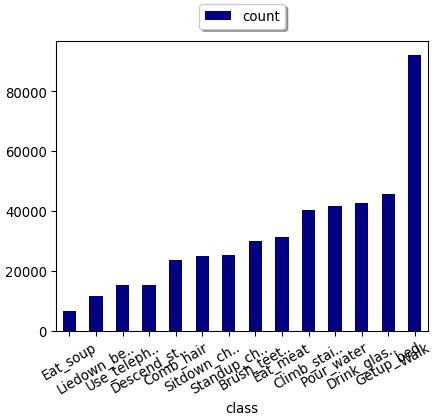

In [ ]:
from pyspark.sql.functions import col
counts = park.groupBy('class').count().orderBy('count')
display(counts)

we can aggregate further to obtain some quantitative metrics on the imbalance like, min, max, mean and standard deviation. If we divide max by min we get a measure called minmax ration which tells us something about the relationship between the smallest and largest class

In [75]:
from pyspark.sql.functions import col, min, max, mean, stddev

park \
    .groupBy('class') \
    .count() \
    .select([ 
        min(col("count")).alias('min'), 
        max(col("count")).alias('max'), 
        mean(col("count")).alias('mean'), 
        stddev(col("count")).alias('stddev') 
    ]) \
    .select([
        col('*'),
        (col("max") / col("min")).alias('minmaxratio')
    ]) \
    .show()


+----+-----+------------------+------------------+-----------------+
| min|  max|              mean|            stddev|      minmaxratio|
+----+-----+------------------+------------------+-----------------+
|6683|92254|31894.928571428572|21284.893716741157|13.80427951518779|
+----+-----+------------------+------------------+-----------------+



Imbalanced classes can cause pain in machine learning. Therefore let’s rebalance. In the flowing we limit the number of elements per class to the amount of the least represented class. This is called undersampling. Other ways of rebalancing can be found here:

https://machinelearningmastery.com/tactics-to-combat-imbalanced-classes-in-your-machine-learning-dataset/

In [77]:
from pyspark.sql.functions import min

# create a lot of distinct classes from the dataset
classes = [row[0] for row in park.select('class').distinct().collect()]

# compute the number of elements of the smallest class in order to limit the number of samples per class
min = park.groupBy('class').count().select(min('count')).first()[0]

# define the result dataframe variable
df_balanced = None

# iterate over distinct classes
for cls in classes:
    
    # only select examples for the specific class within this iteration
    # shuffle the order of the elements (by setting fraction to 1.0 sample works like shuffle)
    # return only the first n samples
    df_temp = park \
        .filter("class = '"+cls+"'") \
        .sample(False, 1.0) \
        .limit(min)
    
    # on first iteration, assing df_temp to empty df_balanced
    if df_balanced == None:    
        df_balanced = df_temp
    # afterwards, append vertically
    else:
        df_balanced=df_balanced.union(df_temp)

In [158]:
# Show that it worked: 

df_balanced.groupBy('class').count().show()

+--------------+-----+
|         class|count|
+--------------+-----+
| Use_telephone| 6683|
| Standup_chair| 6683|
|      Eat_meat| 6683|
|     Getup_bed| 6683|
|   Drink_glass| 6683|
|    Pour_water| 6683|
|     Comb_hair| 6683|
|          Walk| 6683|
|  Climb_stairs| 6683|
| Sitdown_chair| 6683|
|   Liedown_bed| 6683|
|Descend_stairs| 6683|
|   Brush_teeth| 6683|
|      Eat_soup| 6683|
+--------------+-----+



### 3: Visualization of Big Data

Plotting libraries run on a single machine and expect a rather small input data set in the form of vectors or matrices in order to render the plot.

So once you have too much data, you either run into main memory problems or performance problems. The solution is sampling.

Sampling takes only a subset of your original data, but due to inherent randomness in selecting the values actually returning, sampling preserves most of the properties of your original data. Sampling reduces cost because at downstream data processing steps, only a fraction of data has to be considered. 

In order to use sampling, we can call the sample function to receive a fraction of the data randomly, and then take the plots with the data that we sliced. 

Then, we can easily use the data to generate boxplot, time-series (timestamp modified) or even scatter and other plots. 

Let's use this knowledge to create a these plots with the washing parquet csv we retrieve from github:

In [139]:
!wget https://github.com/IBM/coursera/blob/master/coursera_ds/washing.parquet?raw=true
!mv washing.parquet?raw=true washing.parquet

--2020-08-26 17:43:55--  https://github.com/IBM/coursera/blob/master/coursera_ds/washing.parquet?raw=true
Resolving github.com (github.com)... 140.82.121.4
Connecting to github.com (github.com)|140.82.121.4|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://github.com/IBM/skillsnetwork/blob/master/coursera_ds/washing.parquet?raw=true [following]
--2020-08-26 17:43:59--  https://github.com/IBM/skillsnetwork/blob/master/coursera_ds/washing.parquet?raw=true
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/IBM/skillsnetwork/raw/master/coursera_ds/washing.parquet [following]
--2020-08-26 17:43:59--  https://github.com/IBM/skillsnetwork/raw/master/coursera_ds/washing.parquet
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/IBM/skillsnetwork/master/coursera_ds/washing.parquet [fo

In [140]:
df = spark.read.parquet('washing.parquet')

Now we register the data frame in the ApacheSparkSQL catalog so that we can query it using SQL. This is the "easy" SQL language in which we communicate with the servers. 

In [141]:
df.createOrReplaceTempView("washing")
spark.sql("SELECT * FROM washing").show()

+--------------------+--------------------+-----+--------+----------+---------+--------+-----+-----------+-------------+-------+
|                 _id|                _rev|count|flowrate|fluidlevel|frequency|hardness|speed|temperature|           ts|voltage|
+--------------------+--------------------+-----+--------+----------+---------+--------+-----+-----------+-------------+-------+
|0d86485d0f88d1f9d...|1-57940679fb8a713...|    4|      11|acceptable|     null|      77| null|        100|1547808723923|   null|
|0d86485d0f88d1f9d...|1-15ff3a0b304d789...|    2|    null|      null|     null|    null| 1046|       null|1547808729917|   null|
|0d86485d0f88d1f9d...|1-97c2742b68c7b07...|    4|    null|      null|       71|    null| null|       null|1547808731918|    236|
|0d86485d0f88d1f9d...|1-eefb903dbe45746...|   19|      11|acceptable|     null|      75| null|         86|1547808738999|   null|
|0d86485d0f88d1f9d...|1-5f68b4c72813c25...|    7|    null|      null|       75|    null| null|   

#### Creating a boxplot 

let's visualize voltage using a box plot to get an idea on the value distribution of this parameter. First, we have to create a python list. Make sure you use the sample function in order to not blast your spark driver or plotting library.

We get the python list by first talking to the spark sql server and tell it to only include non-zero values. Then we retrieve an array based on the rdd.map function (calling the lambda function) annd then sampling it down to 1/10 of the sample population. 

In [146]:
result = spark.sql("select voltage from washing where voltage is not null")

In [148]:
result_array = result.rdd.map(lambda row: row.voltage).sample(False, 0.1).collect()

Now we create the command that makes matplotlib display the images right below the cell

In [149]:
%matplotlib inline 

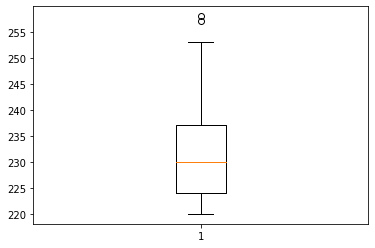

In [150]:
import matplotlib.pyplot as plt
plt.boxplot(result_array)
plt.show()

#### Creating a time-series plot

Since we are dealing with time series data we want to make use of the time dimension as well. The least complex plots are run charts where the time domain (dimension) is represented at the horizontal x-axis and the y-axis shows the actual sensor value. Let's do this for voltage as well.

1. We first call up spark sql again to select the voltage and timestamp values non-zero and ascendingly order them by ts. 

2. Then we retrieve the values for both voltage and the ts values to obtain an rdd matrix. 

3. Next, we create two arrays consisting of the values for either ts or voltage. 

4. Lastly, we create a time-series plot

In [152]:
result = spark.sql("select voltage,ts from washing where voltage is not null order by ts asc")
result_rdd = result.rdd.sample(False,0.1).map(lambda row : (row.ts,row.voltage))
result_array_ts = result_rdd.map(lambda ts_voltage: ts_voltage[0]).collect()
result_array_voltage = result_rdd.map(lambda ts_voltage: ts_voltage[1]).collect()

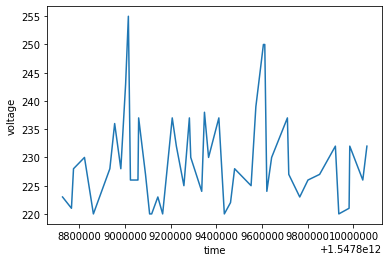

In [153]:
plt.plot(result_array_ts,result_array_voltage)
plt.xlabel("time")
plt.ylabel("voltage")
plt.show()


Now we've plotted a maximum of two dimensions at a time, let's go for three in a so-called 3D scatter plot. Again we have to create python lists (with applied sampling if necessary) from three properties of our data.

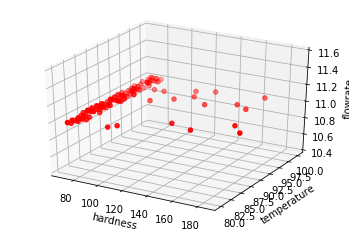

In [155]:
result_df = spark.sql("""
select hardness,temperature,flowrate from washing
    where hardness is not null and 
    temperature is not null and 
    flowrate is not null
""")
result_rdd = result_df.rdd.sample(False,0.1).map(lambda row : (row.hardness,row.temperature,row.flowrate))
result_array_hard = result_rdd.map(lambda hardness_temperature_flowrate: hardness_temperature_flowrate[0]).collect()
result_array_temp = result_rdd.map(lambda hardness_temperature_flowrate: hardness_temperature_flowrate[1]).collect()
result_array_flow = result_rdd.map(lambda hardness_temperature_flowrate: hardness_temperature_flowrate[2]).collect()


from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.scatter(result_array_hard,result_array_temp,result_array_flow, c='r', marker='o')

ax.set_xlabel('hardness')
ax.set_ylabel('temperature')
ax.set_zlabel('flowrate')

plt.show()



You will notice that the individual points resemble in some sort of plane. But this is not a surprise. Actually we can draw the following conclusions from the plot:

- most of the data points are lying around hardness 60-80, temperature 80-100 and flowrate 80-100
- there are some outliers, especially when it comes to the range of hardness 100-200
- the data follows some narrow boundaries

So lets double-check what's going on with hardness and flowrate since it seems that it really sticks around 60-80 and very seldom creates values above that. We can use a histogram for that which bins together certain value ranges and counts the frequency of occurences of values within this range. Those frequencies are ordered and shown as a bar diagram, so let's plot it:

(array([118.,   1.,   3.,   3.,   1.,   3.,   0.,   2.,   2.,   2.]),
 array([ 70. ,  81.5,  93. , 104.5, 116. , 127.5, 139. , 150.5, 162. ,
        173.5, 185. ]),
 <a list of 10 Patch objects>)

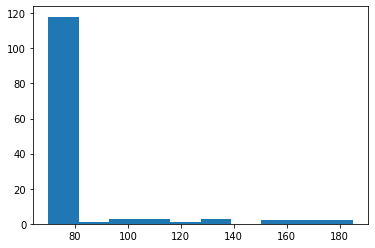

In [156]:
plt.hist(result_array_hard)

(array([  0.,   0.,   0.,   0.,   0., 135.,   0.,   0.,   0.,   0.]),
 array([10.5, 10.6, 10.7, 10.8, 10.9, 11. , 11.1, 11.2, 11.3, 11.4, 11.5]),
 <a list of 10 Patch objects>)

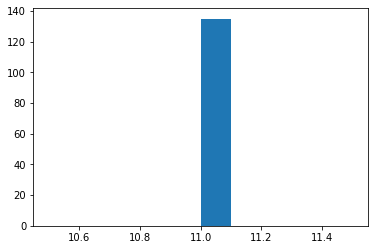

In [157]:
plt.hist(result_array_flow)

### 3: Dimensionality Reduction:

Dimensionality reduction is the base character of the pricipal component analysis (PCA). The main idea behind it is to reduce dimensions by transforming everything to a new dataset but preserving some key properties. 

The idea is that you take an n-dimensional data set, where of course every row can be seen as a point in an n-dimensional euclidian vector space and each column is one coordinate in that space. 

PCA transforms your dataset by specifying the number of desired dimensions in a way that the new dataset represents the very same points with vectors of lower dimensions, called k, which is also called **projection.**

One of the key properties which are preserved by PCA is the ratio of distances between the points. So in mathematical notation this means that if you take the distance of two random points, Pa and Pb, in the **original dataset,** and divide it by the distance of two other random points, Pc and Pd, You get **the same value** as if you take the distance of two random points, Pa and Pb in the **reduced dataset,** and divide it by a distance of two other random points, Pc and Pd. 

Another way of talking about this is if two points in the original dataset have been far away they are also far away in the reduced dataset, and if two points have been close in the original dataset they are also close in the reduced data set. 

After this projection, the **new dimensions returned are explaining the majority of the datasets' variation.** In other words, **the so-called principal components are chosen as such that the information contents of each additional dimension is decreasing.** 

This is a way of getting **rid of highly correlated dimensions in the source dataset because their information content is low.** Since the new dimensions are cloned out of ones with the lowest correlation among each other, these are called principal components. They are orthogonnal to each other. 

So this means that we can **spot clusters, potential separation planes, and outliers, also in the lower dimensional dataset** but with the **additional property that if you reduce the dimensionality, we are now able to plot the dataset.** 

When applying PCA we are losing information. PCA is very intelligent in deciding what parts of the information is less relevant so that the pain of removing information is minimized. 

Of course, the lower you choose k, the higher the loss is. Loss can be easily estimated by comparing the original dataset D with D prime where PCA was applied, and then the inverse function of PCA was applied again to reconstruct the original dataset D. The function used for comparing those two datasets is **sse which stands for sum of squared errors.** This way you get an idea of the percentage of information you are removing from your dataset. 

So, the key message is that, through PCA, we can reduce multi-dimensional data into three-dimensional data through a minimising-loss approach. This makes the relations plottable. 


We again use the df that we obtained earlier:

In [161]:
df = spark.read.parquet('washing.parquet')
df.createOrReplaceTempView('washing')
df.show()

+--------------------+--------------------+-----+--------+----------+---------+--------+-----+-----------+-------------+-------+
|                 _id|                _rev|count|flowrate|fluidlevel|frequency|hardness|speed|temperature|           ts|voltage|
+--------------------+--------------------+-----+--------+----------+---------+--------+-----+-----------+-------------+-------+
|0d86485d0f88d1f9d...|1-57940679fb8a713...|    4|      11|acceptable|     null|      77| null|        100|1547808723923|   null|
|0d86485d0f88d1f9d...|1-15ff3a0b304d789...|    2|    null|      null|     null|    null| 1046|       null|1547808729917|   null|
|0d86485d0f88d1f9d...|1-97c2742b68c7b07...|    4|    null|      null|       71|    null| null|       null|1547808731918|    236|
|0d86485d0f88d1f9d...|1-eefb903dbe45746...|   19|      11|acceptable|     null|      75| null|         86|1547808738999|   null|
|0d86485d0f88d1f9d...|1-5f68b4c72813c25...|    7|    null|      null|       75|    null| null|   

Now assume that we want to take 5 characteristics, which are: flowrate, hardness, speed, temperature and voltage. 

Unfortunately, we cannot use a plot as we have more than three dimensions currently. What we can do here is to use a PCA in order to reduce the dimensions until we can plot.

To do so, we first create additional dimensions per charateristic. This is the feature transformation part of this exercise. Since our table is mixing schemas from different sensor data sources we are creating new features. In other word we use existing columns to calculate new ones. We only use min and max for now, but using more advanced aggregations may improve the results. We are calculating those aggregations over a sliding window "w". This window is defined in the SQL statement and basically reads the table by a one by one stride in direction of increasing timestamp

In [164]:
result = spark.sql("""
SELECT * from (
    SELECT
    min(temperature) over w as min_temperature,
    max(temperature) over w as max_temperature, 
    min(voltage) over w as min_voltage,
    max(voltage) over w as max_voltage,
    min(flowrate) over w as min_flowrate,
    max(flowrate) over w as max_flowrate,
    min(frequency) over w as min_frequency,
    max(frequency) over w as max_frequency,
    min(hardness) over w as min_hardness,
    max(hardness) over w as max_hardness,
    min(speed) over w as min_speed,
    max(speed) over w as max_speed
    FROM washing 
    WINDOW w AS (ORDER BY ts ROWS BETWEEN CURRENT ROW AND 10 FOLLOWING) 
)
WHERE min_temperature is not null 
AND max_temperature is not null
AND min_voltage is not null
AND max_voltage is not null
AND min_flowrate is not null
AND max_flowrate is not null
AND min_frequency is not null
AND max_frequency is not null
AND min_hardness is not null
AND min_speed is not null
AND max_speed is not null   
""")

Before we can sample the dataset down, we now use the PCA first in order to pin down the dimensions. 

Now we import some classes from SparkML. PCA for the actual algorithm. Vectors for the data structure expected by PCA and VectorAssembler to transform data into these vector structures.

In [165]:
from pyspark.ml.feature import PCA
from pyspark.ml.linalg import Vectors
from pyspark.ml.feature import VectorAssembler


Let's define a vector transformation helper class which takes all our input features (result.columns) and created one additional column called "features" which contains all our input features as one single column wrapped in "DenseVector" objects


In [167]:
assembler = VectorAssembler(inputCols = result.columns, outputCol = "feature")

Now we actually transform the data, note that this is highly optimized code and runs really fast in contrast if we had implemented it.

The main parts here are that we simply take the vectors and store (transform) them into a new vector which combines all characteristic per datapoint. 

Then we take the PCA where wee dense out the 12 characteristics into three. We call the output columnn "pcaFeatures". As can be seen, we transformed each datapoint in a threedimensional vector. 

Lastly, we again define the subsample, map the values on the Features we selected and collect for each datapoint each of the three features to plot then. 

In [170]:
features = assembler.transform(result)

In [172]:
features.rdd.map(lambda r : r.feature).take(10)

[DenseVector([81.0, 100.0, 221.0, 223.0, 11.0, 11.0, 68.0, 76.0, 71.0, 78.0, 1033.0, 1033.0]),
 DenseVector([81.0, 100.0, 221.0, 223.0, 11.0, 11.0, 68.0, 76.0, 72.0, 78.0, 1033.0, 1033.0]),
 DenseVector([81.0, 100.0, 221.0, 223.0, 11.0, 11.0, 68.0, 76.0, 72.0, 80.0, 1033.0, 1033.0]),
 DenseVector([81.0, 100.0, 222.0, 223.0, 11.0, 11.0, 68.0, 74.0, 72.0, 80.0, 1033.0, 1046.0]),
 DenseVector([81.0, 100.0, 222.0, 223.0, 11.0, 11.0, 68.0, 74.0, 73.0, 80.0, 1033.0, 1046.0]),
 DenseVector([80.0, 94.0, 222.0, 223.0, 11.0, 11.0, 68.0, 74.0, 73.0, 80.0, 1033.0, 1046.0]),
 DenseVector([80.0, 94.0, 222.0, 236.0, 11.0, 11.0, 68.0, 74.0, 73.0, 80.0, 1046.0, 1046.0]),
 DenseVector([80.0, 94.0, 222.0, 236.0, 11.0, 11.0, 68.0, 74.0, 73.0, 80.0, 1046.0, 1046.0]),
 DenseVector([80.0, 94.0, 222.0, 236.0, 11.0, 11.0, 71.0, 74.0, 73.0, 80.0, 1046.0, 1046.0]),
 DenseVector([80.0, 94.0, 222.0, 236.0, 11.0, 11.0, 71.0, 74.0, 73.0, 80.0, 1046.0, 1046.0])]

Since the source data set has been prepared as a list of DenseVectors we can now apply PCA. Note that the first line again only prepares the algorithm by finding the transformation matrices (fit method)

In [176]:
pca = PCA(k=3, inputCol = "feature", outputCol = "pcaFeatures")
model = pca.fit(features)

In [177]:
result_pca = model.transform(features).select("pcaFeatures")
result_pca.show(truncate = False)

+-----------------------------------------------------------+
|pcaFeatures                                                |
+-----------------------------------------------------------+
|[1459.9789705814187,-18.745237781780922,70.78430794796873] |
|[1459.995481828676,-19.11343146165273,70.72738871425986]   |
|[1460.0895843561282,-20.969471062922928,70.75630600322052] |
|[1469.6993929419532,-20.403124647615513,62.013569674880955]|
|[1469.7159041892107,-20.771318327487293,61.95665044117209] |
|[1469.7128317338704,-20.790751117222456,61.896106678330966]|
|[1478.3530264572928,-20.294557029728722,71.67550104809607] |
|[1478.3530264572928,-20.294557029728722,71.67550104809607] |
|[1478.3686036138165,-20.260626897636314,71.63355353606426] |
|[1478.3686036138165,-20.260626897636314,71.63355353606426] |
|[1483.5412027684088,-20.006222577501354,66.82710394284209] |
|[1483.5171090223353,-20.867020421583753,66.86707301954084] |
|[1483.4224268542928,-19.87574823665505,66.93027077913985]  |
|[1483.4

Now we retrieve the sample and use it:

In [186]:
rdd = result_pca.rdd.sample(False, 0.2).map(lambda a: a.pcaFeatures)

In [187]:
x = rdd.map(lambda a: a[0]).collect()
y = rdd.map(lambda a: a[1]).collect()
z = rdd.map(lambda a: a[2]).collect()

In [188]:
%matplotlib inline

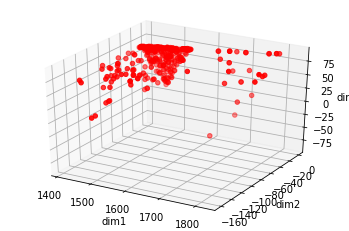

In [189]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.scatter(x,y,z, c='r', marker='o')

ax.set_xlabel('dim1')
ax.set_ylabel('dim2')
ax.set_zlabel('dim3')

plt.show()

## 4. ML Pipelines

### Introdcution to SparkML:

Pipelines are really facilitating your day to day work in machine learning. You can draw from predefined data processing steps, you make sure everything is aligned and you can switch and swap your algorithms. You can create a pipeline and you can use this pipeline in downstream data processing in a process which is called hyperparameter tuning, for example.

Convenient is that when using pipelines, you get some sort of a recipe or a predefined list of steps which you have to do.

So let's introduce this document pipelines using little sample dataset. So this dataset is called HMP dataset and it's basically SLR meter, recordings with SLR meter sensor attached to the human body. 

So the idea is, we will clone this dataset and then basically we are up with it. So the first thing is, you have to make sure that we have an Apache Spark service here associated with the project and then we go to Assets and we create a new notebook.

Then we recursively traverse through the folders we obtained and create an Apache Spark data frames from those files and then we union all data frames, giving us one data frame containing all the data.

Mainly, we follow these steps for creating pipelines: 

1. Data acquisition
2. Data transformation 
3. Pipeline command creation
4. sumarization of commands


#### Data acquisition

We start with a rather cumbersome activity. As we want to create a pipeline which combines many data-processing steps, we first have to summarize certain files into one large file. 

This can be done using the following commands, which are explained below:

In [1]:
# delete files from previous runs
!rm -f hmp.parquet*

# download the file containing the data in PARQUET format

!git clone https://github.com/wchill/HMP_Dataset.git

fatal: destination path 'HMP_Dataset' already exists and is not an empty directory.


In [242]:
! ls HMP_Dataset

Brush_teeth    Drink_glass    Liedown_bed    Sitdown_chair  final.py
Climb_stairs   Eat_meat       MANUAL.txt     Standup_chair  impdata.py
Comb_hair      Eat_soup       Pour_water     Use_telephone
Descend_stairs Getup_bed      README.txt     Walk


As we can see, we downloaded a file consisting of several steps or classes that were measured through an IoT device. First, we should combine these individual lists into one great list. 



In [2]:
import os 

list_data = os.listdir("HMP_Dataset")

However, we also see some unnecessary classes, such as README or MANUAL, final or impdata. We first should get rid of these classes: 

In [3]:
list_data_filtered = [s for s in list_data if "_" in s]

If we look at the data within the github repository, we can see that it is consisting of a three-dimensional vector. We now want to assign a column name to each of the elements within the vectors, which we call x,y,z. 

In [4]:
from pyspark.sql.types import StructType, StructField, IntegerType

schema = StructType([
    StructField("x", IntegerType(), True),
    StructField("y", IntegerType(), True),
    StructField("z", IntegerType(), True)])

#### Data transformation

Now comes the part of the data aggregation. To do so, we need to combine all files we obtained and put together into a list into a new dataframe, which is assigned all values necessary of x, y and z as well as the class and source values. 

In [9]:
df = None # create an empty dataframe 

from pyspark.sql.functions import lit # import a function that t

for category in list_data_filtered: # take each element in the list_data_filtered 
    data_files = os.listdir("HMP_Dataset/"+category) # create a new list "data_files", 
                                                     # that again sumarises all list names with the prefix "HMP_Dataset/"
                                                     # Also, each list includes all all files within the list 
    for data_file in data_files: # Take each element of the data_files created list and iterate over them
        print(data_file)
        
        temp_df = spark.read.option("header", "False").option("delimiter", " ").csv("HMP_Dataset/"+category+"/"+data_file, schema = schema)
        # temporary df, where we first define: 
            # Header: "False", as there is no header in the lists
            # Delimiter: " ", as the delimiter between x,y,z is only a space
            # csv file which is called (for the first observation): 
                #"HMP_Dataset/Liedown_bed/Accelerometer-2011-05-30-20-59-04-liedown_bed-f1.txt"
            # and which is defined according to the schema: x, y, z as column names 
            
        temp_df = temp_df.withColumn("class", lit(category)) # add a column called "class" from the category
                                                             # this is only the element e.g. "Liedown_bed"
            
        temp_df = temp_df.withColumn("source", lit(data_file)) # add a column called "source" from the data_file
                                                               # this is only the source name we created 
        if df is None: # Then we create the new dataframe consisting of each csv file we just created with 
                       # with all the inputs we require
            df = temp_df
        else:
            df = df.union(temp_df)

Accelerometer-2011-05-30-20-59-04-liedown_bed-f1.txt
Accelerometer-2011-05-30-21-41-32-liedown_bed-m2.txt
Accelerometer-2011-04-11-11-52-20-liedown_bed-f1.txt
Accelerometer-2011-05-31-14-56-04-liedown_bed-f1.txt
Accelerometer-2011-05-30-10-26-14-liedown_bed-m1.txt
Accelerometer-2011-05-30-08-25-59-liedown_bed-f1.txt
Accelerometer-2011-05-30-21-35-19-liedown_bed-m2.txt
Accelerometer-2011-06-02-17-21-57-liedown_bed-m1.txt
Accelerometer-2011-05-31-16-24-36-liedown_bed-f1.txt
Accelerometer-2011-06-02-16-58-20-liedown_bed-f4.txt
Accelerometer-2011-03-29-09-19-22-liedown_bed-f1.txt
Accelerometer-2011-03-29-09-23-22-liedown_bed-f1.txt
Accelerometer-2011-06-02-17-00-38-liedown_bed-f4.txt
Accelerometer-2011-04-11-13-33-26-liedown_bed-f1.txt
Accelerometer-2011-05-30-10-38-41-liedown_bed-m1.txt
Accelerometer-2011-05-31-15-02-19-liedown_bed-f1.txt
Accelerometer-2011-05-30-08-37-27-liedown_bed-f1.txt
Accelerometer-2011-05-30-09-41-49-liedown_bed-f1.txt
Accelerometer-2011-06-02-16-59-13-liedown_bed-

Accelerometer-2011-06-02-10-38-52-descend_stairs-f1.txt
Accelerometer-2011-06-06-10-58-14-descend_stairs-f1.txt
Accelerometer-2011-06-06-10-58-40-descend_stairs-f1.txt
Accelerometer-2011-06-06-10-56-55-descend_stairs-f1.txt
Accelerometer-2011-05-31-16-21-49-descend_stairs-f1.txt
Accelerometer-2011-05-30-21-39-11-descend_stairs-m2.txt
Accelerometer-2011-03-29-16-17-18-descend_stairs-f1.txt
Accelerometer-2011-06-06-11-01-54-descend_stairs-f1.txt
Accelerometer-2011-05-30-21-53-35-descend_stairs-m2.txt
Accelerometer-2011-06-06-10-59-38-descend_stairs-f1.txt
Accelerometer-2011-03-24-11-20-43-descend_stairs-f1.txt
Accelerometer-2011-04-11-13-32-24-descend_stairs-f1.txt
Accelerometer-2011-05-30-20-56-43-descend_stairs-f1.txt
Accelerometer-2011-05-30-21-32-18-descend_stairs-m2.txt
Accelerometer-2011-05-31-14-52-31-descend_stairs-f1.txt
Accelerometer-2011-03-29-09-15-58-descend_stairs-f1.txt
Accelerometer-2011-03-29-16-17-50-descend_stairs-f1.txt
Accelerometer-2011-05-30-10-28-13-use_telephone-

Accelerometer-2012-06-06-09-32-04-climb_stairs-m6.txt
Accelerometer-2011-04-11-11-57-50-climb_stairs-f1.txt
Accelerometer-2012-06-07-10-48-08-climb_stairs-f1.txt
Accelerometer-2011-06-06-11-01-27-climb_stairs-f1.txt
Accelerometer-2012-06-06-09-44-02-climb_stairs-m6.txt
Accelerometer-2012-06-06-14-08-44-climb_stairs-m7.txt
Accelerometer-2012-05-29-17-17-05-climb_stairs-m3.txt
Accelerometer-2012-06-06-08-53-47-climb_stairs-m5.txt
Accelerometer-2012-05-30-18-31-52-climb_stairs-f3.txt
Accelerometer-2011-05-31-16-26-09-climb_stairs-f1.txt
Accelerometer-2012-05-30-18-32-56-climb_stairs-f3.txt
Accelerometer-2011-06-06-11-02-24-climb_stairs-f1.txt
Accelerometer-2012-06-06-09-37-58-climb_stairs-m6.txt
Accelerometer-2012-06-06-09-33-15-climb_stairs-m6.txt
Accelerometer-2011-05-30-10-20-47-climb_stairs-m1.txt
Accelerometer-2011-03-24-10-24-39-climb_stairs-f1.txt
Accelerometer-2012-06-06-14-04-18-climb_stairs-m7.txt
Accelerometer-2012-06-06-09-01-08-climb_stairs-m5.txt
Accelerometer-2012-05-29-16-

Accelerometer-2012-05-25-18-28-46-sitdown_chair-f4.txt
Accelerometer-2011-12-11-08-13-16-sitdown_chair-f4.txt
Accelerometer-2012-03-26-04-58-33-sitdown_chair-f2.txt
Accelerometer-2011-12-05-09-44-08-sitdown_chair-f1.txt
Accelerometer-2011-05-30-08-22-28-sitdown_chair-f1.txt
Accelerometer-2011-03-29-09-06-48-sitdown_chair-f1.txt
Accelerometer-2011-06-02-17-44-20-sitdown_chair-m1.txt
Accelerometer-2011-05-30-10-31-12-sitdown_chair-m1.txt
Accelerometer-2011-05-31-16-33-27-sitdown_chair-f1.txt
Accelerometer-2012-03-23-03-45-26-sitdown_chair-m9.txt
Accelerometer-2012-05-25-18-33-29-sitdown_chair-f4.txt
Accelerometer-2011-04-12-21-43-15-sitdown_chair-m8.txt
Accelerometer-2011-04-08-17-34-35-sitdown_chair-f3.txt
Accelerometer-2011-06-02-16-44-37-sitdown_chair-f4.txt
Accelerometer-2011-06-02-17-41-43-sitdown_chair-m1.txt
Accelerometer-2011-06-02-16-46-07-sitdown_chair-f4.txt
Accelerometer-2011-12-05-09-50-54-sitdown_chair-f1.txt
Accelerometer-2012-03-26-04-54-57-sitdown_chair-f2.txt
Accelerome

Accelerometer-2012-05-25-18-32-32-drink_glass-f4.txt
Accelerometer-2012-05-30-22-10-16-drink_glass-m2.txt
Accelerometer-2011-06-02-17-20-47-drink_glass-m1.txt
Accelerometer-2011-04-08-18-10-09-drink_glass-m4.txt
Accelerometer-2011-03-24-13-31-22-drink_glass-f1.txt
Accelerometer-2011-06-02-17-29-13-drink_glass-m1.txt
Accelerometer-2011-06-02-17-30-51-drink_glass-m1.txt
Accelerometer-2011-03-24-10-16-02-drink_glass-f1.txt
Accelerometer-2012-05-28-17-44-02-drink_glass-m1.txt
Accelerometer-2011-03-24-16-08-10-drink_glass-f2.txt
Accelerometer-2012-05-30-19-53-49-drink_glass-f2.txt
Accelerometer-2012-05-30-19-54-48-drink_glass-f2.txt
Accelerometer-2011-06-01-15-25-43-drink_glass-f1.txt
Accelerometer-2012-05-25-18-31-18-drink_glass-f4.txt
Accelerometer-2011-04-12-21-44-55-drink_glass-m8.txt
Accelerometer-2011-05-31-15-13-09-drink_glass-f1.txt
Accelerometer-2012-05-30-19-51-49-drink_glass-f2.txt
Accelerometer-2011-06-02-17-20-17-drink_glass-m1.txt
Accelerometer-2011-05-30-21-06-42-drink_glass-

In [10]:
df.show()

+---+---+---+-----------+--------------------+
|  x|  y|  z|      class|              source|
+---+---+---+-----------+--------------------+
| 12| 28| 33|Liedown_bed|Accelerometer-201...|
| 12| 28| 31|Liedown_bed|Accelerometer-201...|
| 11| 28| 32|Liedown_bed|Accelerometer-201...|
| 11| 28| 32|Liedown_bed|Accelerometer-201...|
| 12| 27| 31|Liedown_bed|Accelerometer-201...|
| 12| 27| 31|Liedown_bed|Accelerometer-201...|
| 10| 28| 31|Liedown_bed|Accelerometer-201...|
| 11| 29| 31|Liedown_bed|Accelerometer-201...|
| 12| 29| 31|Liedown_bed|Accelerometer-201...|
| 12| 30| 31|Liedown_bed|Accelerometer-201...|
| 11| 29| 31|Liedown_bed|Accelerometer-201...|
| 10| 29| 30|Liedown_bed|Accelerometer-201...|
| 11| 30| 30|Liedown_bed|Accelerometer-201...|
| 12| 32| 32|Liedown_bed|Accelerometer-201...|
| 13| 32| 33|Liedown_bed|Accelerometer-201...|
| 13| 35| 31|Liedown_bed|Accelerometer-201...|
| 13| 37| 31|Liedown_bed|Accelerometer-201...|
| 13| 38| 31|Liedown_bed|Accelerometer-201...|
| 13| 36| 31|

#### Pipeline creation

Now, having transferred the data into a system we can work with, we can use the pipeline command to tell the program what we want to be executed for each step:

In [20]:
from pyspark.ml.feature import OneHotEncoder, StringIndexer, VectorAssembler, Normalizer, MinMaxScaler
from pyspark.ml.linalg import Vectors
from pyspark.ml import Pipeline

indexer = StringIndexer(inputCol = "class", outputCol = "classIndex")
encoder = OneHotEncoder(inputCol = "classIndex", outputCol = "categoryVec") # create 7 digit feature of a classIndex
VectorAssembler = VectorAssembler(inputCols = ["x", "y", "z"], outputCol = "features")
normalizer = Normalizer(inputCol = "features", outputCol = "featureNorm", p = 1.0)
MinMax = MinMaxScaler(inputCol="features", outputCol="scaledFeatures")

pipeline = Pipeline(stages = [indexer, encoder, VectorAssembler, normalizer, MinMax])

model = pipeline.fit(df)
prediction = model.transform(df)

### B: Introduction to supervised and unsupervised learning techniques with ApacheSpark ML

As we have now created a dataset that we can use for ML analysis through a pipeline, we can start taking first learning techniques of the program. These are rather rudimentary, and we will look at Linear and Logistic regressions, Random Forests and Gradient Boosts. 

For the exercise, however, we will work with a different dataset. 

In [ ]:
# download the file containing the data in CSV format
!wget http://max-training-data.s3-api.us-geo.objectstorage.softlayer.net/noaa-weather/jfk_weather.tar.gz

In [49]:
# download the file containing the data in CSV format
!wget http://max-training-data.s3-api.us-geo.objectstorage.softlayer.net/noaa-weather/jfk_weather.tar.gz

# extract the data
!tar xvfz jfk_weather.tar.gz

# create csv

df = spark.read.option("header", "true").option("inferSchema", "true").csv("jfk_weather.csv")

# register a corresponding query table

df.createOrReplaceTempView("df")
                                               

--2020-08-27 16:23:31--  http://max-training-data.s3-api.us-geo.objectstorage.softlayer.net/noaa-weather/jfk_weather.tar.gz
Resolving max-training-data.s3-api.us-geo.objectstorage.softlayer.net (max-training-data.s3-api.us-geo.objectstorage.softlayer.net)... 67.228.254.196
Connecting to max-training-data.s3-api.us-geo.objectstorage.softlayer.net (max-training-data.s3-api.us-geo.objectstorage.softlayer.net)|67.228.254.196|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2575759 (2,5M) [application/x-tar]
Saving to: ‘jfk_weather.tar.gz.2’

jfk_weather.tar.gz. 100%[===================>]   2,46M  1,10MB/s    in 2,2s    

2020-08-27 16:23:34 (1,10 MB/s) - ‘jfk_weather.tar.gz.2’ saved [2575759/2575759]

x jfk_weather.csv


In [55]:
import random
random.seed(42)

from pyspark.sql.functions import translate, col

df_cleaned = df \
    .withColumn("HOURLYWindSpeed", df.HOURLYWindSpeed.cast('double')) \
    .withColumn("HOURLYWindDirection", df.HOURLYWindDirection.cast('double')) \
    .withColumn("HOURLYStationPressure", translate(col("HOURLYStationPressure"), "s,", "")) \
    .withColumn("HOURLYPrecip", translate(col("HOURLYPrecip"), "s,", "")) \
    .withColumn("HOURLYRelativeHumidity", translate(col("HOURLYRelativeHumidity"), "*", "")) \
    .withColumn("HOURLYDRYBULBTEMPC", translate(col("HOURLYDRYBULBTEMPC"), "*", "")) \

df_cleaned =   df_cleaned \
                    .withColumn("HOURLYStationPressure", df_cleaned.HOURLYStationPressure.cast('double')) \
                    .withColumn("HOURLYPrecip", df_cleaned.HOURLYPrecip.cast('double')) \
                    .withColumn("HOURLYRelativeHumidity", df_cleaned.HOURLYRelativeHumidity.cast('double')) \
                    .withColumn("HOURLYDRYBULBTEMPC", df_cleaned.HOURLYDRYBULBTEMPC.cast('double')) \

df_filtered = df_cleaned.filter("""
    HOURLYWindSpeed <> 0
    and HOURLYWindSpeed IS NOT NULL
    and HOURLYWindDirection IS NOT NULL
    and HOURLYStationPressure IS NOT NULL
    and HOURLYPressureTendency IS NOT NULL
    and HOURLYPrecip IS NOT NULL
    and HOURLYRelativeHumidity IS NOT NULL
    and HOURLYDRYBULBTEMPC IS NOT NULL
""")

In [60]:
from pyspark.ml.feature import VectorAssembler 

vectorassembler = VectorAssembler(inputCols = ["HOURLYWindSpeed","HOURLYPressureTendency","HOURLYStationPressure"],
                                 outputCol = "features")

df_pipeline = vectorassembler.transform(df_filtered)

from pyspark.ml.stat import Correlation
Correlation.corr(df_pipeline, "features").head()[0].toArray()


array([[ 1.        , -0.01324305, -0.26171147],
       [-0.01324305,  1.        , -0.05821663],
       [-0.26171147, -0.05821663,  1.        ]])

In [64]:
splits = df_filtered.randomSplit([0.8, 0.2])
df_train = splits[0]
df_test = splits[1]

In [62]:
from pyspark.ml.feature import StringIndexer, OneHotEncoder
from pyspark.ml.linalg import Vectors
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.feature import Normalizer
from pyspark.ml import Pipeline

vectorAssembler = VectorAssembler(inputCols=[
                                    "HOURLYWindDirection",
                                    "ELEVATION",
                                    "HOURLYStationPressure"],
                                  outputCol="features")

normalizer = Normalizer(inputCol = "features", outputCol = "features_norm", p = 1.0)

In [63]:
def regression_metrics(prediction):
    from pyspark.ml.evaluation import RegressionEvaluator
    evaluator = RegressionEvaluator(
    labelCol = "HOURLYWindSpeed", predictionCol = "prediction", metricName = "rmse")
    rmse = evaluator.evaluate(prediction)
    print("RMSE on test data = %g" % rmse)

In [67]:
# Linear Regression

from pyspark.ml.regression import LinearRegression

lr = LinearRegression(labelCol = "HOURLYWindSpeed", featuresCol = "features_norm", maxIter = 100, regParam=0.0, elasticNetParam=0.0)
pipeline = Pipeline(stages = [vectorAssembler, normalizer, lr])

model = pipeline.fit(df_train)
prediction = model.transform(df_test)
regression_metrics(prediction)

RMSE on test data = 5.65452


In [70]:
# Gradient Boost

from pyspark.ml.regression import GBTRegressor

gbt = GBTRegressor(labelCol="HOURLYWindSpeed", maxIter=100)
pipeline = Pipeline(stages = [vectorAssembler, normalizer, gbt])

model = pipeline.fit(df_train)
prediction = model.transform(df_test)
regression_metrics(prediction)

RMSE on test data = 5.18238


Now let’s switch gears. Previously, we tried to predict HOURLYWindSpeed, but now we predict HOURLYWindDirection. In order to turn this into a classification problem we discretize the value using the Bucketizer. The new feature is called HOURLYWindDirectionBucketized.

In [75]:
from pyspark.ml.feature import Bucketizer, OneHotEncoder

bucketizer = Bucketizer(splits = [0, 180, float("Inf")], inputCol = "HOURLYWindDirection", outputCol = "HOURLYWindDirectionBucketized")
encoder = OneHotEncoder(inputCol = "HOURLYWindDirectionBucketized", outputCol="HOURLYWindDirectionOHE")

Again, we define a function in order to assess how we perform. Here we just use the accuracy measure which gives us the fraction of correctly classified examples. Again, 0 is bad, 1 is good.

In [76]:
def classification_metrics(prediction):
    from pyspark.ml.evaluation import MulticlassClassificationEvaluator
    mcEval = MulticlassClassificationEvaluator().setMetricName("accuracy").setPredictionCol("prediction").setLabelCol("HOURLYWindDirectionBucketized")
    accuracy = mcEval.evaluate(prediction)
    print("Accuracy on test data = %g" % accuracy)


In [77]:
# Logistic Regression

from pyspark.ml.classification import LogisticRegression

lor = LogisticRegression(labelCol = "HOURLYWindDirectionBucketized", maxIter = 100)

vectorAssembler = VectorAssembler(inputCols=["HOURLYWindSpeed","HOURLYDRYBULBTEMPC"],
                                  outputCol="features")

normalizer = Normalizer(inputCol = "features", outputCol = "features_norm", p = 1.0)

pipeline = Pipeline(stages = [bucketizer, vectorAssembler, normalizer, lor])

model = pipeline.fit(df_train)
prediction = model.transform(df_test)
classification_metrics(prediction)

Accuracy on test data = 0.689773


In [78]:
# Random Forest 

from pyspark.ml.classification import RandomForestClassifier

rfc = RandomForestClassifier(labelCol="HOURLYWindDirectionBucketized", numTrees=10)

vectorAssembler = VectorAssembler(inputCols=["HOURLYWindSpeed","HOURLYDRYBULBTEMPC","ELEVATION","HOURLYStationPressure","HOURLYPressureTendency","HOURLYPrecip"],
                                  outputCol="features")

pipeline = Pipeline(stages = [bucketizer, vectorAssembler, normalizer, rfc])
model = pipeline.fit(df_train)
prediction = model.transform(df_test)
classification_metrics(prediction)

Accuracy on test data = 0.713864


In [81]:
# Gradient Boost Split

gbt2 = GBTRegressor(labelCol = "HOURLYWindDirectionBucketized", maxIter = 100)

vectorAssembler = VectorAssembler(inputCols=["HOURLYWindSpeed","HOURLYDRYBULBTEMPC","ELEVATION","HOURLYStationPressure","HOURLYPressureTendency","HOURLYPrecip"],
                                  outputCol="features")

pipeline = Pipeline(stages = [bucketizer, vectorAssembler, normalizer, gbt2])

model = pipeline.fit(df_train)
prediction = model.transform(df_test)
classification_metrics(prediction)

Exception ignored in: <function JavaWrapper.__del__ at 0x1177c3cb0>
Traceback (most recent call last):
  File "/Users/nikolas.anic/opt/anaconda3/lib/python3.7/site-packages/pyspark/ml/wrapper.py", line 40, in __del__
    if SparkContext._active_spark_context and self._java_obj is not None:
AttributeError: 'LinearRegression' object has no attribute '_java_obj'


Accuracy on test data = 0


# Chapter 3: Introduction to DeepLearning & Neural Networks with Keras

All the algorithms that are used in deep learning are largely inspired by the way neurons and neural networks function and process data in the brain. This image is one of the very first pictures of a neuron. It was drawn by Santiago Ramon y Cajal, back in 1899 based on what he saw after placing a pigeon's brain under the microscope. He is now known as the father of modern neuroscience, but based on his drawing, the neurons, one of them labeled A, have big bodies in the middle and long arms that stretch out and branch off to connect with other neurons. Going back to the drawing of neurons by Ramon y Cajal, let's rotate it 90 degrees to the left. The main body of the neuron is called the soma, which contains the nucleus of the neuron. The big network of arms sticking out of the body is called the dendrites, and then the long arm that sticks out of the soma in the other direction is called the axon. The whiskers at the end of the axon are called the terminal buttons or synapses. So the dendrites receive electrical impulses which carry information, or data, from sensors or terminal buttons of other adjoining neurons. The dendrites then carry the impulses or data to the soma. In the nucleus, electrical impulses, or the data, are processed by combining them together, and then they are passed on to the axon. The axon then carries the processed information to the terminal button or synapse, and the output of this neuron becomes the input to thousands of other neurons. 

**Learning in the brain occurs by repeatedly activating certain neural connections over others, and this reinforces those connections.** This makes them more likely to produce a desired outcome given a specified input. Once the desired outcome occurs, the neural connections causing that outcome become strengthened. 

An artificial neuron behaves in the same way as a biological neuron. So it consists of a soma, dendrites, and an axon to pass on the output of this neuron to other neurons. The end of the axon can branch off to connect to many other neurons, but for simplicity we are just showing one branch here. The learning process also very much resembles the way learning occurs in the brain. Now that we understand the different parts of an artificial neuron, let's learn how we formulate the way artificial neural networks process information.

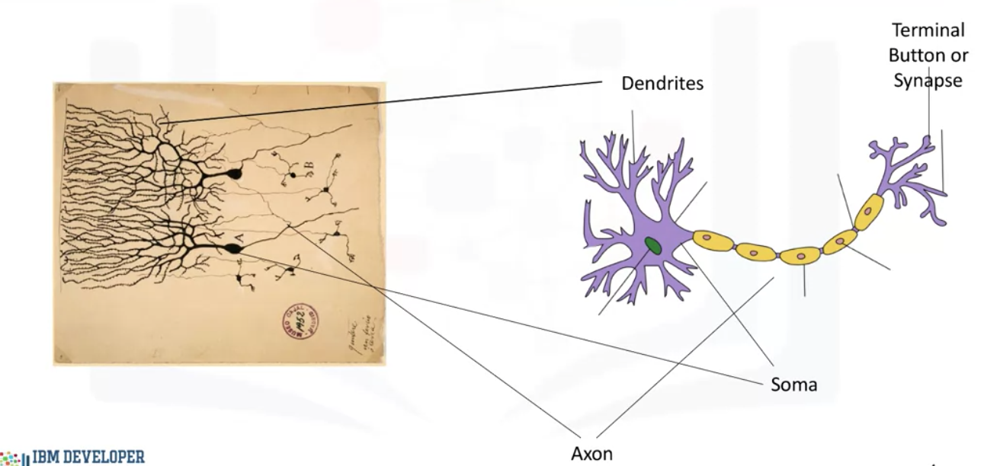

In [154]:
from IPython.display import Image
Image(filename='/Users/nikolas.anic/Desktop/ML/ML_Python_Certificate/NeuralNets.png')

For a network of neurons, we normally divide it into different layers: 

1. Input Layer
    - feeds the input into the network
2. Output Layer
    - set of nodes that provide the output of the network
3. Hidden Layers 
    - any sets of nodes in between the input and the output layers

When working with neural networks, the three main topics that we deal with are: 

1. forward propagation
2. backpropagation
3. activation functions. 

**Forward propagation** is the process through which **data passes through layers of neurons in a neural network from the input layer all the way to the output layer.** Let's use one neuron and mathematically formulate the way information flows through it. As shown here, the data flows through each neuron by connections or the dendrites. Every connection has a specific weight by which the flow of data is regulated. Here x1 and x2 are the two inputs, they could be an integer or float. When these inputs pass through the connections, they're adjusted depending on the connection weights, w1 and w2. The neuron then processes this information by outputting a weighted sum of these inputs. It also adds a constant to the sum which is referred to as the bias. So, z here is the **linear combination of the inputs and weights along with the bias, and a is the output of the network.**

However, simply outputting a weighted sum of the inputs limits the tasks that can be performed by the neural network. Therefore, a better processing of the data would be to map the weighted sum to a **nonlinear space.** A popular function is the **sigmoid function**, where if the weighted sum is a very large positive number, then the output of the neuron is close to 1, and if the weighted sum is a very large negative number, then the output of the neuron is close to zero. Non-linear transformations like the sigmoid function are called activation functions. 

**Activation functions** are another extremely important feature of artificial neural networks. They basically **decide whether a neuron should be activated or not.** In other words, whether the **information that the neuron is receiving is relevant or should be ignored.** The takeaway message here is that a neural network without an activation function is essentially just a linear regression model. The **activation function performs non-linear transformation to the input enabling the neural network of learning and performing more complex tasks, such as image classifications and language translations.**


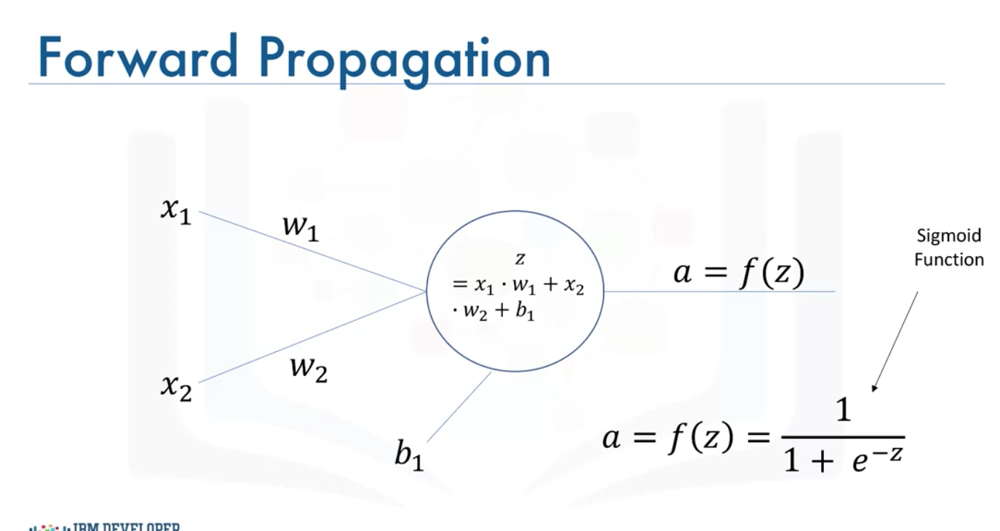

In [87]:
Image(filename='/Users/nikolas.anic/Desktop/ML/ML_Python_Certificate/Fd_Example.png')

Let's go over an example of how to compute the output. Let's say that the value of x1 is 0.1, and we want to predict the output for this input. The network has optimized weight and bias where w1 is 0.15 and b1 is 0.4. The first step is to calculate z, which is the dot product of the inputs and the corresponding weights plus the bias. So we find that z is 0.415. The neuron then uses the sigmoid function to apply non-linear transformation to z. Therefore, the output of the neuron is 0.6023. For a network with two neurons, the output from the first neuron will be the input to the second neuron. The rest is then exactly the same. The second neuron takes the input and computes the dot product of the input, which is a1 in this case, and the weight which is w2, and adds the bias which is b2. Using a sigmoid function as the activation function, the output of the network would be 0.7153. And this would be the predicted value for the input 0.1. 

This is in essence how a neural network predicts the output for any given input. No matter how complicated the network gets, it is the same exact process. To summarize, given a neural network with a set of weights and biases, you should be able to compute the output of the network for any given input.

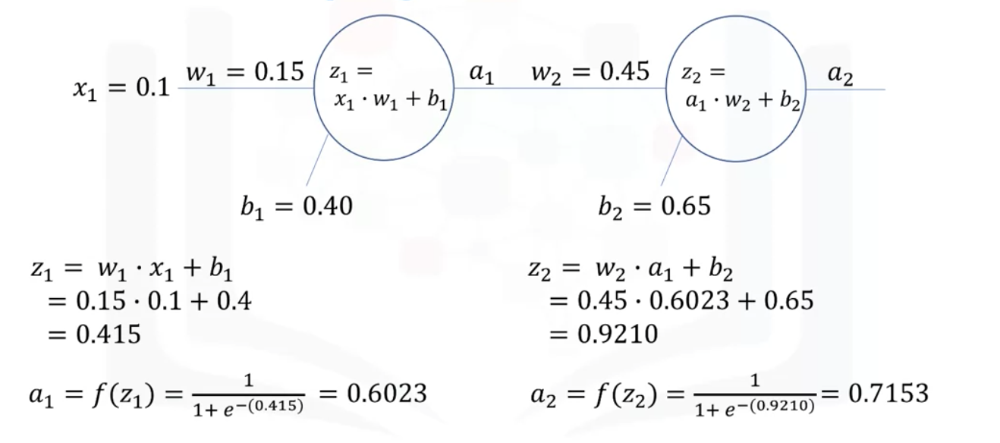

In [89]:
Image(filename='/Users/nikolas.anic/Desktop/ML/ML_Python_Certificate/Forward_Propagation.png')

Let's conceptualize this with an example-based function

In [155]:
# We crate a network which contains of the number of inputs, the number of hidden layers, 
# the number of hidden nodes per layer as well as the specified output and assign them weights and a bias term

def initialize_network(num_inputs, num_hidden_layers, num_nodes_hidden, num_outputs):
    
# First, we need an empty dataset (called network)

    network = {}
    num_nodes_previous = num_inputs
    
# Then, we define that for each layer in the network we assign and an output format (which then will consist of 
# weight and bias)

    for layer in range(num_hidden_layers + 1): 
        if layer == num_hidden_layers: # Here, we define the name and output for the last layer, the output layer
            layer_name = "output"
            layer_num = num_outputs
        else: 
            layer_name = "layer_{}".format(layer + 1) # Here, name and output for the hidden layers 
            layer_num = num_nodes_hidden[layer]
        
        network[layer_name] = {} # Now we define the data within each layer 
        
        for node in range(layer_num): 
            node_name = "node_{}".format(node + 1) # the name of each node 
            network[layer_name][node_name] = { # And the weights and bias per node 
                "weights" : np.around(np.random.uniform(size = num_nodes_previous), decimals = 2),
                "bias" : np.around(np.random.uniform(size = 1), decimals = 2)
            }
            
        num_nodes_previous = layer_num
        
    return network


In [138]:
small_network = initialize_network(5,3,[2,3,4],1)
small_network

{'layer_1': {'node_1': {'weights': array([0.92, 0.9 , 0.03, 0.96, 0.14]),
   'bias': array([0.28])},
  'node_2': {'weights': array([0.61, 0.94, 0.85, 0.  , 0.52]),
   'bias': array([0.55])}},
 'layer_2': {'node_1': {'weights': array([0.49, 0.77]), 'bias': array([0.16])},
  'node_2': {'weights': array([0.76, 0.02]), 'bias': array([0.14])},
  'node_3': {'weights': array([0.12, 0.31]), 'bias': array([0.67])}},
 'layer_3': {'node_1': {'weights': array([0.47, 0.82, 0.29]),
   'bias': array([0.73])},
  'node_2': {'weights': array([0.7 , 0.33, 0.33]), 'bias': array([0.98])},
  'node_3': {'weights': array([0.62, 0.95, 0.77]), 'bias': array([0.83])},
  'node_4': {'weights': array([0.41, 0.45, 0.4 ]), 'bias': array([1.])}},
 'output': {'node_1': {'weights': array([0.18, 0.96, 0.42, 0.42]),
   'bias': array([0.46])}}}

Then we compute the weighted sum at each node. The weighted sum at each node is computed as the dot product of the inputs and the weights plus the bias. So let's create a function called compute_weighted_sum that does just that.

In [139]:
def compute_weighted_sum(inputs, weights, bias):
    return np.sum(inputs * weights) + bias

In [144]:
# Generate five random inputs: 

from random import seed
import numpy as np

np.random.seed(12)
inputs = np.around(np.random.uniform(size=5), decimals=2)

print('The inputs to the network are {}'.format(inputs))

The inputs to the network are [0.15 0.74 0.26 0.53 0.01]


Recall that the output of each node is simply a non-linear tranformation of the weighted sum. We use activation functions for this mapping. Let's use the sigmoid function as the activation function here. So let's define a function that takes a weighted sum as input and returns the non-linear transformation of the input using the sigmoid function.

In [151]:
def node_activation(weighted_sum):
    return 1.0 / (1.0 + np.exp(-1 * weighted_sum))
node_activation(0.2675)

0.5664790559676278

The final piece of building a neural network that can perform predictions is to put everything together. So let's create a function that applies the *compute_weighted_sum* and *node_activation* functions to each node in the network and propagates the data all the way to the output layer and outputs a prediction for each node in the output layer.

The way we are going to accomplish this is through the following procedure:

1. Start with the input layer as the input to the first hidden layer.
2. Compute the weighted sum at the nodes of the current layer.
3. Compute the output of the nodes of the current layer.
4. Set the output of the current layer to be the input to the next layer.
5. Move to the next layer in the network.
5. Repeat steps 2 - 4 until we compute the output of the output layer.

In [148]:
def forward_propagate(network, inputs):
    
    layer_inputs = list(inputs) # start with the input layer as the input to the first hidden layer
    
    for layer in network:
        
        layer_data = network[layer]
        
        layer_outputs = [] 
        for layer_node in layer_data:
        
            node_data = layer_data[layer_node]
        
            # compute the weighted sum and the output of each node at the same time 
            node_output = node_activation(compute_weighted_sum(layer_inputs, node_data['weights'], node_data['bias']))
            layer_outputs.append(np.around(node_output[0], decimals=4))
            
        if layer != 'output':
            print('The outputs of the nodes in hidden layer number {} is {}'.format(layer.split('_')[1], layer_outputs))
    
        layer_inputs = layer_outputs # set the output of this layer to be the input to next layer

    network_predictions = layer_outputs
    return network_predictions
    

In [150]:
forward_propagate(small_network, inputs)
            

The outputs of the nodes in hidden layer number 1 is [0.8323, 0.8268]
The outputs of the nodes in hidden layer number 2 is [0.7693, 0.6876, 0.7362]
The outputs of the nodes in hidden layer number 3 is [0.8663, 0.8796, 0.926, 0.8721]


[0.9016]

## 1. Training a Neural Network

### A: Gradient Descent for Neural Nets

As we mentioned already in the logistic regressions, Gradient descent is an iterative optimization algorithm for finding the minimum of a function. To find the minimum of a function using gradient descent, one takes steps proportional to the negative of the gradient of the function at the current point. 

The main idea behind the gradient descent approach is to minimise the cost function on a sequential basis. 

##### The cost functions:

One way to define a cost function is through global minima detection, as long as we can ensure that our function indeed has a global minimum. This is based on the function: 

- $E = \frac{1}{2m}\sum^m_{i-1}(z_i- w*x_i)^2$

Another way to obtain the cost function is by transforming it into a log-loss function. That said, a log function which is negative, as it punishes being far away from the assignment, or treatment, group:.

- $-log(\hat{y}$ for y = 1

- $-log(1 - \hat{y})$ for y = 0

If we plug both into our previous cost function, we retrieve the log-transformed cost-function, which can easily be defined through a derivative: 

- $J(\theta) = -\frac{1}{m} * \sum^m_{i-1} y^{i}log(\hat{y}^{i}) + (1-y^{i})log(1-\hat{y}^{i})$

##### Gradient Descent to minimise the cost function: 

Gradient descent is an iterative approach to finding the minimum of a function. Specifically in our case gradient descent is a technique to **use the derivative of a cost function to change the parameter values to minimize the cost or error**. The basic idea is that we choose a random set of weights per parameter and iteratively minimise the loss function associated with their weights via a derivative approach. 

To do so, we follow certain steps: 

First, we define the loss function as given above. 

Then, we define states of weights assigned at random to define the position of the expected values and compare those with the observed values. 

Next, we calculate the loss function as the squared sum of the differences between expected and observed values and obtain the loss values. 

If the loss value is beyond a certain threshold, we must update our parameter values and re-calculate the loss function. In other words, we must direct the parameters towards values which minimise the loss function. 

To find how to update the parameters, we must calculate the **gradient of the cost function at that point**. The gradient is the slope of the surface at every point and the direction of the gradient is the direction of the greatest uphill. 

We calculate the gradient of a cost function at each point by taking the **partial derivative of the loss function with respect to each parameter at that point. (Hence if more than 1 parameter, you receive a vector of partial derivatives w1, w2,...,wN)** This gives you the slope of the move for each parameter at that point. 

The partial derivative of the cost function J is calculated using this expression (for logs): 

$\frac{\delta J}{\delta \theta_1} = - \frac{1}{m} \sum^m_{i=1}(y^{i} - \hat{y}^{i})*x^{i}_1$

A vector of all these slopes is the **gradient vector**, and we can use this vector to **change or update all the parameters**. 

Then, we **multiply the gradient value by a constant value mu**, which is called the **learning rate**. Learning rate, gives us additional control on how fast we move on the surface.

We take the **previous values of the parameters and subtract the error derivative** and obtain new weights: 

$New \theta = Old \theta - \mu * \triangle J$

This results in the new parameters for theta that we know will decrease the cost. 

We then iterate until the loss function is sufficiently smmall


Generally, we follow these five steps to find the optimal minimum of our cost function: 

1. Define independent variables for the sigmoid function which can model the probability of being in a group 
2. Calculate the sigmoid function (or other function) values through random parameter values 
3. Feed the cost function with the training set and calculate the cost (or errors) 
4. Calculate the gradient vector of the cost function as the partial derivative of each parameter combination
5. Update the weights of the parameters with the new values through the learning rate and gradient vector subtraction from the first weight
6. Repeat steps 2 to 5 until the cost function is sufficiently low 

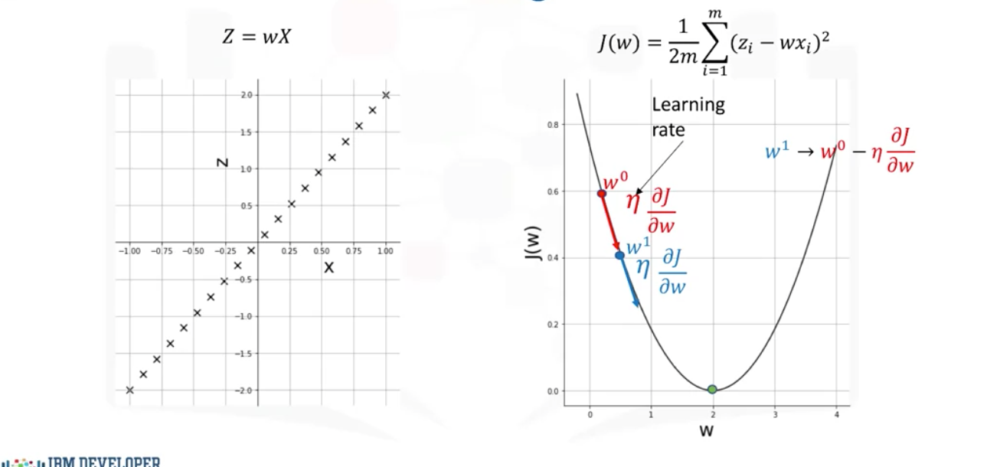

In [152]:
Image(filename='/Users/nikolas.anic/Desktop/ML/ML_Python_Certificate/GD1.png')

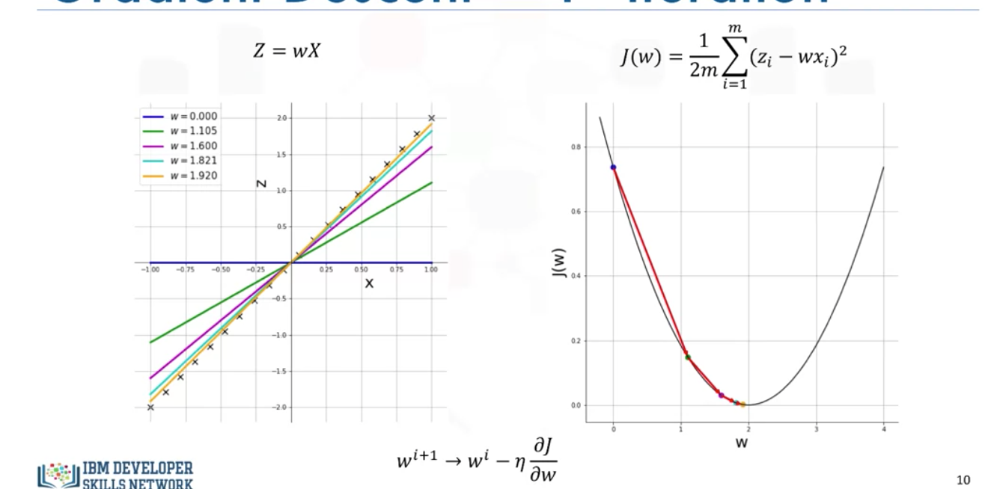

In [153]:
Image(filename='/Users/nikolas.anic/Desktop/ML/ML_Python_Certificate/GD2.png')

### B:  Backpropagating with the sygmoid function

Backpropagating describes the mechanism to choose optimal weights (w) as well as bias (b) terms for the neural network. 

In a neural net, the output value is associated with a ground truth value, which is basically the actual value the output has. The program compares each true value with its expected value and calculates the difference between these values. It assigns the training requirement if the values don't match accordingly. 

The difference calculated is called the error, which also defines the cost or loss value, discussed in the gradient descent setting. Therefore, the next step would be to propagate this error back into the network and use it to perform gradient descent on the different weights and biases in the network, to optimize them using the same equations

Therefore, the backpropagating consists of two steps: 

1. Calculate the error term of the output value 
2. Propagate the error back into the network and update each value accordingly by the following equations: 
    - $w_{i} = w_i - \eta * \frac{\delta E}{\delta w_i}$
    - $b_{i} = b_i - \eta * \frac{\delta E}{\delta b_i}$

In general, we do reverse engineering to obtain the derivative values back to the first step of the equation (where we calculate $z_1$ through $x_1$, $w_1$ and $b_1$

In our example with two neurons we therefore have to update $w_1, w_2, b_1, b_2$

Here, we follow these steps for $w_2$:

1. Calculate the error with two neurons: 
    - $E = \frac{1}{2}*(T-a_2)$
2. Calculate the new $w_2$ through the derivative: 
    - $w_{2} = w_2 - \eta * \frac{\delta E}{\delta w_2}$
3. To get the derivative value for $w_i$ we need to use the chain rule: 
    - $E = \frac{1}{2}*(T-a_2)$
    - $a_2 = f(z_2) = \frac{1}{1 + exp^{-z_2}}$
    - $z_2 = a_1*w_2 + b_2$
4. In the two-dimensional phase, this is: 
    - $\frac{\delta E}{\delta a_2} = (-T - a_2)$
    - $\frac{\delta a_2}{\delta z_2} = (a_2*(1- a_2))$
    - $\frac{\delta z_2}{\delta w_2} = (a_1)$
5. The chain rule is the multiplication of all derivatives: 
    - $(-T - a_2)*(a_2*(1- a_2))*a_1$
6. Subtract the gradient value multiplied with the learning rate from the old $w_2$:
    - $w_2 - \eta * (-T - a_2)*(a_2*(1- a_2))*a_1$
    
The steps for $w_1$ are quite similar, but here we need to obtain it back to $w_1$: 

1. Calculate the error with two neurons: 
    - $E = \frac{1}{2}*(T-a_2)$
    
2. Calculate the new w_2 through the derivative: 
    - $w_{1} = w_1 - \eta * \frac{\delta E}{\delta w_1}$
    
3. To get the derivative value for $w_i$ we need to use the chain rule: 
    - $E = \frac{1}{2}*(T-a_2)$
    - $a_2 = f(z_2) = \frac{1}{1 + exp^{-z_2}}$
    - $z_2 = a_1*w_2 + b_2$
    - $a_1 = f(z_1) = \frac{1}{1 + exp^{-z_1}}$
    - $z_1 = x_1*w_1 + b_1$
    
4. In the two-dimensional phase, this is: 
    - $\frac{\delta E}{\delta a_2} = (-T - a_2)$
    - $\frac{\delta a_2}{\delta z_2} = (a_2*(1- a_2))$
    - $\frac{\delta z_2}{\delta w_2} = (a_1)$
    - $\frac{\delta a_1}{\delta z_1} = (a_1)*(1-a_1)$
    - $\frac{\delta z_1}{\delta w_1} = (x_1)$
    
5. The chain rule is the multiplication of all derivatives: 
    - $(-T - a_2)*(a_2*(1- a_2))*a_1$
    
6. Subtract the gradient value multiplied with the learning rate from the old $w_2$:
    - $w_1 - \eta * (-T - a_2)*(a_2*(1- a_2))*a_1*(a_1*(1-a_1))*x_1$

We now have to do the same for $b_2$: 

1. Calculate the error with two neurons: 
    - $E = \frac{1}{2}*(T-a_2)$
    
2. Calculate the new w_2 through the derivative: 
    - $b_{2} = b_2 - \eta * \frac{\delta E}{\delta b_2}$
    
3. To get the derivative value for $w_i$ we need to use the chain rule: 
    - $E = \frac{1}{2}*(T-a_2)$
    - $a_2 = f(z_2) = \frac{1}{1 + exp^{-z_2}}$
    - $z_2 = a_1*w_2 + b_2$
    
4. In the two-dimensional phase, this is: 
    - $\frac{\delta E}{\delta a_2} = (-T - a_2)$
    - $\frac{\delta a_2}{\delta z_2} = (a_2*(1- a_2))$
    - $\frac{\delta z_2}{\delta b_2} = 1$
    
5. The chain rule is the multiplication of all derivatives: 
    - $(-T - a_2)*(a_2*(1- a_2))*1$
    
6. Subtract the gradient value multiplied with the learning rate from the old $b_2$:
    - $b_2 - \eta * (-T - a_2)*(a_2*(1- a_2))*1$
    
The steps for $b_1$ are, again, quite similar, but here we need to obtain it back to $b_1$: 

1. Calculate the error with two neurons: 
    - $E = \frac{1}{2}*(T-a_2)$
    
2. Calculate the new w_2 through the derivative: 
    - $w_{1} = w_1 - \eta * \frac{\delta E}{\delta w_1}$
    
3. To get the derivative value for $w_i$ we need to use the chain rule: 
    - $E = \frac{1}{2}*(T-a_2)$
    - $a_2 = f(z_2) = \frac{1}{1 + exp^{-z_2}}$
    - $z_2 = a_1*w_2 + b_2$
    - $a_1 = f(z_1) = \frac{1}{1 + exp^{-z_1}}$
    - $z_1 = x_1*w_1 + b_1$
    
4. In the two-dimensional phase, this is: 
    - $\frac{\delta E}{\delta a_2} = (-T - a_2)$
    - $\frac{\delta a_2}{\delta z_2} = (a_2*(1- a_2))$
    - $\frac{\delta z_2}{\delta w_2} = (a_1)$
    - $\frac{\delta a_1}{\delta z_1} = (a_1*(1-a_1)$
    - $\frac{\delta z_1}{\delta w_1} = 1$
    
5. The chain rule is the multiplication of all derivatives: 
    - $(-T - a_2)*(a_2*(1- a_2))*a_1$
    
6. Subtract the gradient value multiplied with the learning rate from the old $w_2$:
    - $b_1 - \eta * (-T - a_2)*(a_2*(1- a_2))*a_1*(a_1*(1-a_1))*1$

Now, through gradient descend for two neurons with each one w and b value, we obtain four gradient functions we multiply with the learning rate to obtain the correctly updated values according to partial derivatives: 

- $w_2 = w_2 - \eta * (-T - a_2)*(a_2*(1- a_2))*a_1$
- $w_1 = w_1 - \eta * (-T - a_2)*(a_2*(1- a_2))*a_1*(a_1*(1-a_1))*x_1$
- $b-2 = b_2 - \eta * (-T - a_2)*(a_2*(1- a_2))*1$
- $b_1 = b_1 - \eta * (-T - a_2)*(a_2*(1- a_2))*a_1*(a_1*(1-a_1))*1$

### C: Other activation functions

The issue with the sygmoid function is that it decreases gradually the effects or sizes of the earlier nodes, as it is a multiplication form with factors below zero. Hence, the learning ability of the earlier nodes is limited compared to that of the later ones. This is called **vanishing gradient problem**. 

Therefore, let's look at the most prominent activation functions for neural networks. 

1. Sigmoid function
    - leads to the vanishing gradient problem for the earlier layers
    - At z = 0, a is equal to 0.5 
    - When z is a very large positive number, a is close to 1
    - When z is a very large negative number, a is close to zero
    - Function is pretty flat beyond the +3 and -3 region.
        - Once the function falls in that region, the gradients become very small. 
        - This results in the vanishing gradient problem that we discussed
    - As the gradients approach 0, the network doesn't really learn. 
    - Values only range from 0 to 1. 
        - This means that the sigmoid function is not symmetric around the origin. 
        - The values received are all positive. 




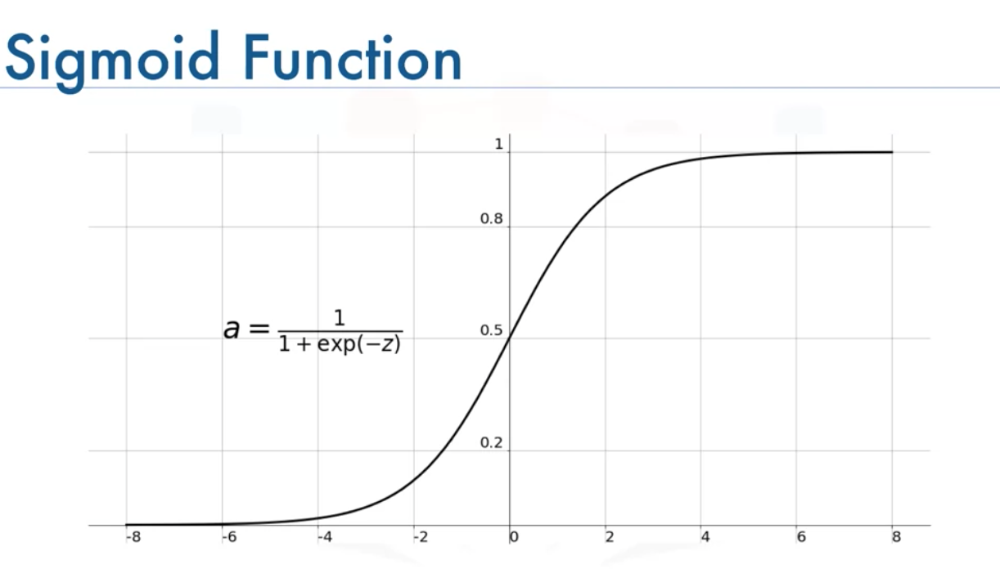

In [156]:
Image(filename='/Users/nikolas.anic/Desktop/ML/ML_Python_Certificate/sygmoid.png')

2. Hyperbolic tangent, or tanh, function
    - Scaled sigmoid function
    - Symmetric over the origin
    - It ranges from -1 to +1
    - Also leads to the vanishing gradient problem in very deep neural networks

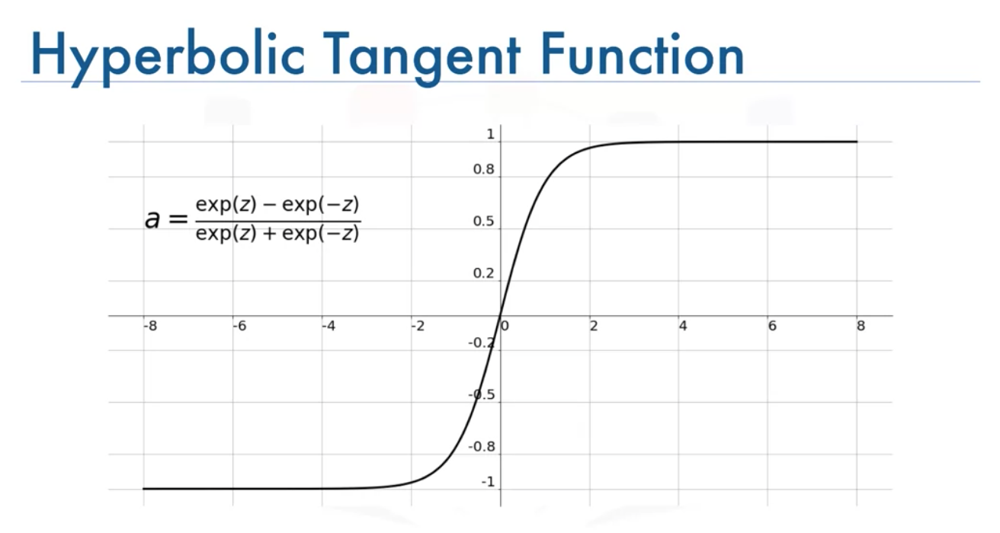

In [157]:
Image(filename='/Users/nikolas.anic/Desktop/ML/ML_Python_Certificate/tanh.png')

3. rectified linear unit (ReLU) function 
    -  most widely used activation function when designing networks 
    - nonlinear
    - Main advantage: Does not activate all the neurons at the same time 
    - If the input is negative it will be converted to 0, and the neuron does not get activated
        - This means that at a time, only a few neurons are activated, making the network sparse and very efficient 
    - No vanishing gradient problem 

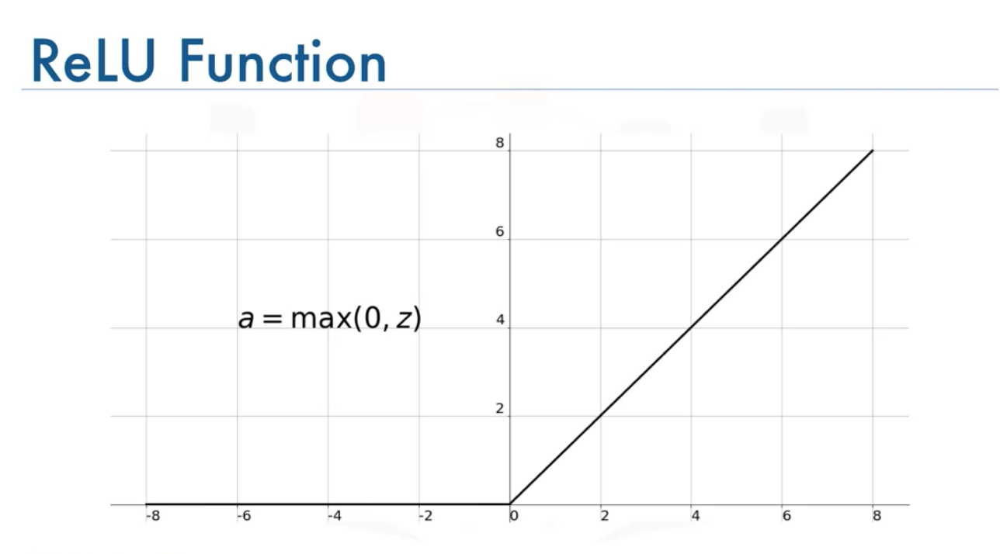

In [158]:
Image(filename='/Users/nikolas.anic/Desktop/ML/ML_Python_Certificate/relu.png')

4. Softmax function
    - A type of a sigmoid function 
    - Handy when we are trying to handle classification problems
    - Ideally used in the output layer of the classifier where we are actually trying to get the probabilities to define the class of each input
    - Function: $a_i = \frac{e^{z_i}}{\sum^m_{k=1} e^{z_k}}$

## 2. Introduction to Keras

Keras is one of the three most commonly used libraries when it comes to artificial, deep learning networks. Keras is especially well made for easy computing and quick analyses, as it is able to perform neural net tasks with only few lines of code. Keras is a high-level API for building deep learning models. It has gained favor for its ease of use and syntactic simplicity facilitating fast development. 

### A: Regression models with Keras

One possibility of using Keras is by calling it in a regression setting.

In [159]:
concrete_data = pd.read_csv('https://s3-api.us-geo.objectstorage.softlayer.net/cf-courses-data/CognitiveClass/DL0101EN/labs/data/concrete_data.csv')
concrete_data.head()

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Strength
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.99
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.89
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.27
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.05
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.30


In [161]:
concrete_data.shape

(1030, 9)

In [165]:
concrete_data.isnull().sum()

Cement                0
Blast Furnace Slag    0
Fly Ash               0
Water                 0
Superplasticizer      0
Coarse Aggregate      0
Fine Aggregate        0
Age                   0
Strength              0
dtype: int64

In [181]:
# Distribute the data into predictor and target variables: 

concrete_data_col = concrete_data.columns
predictors = concrete_data[concrete_data_col[concrete_data_col != "Strength"]]
target = concrete_data[concrete_data_col[concrete_data_col == "Strength"]]

In [183]:
predictors_norm = (predictors - predictors.mean()) / predictors.std() # standardize

In [185]:
n_cols = predictors_norm.shape[1] # number of predictors

8

In [190]:
import keras

In [186]:
from keras.models import Sequential
from keras.layers import Dense

In [192]:
def regression_model(): 
    model = Sequential()
    model.add(Dense(50, activation = "relu", input_shape = (n_cols, )))
    model.add(Dense(50, activation = "relu", input_shape = (n_cols, )))
    model.add(Dense(1)) # the three layers with 50 and 1 hidden and output node, respectively. 
    
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

In [193]:
model = regression_model()

In [194]:
# fit the model
model.fit(predictors_norm, target, validation_split=0.3, epochs=100, verbose=2)

Epoch 1/100
23/23 - 0s - loss: 1668.2013 - val_loss: 1164.1661
Epoch 2/100
23/23 - 0s - loss: 1546.9811 - val_loss: 1053.2347
Epoch 3/100
23/23 - 0s - loss: 1362.6389 - val_loss: 889.7974
Epoch 4/100
23/23 - 0s - loss: 1084.4366 - val_loss: 675.5062
Epoch 5/100
23/23 - 0s - loss: 736.3016 - val_loss: 456.5733
Epoch 6/100
23/23 - 0s - loss: 434.4312 - val_loss: 293.9365
Epoch 7/100
23/23 - 0s - loss: 285.1019 - val_loss: 221.3610
Epoch 8/100
23/23 - 0s - loss: 242.2100 - val_loss: 198.7705
Epoch 9/100
23/23 - 0s - loss: 223.3998 - val_loss: 189.9948
Epoch 10/100
23/23 - 0s - loss: 211.6031 - val_loss: 182.8966
Epoch 11/100
23/23 - 0s - loss: 201.3954 - val_loss: 180.2733
Epoch 12/100
23/23 - 0s - loss: 193.1515 - val_loss: 175.3934
Epoch 13/100
23/23 - 0s - loss: 186.3301 - val_loss: 173.6067
Epoch 14/100
23/23 - 0s - loss: 180.8284 - val_loss: 173.0802
Epoch 15/100
23/23 - 0s - loss: 175.0386 - val_loss: 170.4644
Epoch 16/100
23/23 - 0s - loss: 170.4081 - val_loss: 167.8742
Epoch 17/10

### B: Classification with Keras:

In [234]:
from keras.utils import to_categorical
from keras.datasets import mnist

In [235]:
(X_train, y_train), (X_test, y_test) = mnist.load_data()

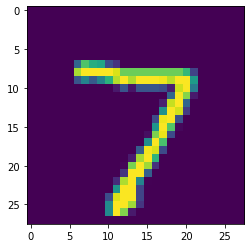

In [239]:
plt.imshow(X_test[0])

Problem is here: We cannot simply feed the network these images as keras cannot digest them. So we need to flatten the images into one-dimensional vectors, each of size 1 x (28 x 28) = 1 x 784. This means each datapoint, or image, gets a vector consisting of 784 rows indicating the values for each pixel. Here, a value of 0 clearly indicates one of the purple fields, while nonzero values indicate different sets of colours. 

In [240]:
num_pixels = X_train.shape[1] * X_train.shape[2] # find the correct number of pixels

X_train = X_train.reshape(X_train.shape[0], num_pixels).astype("float32")
X_test = X_test.reshape(X_test.shape[0], num_pixels).astype("float32")

In [242]:
# Since pixel values can range from 0 to 255, let's normalize the vectors to be between 0 and 1.

X_train = X_train / 255
X_test = X_test / 255

In [243]:
# Finally, before we start building our model, remember that for classification we need to divide our 
# target variable into categories. We use the to_categorical function from the Keras Utilities package.

y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

num_classes = y_test.shape[1]
print(num_classes)


10


In [221]:
def classification_model():
    # create model
    model = Sequential()
    model.add(Dense(num_pixels, activation='relu', input_shape=(num_pixels,)))
    model.add(Dense(100, activation='relu'))
    model.add(Dense(num_classes, activation='softmax')) # softmax used for probability of belonging into one of the 10 
                                                        # values for shapes of y
    
    
    # compile model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

In [223]:
model = classification_model()

In [224]:
model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10, verbose=2)

# evaluate the model
scores = model.evaluate(X_test, y_test, verbose=0)

Epoch 1/10
1875/1875 - 9s - loss: 0.1877 - accuracy: 0.9422 - val_loss: 0.0851 - val_accuracy: 0.9732
Epoch 2/10
1875/1875 - 10s - loss: 0.0781 - accuracy: 0.9760 - val_loss: 0.0942 - val_accuracy: 0.9697
Epoch 3/10
1875/1875 - 9s - loss: 0.0518 - accuracy: 0.9833 - val_loss: 0.0829 - val_accuracy: 0.9753
Epoch 4/10
1875/1875 - 8s - loss: 0.0399 - accuracy: 0.9874 - val_loss: 0.0693 - val_accuracy: 0.9817
Epoch 5/10
1875/1875 - 8s - loss: 0.0302 - accuracy: 0.9902 - val_loss: 0.0723 - val_accuracy: 0.9800
Epoch 6/10
1875/1875 - 7s - loss: 0.0254 - accuracy: 0.9920 - val_loss: 0.0662 - val_accuracy: 0.9812
Epoch 7/10
1875/1875 - 8s - loss: 0.0234 - accuracy: 0.9924 - val_loss: 0.0767 - val_accuracy: 0.9814
Epoch 8/10
1875/1875 - 8s - loss: 0.0189 - accuracy: 0.9941 - val_loss: 0.0836 - val_accuracy: 0.9822
Epoch 9/10
1875/1875 - 9s - loss: 0.0165 - accuracy: 0.9946 - val_loss: 0.0840 - val_accuracy: 0.9830
Epoch 10/10
1875/1875 - 8s - loss: 0.0150 - accuracy: 0.9953 - val_loss: 0.0822 -

In [225]:
print('Accuracy: {}% \n Error: {}'.format(scores[1], 1 - scores[1]))    

Accuracy: 0.984000027179718% 
 Error: 0.015999972820281982


Sometimes, you cannot afford to retrain your model everytime you want to use it, especially if you are limited on computational resources and training your model can take a long time. Therefore, with the Keras library, you can save your model after training. To do that, we use the save method.

In [226]:
model.save('classification_model.h5')

In [227]:
from keras.models import load_model
pretrained_model = load_model('classification_model.h5')

## 3. Supervised & Unsupervised Deep Learning Methods

### A: Convolutional Neural networks

Convolutional Neural Networks are NN whose property is that they can handle images as input factors. This is especially handy, since, as opposed to the method above, we are no longer required to transform each image into a n * 1 vector before the algorithm can be read. Therefore, CNNs are best for solving problems related to image recognition, object detection, and other computer vision applications. 

Here is a typical architecture of a convolutional neural network. As you can see, the network consists of a series of convolutional, ReLU, and pooling layers as well as a number of fully connected layers which are necessary before the output is generated.

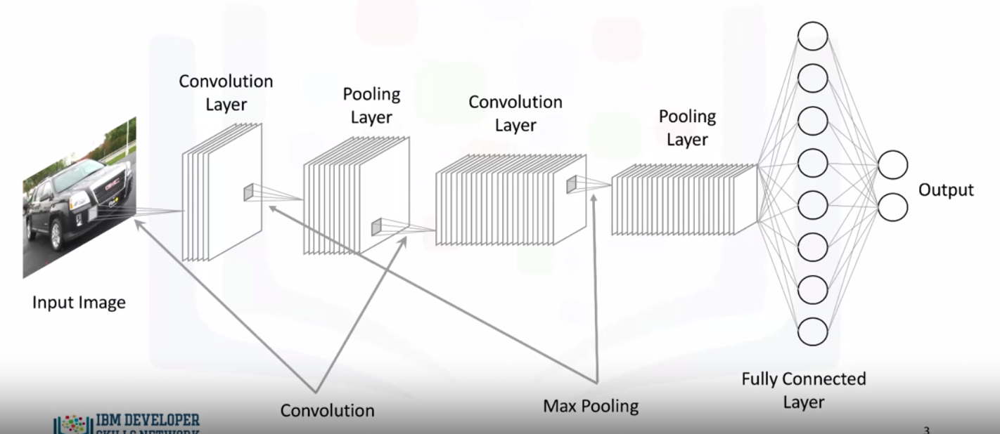

In [244]:
Image(filename='/Users/nikolas.anic/Desktop/ML/ML_Python_Certificate/CNN_Arch.png')

So far, we have dealt only with conventional neural networks that take an ( n x 1) vector as their input. The input to a convolutional neural network, on the other hand, is mostly an (n x m x 1) for grayscale images or an (n x m x 3) for colored images, where the number 3 represents the red, green, and blue components of each pixel in the image. 

In the **convolutional layer**, we basically define filters and we compute the convolution between the defined filters and each of the three images. If we take the red image for example, let's assume these are the pixel values. Now for a (2 x 2) filter with these values, let's create an empty matrix to save the results of the convolution process. We start by sliding the filter over the image and computing the dot product between the filter and the overlapping pixel values and storing the result in the empty matrix. We repeat this step moving our filter one cell at a time, and we repeat this until we cover the entire image and fill the empty matrix. The more filters we use, the more we are able to preserve the spatial dimensions better. 

It is worth mentioning that a convolutional layer also consists of ReLUs which filter the output of the convolutional step passing only positive values and turning any negative values to 0. 

The next layer in our convolutional neural network is the **pooling layer.** The pooling layer's main objective is to reduce the spatial dimensions of the data propagating through the network. There are two types of pooling that are widely used in convolutional neural networks. Max- pooling and average pooling. In max-pooling (average) which is the most common of the two, for each section of the image we scan we keep the highest (average) value. like so. In addition to reducing the dimension of the data, pooling, or max pooling in particular, provides spatial variance which enables the neural network to recognize objects in an image even if the object does not exactly resemble the original object. 

Finally, in the **fully connected layer**, we flatten the output of the last convolutional layer and connect every node of the current layer with every other node of the next layer. This layer basically **takes as input the output from the preceding layer** whether it is a convolutional layer, ReLU, or pooling layer, and **outputs an n-dimensional vector, where n is the number of classes** pertaining to the problem at hand. For example, if you are building a network to classify images of digits, the dimension n would be 10, since there are 10 digits. 

As mentioned, opposed to the Classification in which we had to set up an n*1 input vector, we can now simply insert the data into image format of n * m * 3 (1). To do so, we include: 

- First a convolutional layer, which consists of: 
    - The number of filters for each image 
    - Size of each filter
    - The slice magnitude in horizontal and vertical direction
    - The activation function
- Next a pooling layer, which consists of:: 
    - pooling size per filter 
    - slice magnitude in horizontal & vertical direction
- Then we add the convo-pool combination again, with the differecne that the number of filters in each image doubles 
- Next we flatten the filters to get the data to the fully-connected layer
- Last, we add another dense layer and finally the output layer with input = number of classes & output = softmax (for probabilities)

In [247]:
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.utils import to_categorical
from keras.layers.convolutional import Conv2D # to add convolutional layers
from keras.layers.convolutional import MaxPooling2D # to add pooling layers
from keras.layers import Flatten # to flatten data for fully connected layers

In [248]:
(X_train, Y_train), (X_test, Y_test) = mnist.load_data()

# reshape to be [samples][pixels][width][height]
X_train = X_train.reshape(X_train.shape[0],28,28,1).astype("float32")
X_test = X_test.reshape(X_test.shape[0], 28,28,1).astype("float32")

In [250]:
X_train = (X_train / 255)
X_test = X_test / 255

In [252]:
Y_train = to_categorical(Y_train)
Y_test = to_categorical(Y_test)

In [257]:
def convolutional_model(): 
    model = Sequential()
    model.add(Conv2D(16, (5,5), strides = (1,1), activation = "relu", input_shape = (28,28,1)))
    model.add(MaxPooling2D(pool_size = (2,2), strides = (1,1)))
    
    model.add(Conv2D(8, (2,2), strides = (1,1), activation = "relu"))
    model.add(MaxPooling2D(pool_size = (2,2), strides = (1,1)))
    
    model.add(Flatten())
    model.add(Dense(100, activation = "relu"))
    model.add(Dense(num_classes, activation = "softmax"))
    
    model.compile(optimizer = "adam", loss = "categorical_crossentropy", metrics = ["accuracy"])
    return model 

In [258]:
model = convolutional_model()

model.fit(X_train, Y_train, validation_data = (X_test, Y_test), epochs=10, batch_size=200, verbose=2)
scores = model.evaluate(X_test, y_test, verbose=0)
print("Accuracy: {} \n Error: {}".format(scores[1], 100-scores[1]*100))

Epoch 1/10
300/300 - 35s - loss: 0.2160 - accuracy: 0.9371 - val_loss: 0.0760 - val_accuracy: 0.9760
Epoch 2/10
300/300 - 33s - loss: 0.0611 - accuracy: 0.9815 - val_loss: 0.0516 - val_accuracy: 0.9822
Epoch 3/10
300/300 - 37s - loss: 0.0468 - accuracy: 0.9851 - val_loss: 0.0437 - val_accuracy: 0.9849
Epoch 4/10
300/300 - 40s - loss: 0.0348 - accuracy: 0.9892 - val_loss: 0.0407 - val_accuracy: 0.9870
Epoch 5/10
300/300 - 36s - loss: 0.0289 - accuracy: 0.9911 - val_loss: 0.0416 - val_accuracy: 0.9867
Epoch 6/10
300/300 - 34s - loss: 0.0226 - accuracy: 0.9930 - val_loss: 0.0366 - val_accuracy: 0.9880
Epoch 7/10
300/300 - 32s - loss: 0.0191 - accuracy: 0.9938 - val_loss: 0.0361 - val_accuracy: 0.9878
Epoch 8/10
300/300 - 35s - loss: 0.0165 - accuracy: 0.9947 - val_loss: 0.0336 - val_accuracy: 0.9906
Epoch 9/10
300/300 - 33s - loss: 0.0128 - accuracy: 0.9957 - val_loss: 0.0418 - val_accuracy: 0.9888
Epoch 10/10
300/300 - 33s - loss: 0.0115 - accuracy: 0.9962 - val_loss: 0.0460 - val_accura

### B: Recurrent Neural Networks

So far, we have seen neural networks and deep learning models that see datapoints as independent instances. That saidd, the entire process of learning was based on the idea that each datapoint for itself has a forwardd propagation which does not cross with other datapoints. 

Recurrent neural networks overcome this issue. Recurrent neural networks are networks with loops that don't just take a new input at a time, but also take in as input the output from the previous dat point that was fed into the network.

Essentially, we can start with a normal neural network. At time t = 0, the network takes in input x0 and outputs a0. Then, at time t = 1, in addition to the input x1, the network also takes a0 as input, weighted with weight w0,1, and so on and so forth.



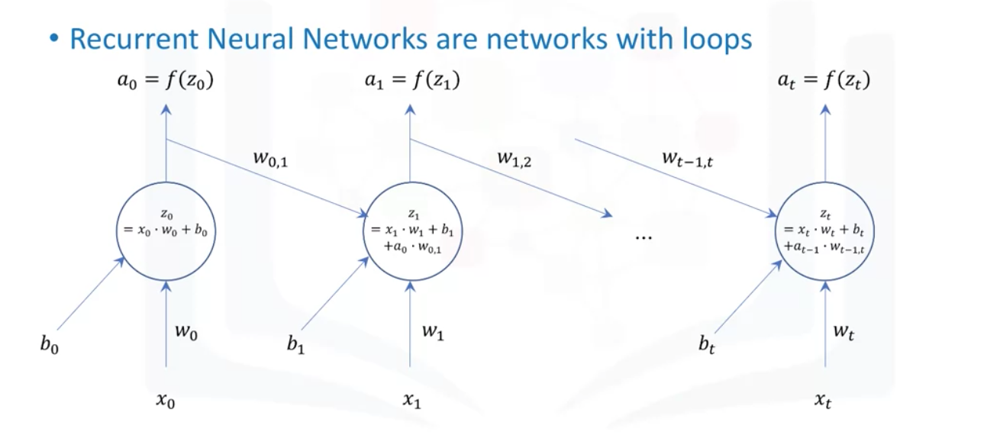

In [245]:
Image(filename='/Users/nikolas.anic/Desktop/ML/ML_Python_Certificate/RNN_Arch.png')

As a result, recurrent neural networks are very good at modelling patterns and sequences of data, such as texts, genomes, handwriting, and stock markets. **These algorithms take time and sequence into account, which means that they have a temporal dimension**.

A very popular type of recurrent neural network is the long short-term memory model or the (LSTM) model for short. It has been successfully used for many applications including image generation, handwriting generation or describing images as well as streams of videos. 

### C: Autoencoders: Unsupervised Learning 

Autoencoding is a data compression algorithm where the compression and the decompression functions are learned automatically from data, instead of being engineered by a human. Such autoencoders are built using neural networks. 

Autoencoders are data specific, which means that they will only be able to compress data similar to what they have been trained on. Therefore, an autoencoder trained on pictures of cars would do a rather poor job of compressing pictures of buildings, because the features it would learn would be vehicle or car specific. 

Some interesting applications of autoencoders are **data denoising and dimensionality reduction for data visualization.** 

Here is the architecture of an autoencoder. It takes an image, for example, as an input and uses an encoder to find the optimal compressed representation of the input image. Then, using a decoder the original image is restored. 



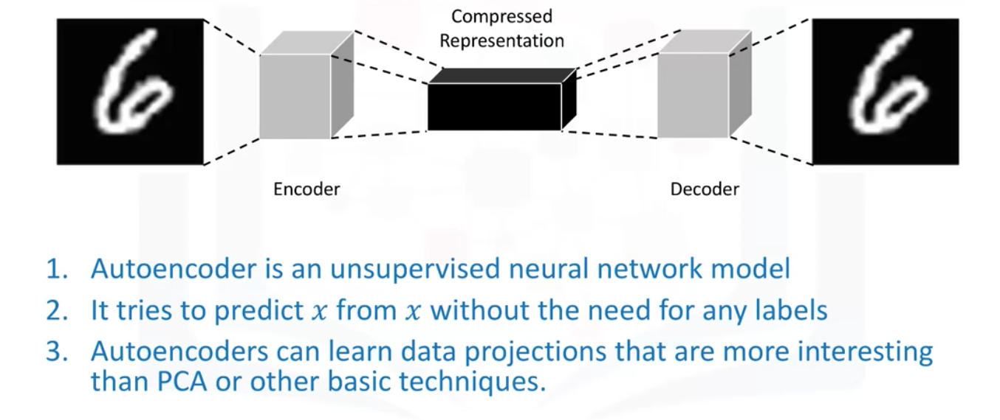

In [246]:
Image(filename='/Users/nikolas.anic/Desktop/ML/ML_Python_Certificate/Autoencoders.png')

So an autoencoder is an unsupervised neural network model. It uses **backpropagation by setting the target variable to be the same as the input**. In other words, it **tries to learn an approximation of an identity function.**

Because of **non-linear activation functions** in neural networks, autoencoders can learn data projections that are more interesting than a principal component analysis PCA or other basic techniques, which can handle only linear transformations. 

A very popular type of autoencoders is the **Restricted Boltzmann Machines**. RBMs have been successfully used for various applications, including **fixing imbalanced datasets**. 
Because RBMs **learn the input in order to be able to regenerate it, they can learn the distribution of the minority class in an imbalanced dataset and then generate more data points of that class**, transforming the imbalance dataset into a balanced data set. Similarly, RBMs can also be used to **estimate missing values in different features** of a data set. Another popular application of Restricted Boltzmann Machines is **automatic feature extraction** of especially unstructured data.

# Chapter 2: Scalable ML on Big Data using Apache Spark

## 1. Understanding how Apache Spark works:

### A: Parallel data processing in Apache Spark

When we talk about ApacheSpark, we talk about a Java Virtual Machine. The underlying execution engine in ApacheSpark is written in it's color, a JVM compatible programming language.

If we want to use large compute clusters but still don't want to take care of parallelizing our programs, ApacheSpark kicks in. Let's turn our single node JVM application into a so called driver program which is not involved in any computations anymore, but only managing remote Compute Nodes. We call those Compute Nodes the Worker Nodes. And those remote Compute Nodes at JVM is running, and they are responsible for executing your parallel version of your analytics workflow.

Basically there are two options for attaching to an ApacheSpark cluster. 

The simplest one is using an off node storage approach, where the third system is attached to the cluster using a fast network connection. In case high out bandwidth is needed a certain type of network technology called switching fabric is used which guarantees the maximum network performance between the storage system and the worker nodes. In this course, we will only use this topology.

The other option is that you can simply attach hard drives directly to the worker nodes. This is called the JBOD approach, Just a Bunch Of Discs, or sometimes this approach is called directly attached storage.
In order to retrieve the combined storage capacity of all disks as one large virtual file system, we have to add a software component to the cluster. This component is called HDFS which stands for Hadoop Distributed File System. HDFS creates a virtual view on top of the individual chunks of which the entire data consists so that it can be treated as a single large file spanning the whole cluster. 

One advantage of the technology is data locality. Since HDFS is aware of the location of individual chunks of the file, computations can be done in parallel using CPU's residing on the same physical worker node. The central first class citizen in the ApacheSpark is the so called **Resilient Distributed Dataset RDD.**

Once an RDD is created, it resides distributed in the main memory of the different worker nodes. When the aggregated main memory of all the worker nodes is not sufficient, then data gets split to disk. Finally, RDDs are lazy. That means only if the data is really needed for a certain computation, it is read from the underlying storage system, otherwise not.

Once we execute an RDD code, this triggers the execution of a spark trip which gets divided into individual spark tasks. Those spark tasks are executed in parallel on the cluster using this spark executor JVMs. 

Other programming becomes easy when using ApacheSpark because when using the RDD API you simply can't write non parallel programs.

It doesn't matter how much data you process, the program always stays the same. RDD provides the central API for achieving this. And you don't have to worry about data and task distribution. ApacheSpark will handle this for you.

### B: Functional Programing basics

We are ready to explore Para-programming on Apache Spark. This requires the basic understanding of functional programming.

Functional programming, or FP, makes use of the mathematical concept called lambda calculus. To keep it very simple, it basically says that every computation can be expressed as an anonymous function which is applied to a data set.

Lambda Calculus is too incomplete which basically means that you can convert any program into a pure function of program using Lambda Calculus. So, how does this work? In FP, a function is fitted the same way as a constant, variable or object. So basically, a function kind of functions as parameters, and also return functions as a result of a call.

So let's consider a function called function creator, which is a recite of being called can return a function. You can even return a function, which itself can return other functions. This function actually takes a value, increments it by 1, and returns it. Let's consider a data set in this case a list of integers with cardinality 4. In functional programming you actually can apply a function to a list. This means that the function is sent to the list, and applied to each element of the list, and the result of each function call basically generates a new list. And the new list reflects the computation, which the function expresses. So each element is incremented by 1. 

In procedural or object-oriented programming paradigms, you would have to iterate over the list and then increment each element. But in functional programming, the computation basically is sent to the data, and this makes it very easy to parallelize. 

So how does parallelization work on Apache Spark? Basically we just take the function and apply it to the data.

But now, let's consider that a data set is so big that we have to distribute it on multiple notes.

This can be done using HTFS the Hadoop distributed file system as mentioned in the previous lecture. And by using RDDs, your data automatically gets distributed among the main memory and disk storage of the cluster nodes in an Apache Spark cluster. Now, we sent the function over the network to all Apache Spark worker nodes, and apply to subsets of the data on each of the worker nodes. The final result is the same as it would have applied the function on only a single node.

But note, this case our function was running three times in parallel without requiring changes to the function or code.

In [46]:
!pip install pyspark==2.4.5

You should consider upgrading via the '/Users/nikolas.anic/opt/anaconda3/bin/python -m pip install --upgrade pip' command.


In [47]:
try:
    from pyspark import SparkContext, SparkConf
    from pyspark.sql import SparkSession
except ImportError as e:
    printmd('<<<<<!!!!! Please restart your kernel after installing Apache Spark !!!!!>>>>>')

In [48]:
sc = SparkContext.getOrCreate(SparkConf().setMaster("local[*]"))

spark = SparkSession \
    .builder \
    .getOrCreate()

In [39]:
rdd = sc.parallelize(range(100))

In [42]:
rdd.sum()

4950

In [43]:
rdd.count()

100

In [45]:
#let's shuffle our list to make it a bit more interesting
from random import shuffle
l = list(range(100))
shuffle(l)

In [46]:
rdd = sc.parallelize(l)

In [55]:
# And create a function lambda
rdd.filter(lambda i: i > 50).collect()

[76,
 97,
 74,
 80,
 53,
 95,
 51,
 71,
 57,
 54,
 99,
 66,
 89,
 70,
 90,
 78,
 62,
 73,
 68,
 55,
 65,
 64,
 87,
 60,
 72,
 82,
 67,
 86,
 61,
 75,
 98,
 56,
 91,
 94,
 88,
 96,
 85,
 93,
 84,
 69,
 58,
 92,
 59,
 63,
 77,
 52,
 83,
 81,
 79]

In [49]:
# Let’s consider the same list of integers. Now we want to compute the sum for elements in that list which are 
# greater than 50 but less than 75.

In [51]:
rdd.filter(lambda x: x>50).filter(lambda x: x < 75).sum()

1500

In [54]:
rdd.reduce(lambda a,b : a+b) # Which is the arithmetic sum

4950

### C: Datasets in ApacheSparkSQL

Apache Spark SQL provides an LC 2003 compliant SQL interface to your data. The RDD is still a first class citizen, so what ApacheSparkSQL basically does is wrapping the RDD with a DataFrame object actually abstracting the API to a relational one. We will cover the SQL API, which enables you to write ordinary NCS query statements against your data. 

RDDs are in inherently schema less, so when using data frames a schema is maintained as meter information on top of the RDD. Schemas can be implicit, lazy and inferred automatically from the data read or also explicitly defined. 

Independently, if you are using SQL or the DataFrame API, or both at the same time, internally Apache Spark **creates a so-called abstract syntax tree out of this.** This tree can be rearranged and transformed to generate an execution plan which performs best. This is where a catalyst optimizer kicks in. Having a schema allows the so called **catalyst optimizer to create a logical query execution plan from your SQL abstract syntax tree.** The LEP is then compiled into many physical execution plans, and based on cost based statistics on the size of different data sets involved, and optimal PEP is chosen.

So, how do we use SparkSQL? 

First, we have to create a so-called sparkSession object. Now we will create a spark data frame from a cloudant database directory. We use the spark session object, and the cloudant spark connector for doing this. We have to provide a cloudant.host name, the cloudant.username, and the cloudant.password, to the connector. Finally, we specified a cloudant database where we want to read data from. 

Then we can create a query the data frame using SQL. First, we have to register it has a virtual temporary table. Now we can use this temporary table to issue SQL queries against the data frame originating from data within cloudant. The show function on the data frame, somehow similar to the RDDs take function, shows us the first 20 entries in the table.

Let’s create a little data frame:

In [56]:
from pyspark.sql import Row

df = spark.createDataFrame([Row(id=1, value='value1'),Row(id=2, value='value2')])

# let's have a look what's inside
df.show()

# let's print the schema
df.printSchema()

+---+------+
| id| value|
+---+------+
|  1|value1|
|  2|value2|
+---+------+

root
 |-- id: long (nullable = true)
 |-- value: string (nullable = true)



Now we register this DataFrame as query table and issue an SQL statement against it. Please note that the result of the SQL execution returns a new DataFrame we can work with.

In [57]:
# register dataframe as query table
df.createOrReplaceTempView('df_view')

# execute SQL query
df_result = spark.sql('select value from df_view where id=2')

# examine contents of result
df_result.show()

# get result as string
df_result.first().value

+------+
| value|
+------+
|value2|
+------+



'value2'

In [58]:
df.count()

2

## 2. Parallel Programing on ApacheSpark:

In this section, we're going to have a look at the most common data distribution forms in Apache Spark. 

In [59]:
# download the file containing the data in PARQUET format: 

!wget https://github.com/IBM/coursera/raw/master/hmp.parquet

--2020-08-26 14:27:53--  https://github.com/IBM/coursera/raw/master/hmp.parquet
Resolving github.com (github.com)... 140.82.121.3
Connecting to github.com (github.com)|140.82.121.3|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://github.com/IBM/skillsnetwork/raw/master/hmp.parquet [following]
--2020-08-26 14:27:53--  https://github.com/IBM/skillsnetwork/raw/master/hmp.parquet
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/IBM/skillsnetwork/master/hmp.parquet [following]
--2020-08-26 14:27:53--  https://raw.githubusercontent.com/IBM/skillsnetwork/master/hmp.parquet
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.112.133
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.112.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 932997 (911K) [application/octet-stream]
Sav

In [60]:
park = spark.read.parquet("hmp.parquet")

In [65]:
# register a corresponding query table
park.createOrReplaceTempView('df')

In [66]:
park.show()
park.printSchema()

+---+---+---+--------------------+-----------+
|  x|  y|  z|              source|      class|
+---+---+---+--------------------+-----------+
| 22| 49| 35|Accelerometer-201...|Brush_teeth|
| 22| 49| 35|Accelerometer-201...|Brush_teeth|
| 22| 52| 35|Accelerometer-201...|Brush_teeth|
| 22| 52| 35|Accelerometer-201...|Brush_teeth|
| 21| 52| 34|Accelerometer-201...|Brush_teeth|
| 22| 51| 34|Accelerometer-201...|Brush_teeth|
| 20| 50| 35|Accelerometer-201...|Brush_teeth|
| 22| 52| 34|Accelerometer-201...|Brush_teeth|
| 22| 50| 34|Accelerometer-201...|Brush_teeth|
| 22| 51| 35|Accelerometer-201...|Brush_teeth|
| 21| 51| 33|Accelerometer-201...|Brush_teeth|
| 20| 50| 34|Accelerometer-201...|Brush_teeth|
| 21| 49| 33|Accelerometer-201...|Brush_teeth|
| 21| 49| 33|Accelerometer-201...|Brush_teeth|
| 20| 51| 35|Accelerometer-201...|Brush_teeth|
| 18| 49| 34|Accelerometer-201...|Brush_teeth|
| 19| 48| 34|Accelerometer-201...|Brush_teeth|
| 16| 53| 34|Accelerometer-201...|Brush_teeth|
| 18| 52| 35|

This is a classical classification data set. One thing we always do during data analysis is checking if the classes are balanced. In other words, if there are more or less the same number of example in each class. Let’s find out by a simple aggregation using SQL.

In [68]:
park.groupBy('class').count().show()

+--------------+-----+
|         class|count|
+--------------+-----+
| Use_telephone|15225|
| Standup_chair|25417|
|      Eat_meat|31236|
|     Getup_bed|45801|
|   Drink_glass|42792|
|    Pour_water|41673|
|     Comb_hair|23504|
|          Walk|92254|
|  Climb_stairs|40258|
| Sitdown_chair|25036|
|   Liedown_bed|11446|
|Descend_stairs|15375|
|   Brush_teeth|29829|
|      Eat_soup| 6683|
+--------------+-----+



Let’s create a bar plot from this data. We’re using the pixidust library, which is Open Source, because of its simplicity. But any other library like matplotlib is fine as well.

In [72]:
!pip install pixiedust
import pixiedust

     |████████████████████████████████| 197 kB 1.9 MB/s eta 0:00:01
     |████████████████████████████████| 1.0 MB 4.1 MB/s eta 0:00:01
  Using cached astunparse-1.6.3-py2.py3-none-any.whl (12 kB)
  Using cached Markdown-3.2.2-py3-none-any.whl (88 kB)
  Created wheel for pixiedust: filename=pixiedust-1.1.18-py3-none-any.whl size=321728 sha256=f14ae2d72c4a4201654da67f0b13c90ceb8f9fa309a4d67333692dd3c12e93ac
  Stored in directory: /Users/nikolas.anic/Library/Caches/pip/wheels/41/4c/20/08a843440aaeffc976c1848c9eb44be6ec68dcd964421ec6f7
  Created wheel for mpld3: filename=mpld3-0.5.1-py3-none-any.whl size=364062 sha256=5b6abe82cae91c475d8f46ec2fdcf860f72532500dbcad23f0f1338fb59decaf
  Stored in directory: /Users/nikolas.anic/Library/Caches/pip/wheels/b9/36/27/d61b9f1327012961fa31f05a20b190f836dd3fcb1c0264177b
Successfully built pixiedust mpld3
You should consider upgrading via the '/Users/nikolas.anic/opt/anaconda3/bin/python -m pip install --upgrade pip' command.
Pixiedust database opened

Pixiedust runtime updated. Please restart kernel
Table SPARK_PACKAGES created successfully
Table USER_PREFERENCES created successfully
Table service_connections created successfully


AnalysisException: "cannot resolve '`class`' given input columns: [id, value];;\n'Aggregate ['class], ['class, count(1) AS count#100L]\n+- LogicalRDD [id#0L, value#1], false\n"


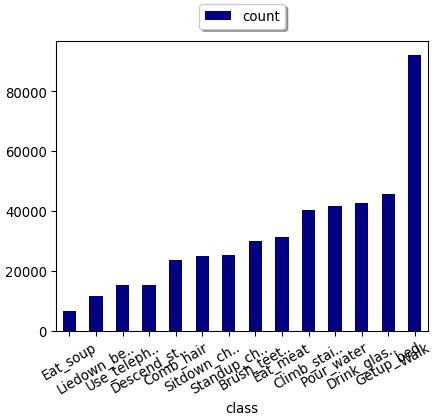

In [ ]:
from pyspark.sql.functions import col
counts = park.groupBy('class').count().orderBy('count')
display(counts)

we can aggregate further to obtain some quantitative metrics on the imbalance like, min, max, mean and standard deviation. If we divide max by min we get a measure called minmax ration which tells us something about the relationship between the smallest and largest class

In [75]:
from pyspark.sql.functions import col, min, max, mean, stddev

park \
    .groupBy('class') \
    .count() \
    .select([ 
        min(col("count")).alias('min'), 
        max(col("count")).alias('max'), 
        mean(col("count")).alias('mean'), 
        stddev(col("count")).alias('stddev') 
    ]) \
    .select([
        col('*'),
        (col("max") / col("min")).alias('minmaxratio')
    ]) \
    .show()


+----+-----+------------------+------------------+-----------------+
| min|  max|              mean|            stddev|      minmaxratio|
+----+-----+------------------+------------------+-----------------+
|6683|92254|31894.928571428572|21284.893716741157|13.80427951518779|
+----+-----+------------------+------------------+-----------------+



Imbalanced classes can cause pain in machine learning. Therefore let’s rebalance. In the flowing we limit the number of elements per class to the amount of the least represented class. This is called undersampling. Other ways of rebalancing can be found here:

https://machinelearningmastery.com/tactics-to-combat-imbalanced-classes-in-your-machine-learning-dataset/

In [77]:
from pyspark.sql.functions import min

# create a lot of distinct classes from the dataset
classes = [row[0] for row in park.select('class').distinct().collect()]

# compute the number of elements of the smallest class in order to limit the number of samples per class
min = park.groupBy('class').count().select(min('count')).first()[0]

# define the result dataframe variable
df_balanced = None

# iterate over distinct classes
for cls in classes:
    
    # only select examples for the specific class within this iteration
    # shuffle the order of the elements (by setting fraction to 1.0 sample works like shuffle)
    # return only the first n samples
    df_temp = park \
        .filter("class = '"+cls+"'") \
        .sample(False, 1.0) \
        .limit(min)
    
    # on first iteration, assing df_temp to empty df_balanced
    if df_balanced == None:    
        df_balanced = df_temp
    # afterwards, append vertically
    else:
        df_balanced=df_balanced.union(df_temp)

In [158]:
# Show that it worked: 

df_balanced.groupBy('class').count().show()

+--------------+-----+
|         class|count|
+--------------+-----+
| Use_telephone| 6683|
| Standup_chair| 6683|
|      Eat_meat| 6683|
|     Getup_bed| 6683|
|   Drink_glass| 6683|
|    Pour_water| 6683|
|     Comb_hair| 6683|
|          Walk| 6683|
|  Climb_stairs| 6683|
| Sitdown_chair| 6683|
|   Liedown_bed| 6683|
|Descend_stairs| 6683|
|   Brush_teeth| 6683|
|      Eat_soup| 6683|
+--------------+-----+



### 3: Visualization of Big Data

Plotting libraries run on a single machine and expect a rather small input data set in the form of vectors or matrices in order to render the plot.

So once you have too much data, you either run into main memory problems or performance problems. The solution is sampling.

Sampling takes only a subset of your original data, but due to inherent randomness in selecting the values actually returning, sampling preserves most of the properties of your original data. Sampling reduces cost because at downstream data processing steps, only a fraction of data has to be considered. 

In order to use sampling, we can call the sample function to receive a fraction of the data randomly, and then take the plots with the data that we sliced. 

Then, we can easily use the data to generate boxplot, time-series (timestamp modified) or even scatter and other plots. 

Let's use this knowledge to create a these plots with the washing parquet csv we retrieve from github:

In [139]:
!wget https://github.com/IBM/coursera/blob/master/coursera_ds/washing.parquet?raw=true
!mv washing.parquet?raw=true washing.parquet

--2020-08-26 17:43:55--  https://github.com/IBM/coursera/blob/master/coursera_ds/washing.parquet?raw=true
Resolving github.com (github.com)... 140.82.121.4
Connecting to github.com (github.com)|140.82.121.4|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://github.com/IBM/skillsnetwork/blob/master/coursera_ds/washing.parquet?raw=true [following]
--2020-08-26 17:43:59--  https://github.com/IBM/skillsnetwork/blob/master/coursera_ds/washing.parquet?raw=true
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/IBM/skillsnetwork/raw/master/coursera_ds/washing.parquet [following]
--2020-08-26 17:43:59--  https://github.com/IBM/skillsnetwork/raw/master/coursera_ds/washing.parquet
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/IBM/skillsnetwork/master/coursera_ds/washing.parquet [fo

In [140]:
df = spark.read.parquet('washing.parquet')

Now we register the data frame in the ApacheSparkSQL catalog so that we can query it using SQL. This is the "easy" SQL language in which we communicate with the servers. 

In [141]:
df.createOrReplaceTempView("washing")
spark.sql("SELECT * FROM washing").show()

+--------------------+--------------------+-----+--------+----------+---------+--------+-----+-----------+-------------+-------+
|                 _id|                _rev|count|flowrate|fluidlevel|frequency|hardness|speed|temperature|           ts|voltage|
+--------------------+--------------------+-----+--------+----------+---------+--------+-----+-----------+-------------+-------+
|0d86485d0f88d1f9d...|1-57940679fb8a713...|    4|      11|acceptable|     null|      77| null|        100|1547808723923|   null|
|0d86485d0f88d1f9d...|1-15ff3a0b304d789...|    2|    null|      null|     null|    null| 1046|       null|1547808729917|   null|
|0d86485d0f88d1f9d...|1-97c2742b68c7b07...|    4|    null|      null|       71|    null| null|       null|1547808731918|    236|
|0d86485d0f88d1f9d...|1-eefb903dbe45746...|   19|      11|acceptable|     null|      75| null|         86|1547808738999|   null|
|0d86485d0f88d1f9d...|1-5f68b4c72813c25...|    7|    null|      null|       75|    null| null|   

#### Creating a boxplot 

let's visualize voltage using a box plot to get an idea on the value distribution of this parameter. First, we have to create a python list. Make sure you use the sample function in order to not blast your spark driver or plotting library.

We get the python list by first talking to the spark sql server and tell it to only include non-zero values. Then we retrieve an array based on the rdd.map function (calling the lambda function) annd then sampling it down to 1/10 of the sample population. 

In [146]:
result = spark.sql("select voltage from washing where voltage is not null")

In [148]:
result_array = result.rdd.map(lambda row: row.voltage).sample(False, 0.1).collect()

Now we create the command that makes matplotlib display the images right below the cell

In [149]:
%matplotlib inline 

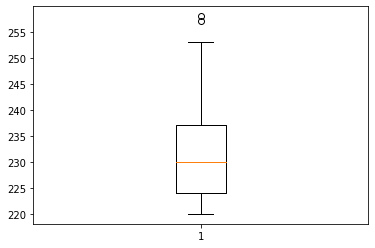

In [150]:
import matplotlib.pyplot as plt
plt.boxplot(result_array)
plt.show()

#### Creating a time-series plot

Since we are dealing with time series data we want to make use of the time dimension as well. The least complex plots are run charts where the time domain (dimension) is represented at the horizontal x-axis and the y-axis shows the actual sensor value. Let's do this for voltage as well.

1. We first call up spark sql again to select the voltage and timestamp values non-zero and ascendingly order them by ts. 

2. Then we retrieve the values for both voltage and the ts values to obtain an rdd matrix. 

3. Next, we create two arrays consisting of the values for either ts or voltage. 

4. Lastly, we create a time-series plot

In [152]:
result = spark.sql("select voltage,ts from washing where voltage is not null order by ts asc")
result_rdd = result.rdd.sample(False,0.1).map(lambda row : (row.ts,row.voltage))
result_array_ts = result_rdd.map(lambda ts_voltage: ts_voltage[0]).collect()
result_array_voltage = result_rdd.map(lambda ts_voltage: ts_voltage[1]).collect()

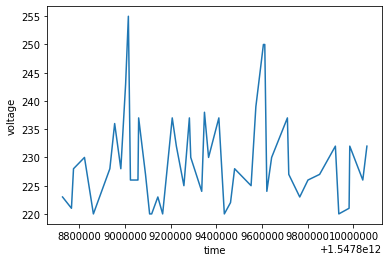

In [153]:
plt.plot(result_array_ts,result_array_voltage)
plt.xlabel("time")
plt.ylabel("voltage")
plt.show()


Now we've plotted a maximum of two dimensions at a time, let's go for three in a so-called 3D scatter plot. Again we have to create python lists (with applied sampling if necessary) from three properties of our data.

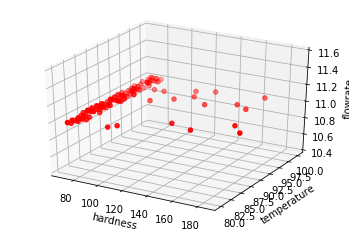

In [155]:
result_df = spark.sql("""
select hardness,temperature,flowrate from washing
    where hardness is not null and 
    temperature is not null and 
    flowrate is not null
""")
result_rdd = result_df.rdd.sample(False,0.1).map(lambda row : (row.hardness,row.temperature,row.flowrate))
result_array_hard = result_rdd.map(lambda hardness_temperature_flowrate: hardness_temperature_flowrate[0]).collect()
result_array_temp = result_rdd.map(lambda hardness_temperature_flowrate: hardness_temperature_flowrate[1]).collect()
result_array_flow = result_rdd.map(lambda hardness_temperature_flowrate: hardness_temperature_flowrate[2]).collect()


from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.scatter(result_array_hard,result_array_temp,result_array_flow, c='r', marker='o')

ax.set_xlabel('hardness')
ax.set_ylabel('temperature')
ax.set_zlabel('flowrate')

plt.show()



You will notice that the individual points resemble in some sort of plane. But this is not a surprise. Actually we can draw the following conclusions from the plot:

- most of the data points are lying around hardness 60-80, temperature 80-100 and flowrate 80-100
- there are some outliers, especially when it comes to the range of hardness 100-200
- the data follows some narrow boundaries

So lets double-check what's going on with hardness and flowrate since it seems that it really sticks around 60-80 and very seldom creates values above that. We can use a histogram for that which bins together certain value ranges and counts the frequency of occurences of values within this range. Those frequencies are ordered and shown as a bar diagram, so let's plot it:

(array([118.,   1.,   3.,   3.,   1.,   3.,   0.,   2.,   2.,   2.]),
 array([ 70. ,  81.5,  93. , 104.5, 116. , 127.5, 139. , 150.5, 162. ,
        173.5, 185. ]),
 <a list of 10 Patch objects>)

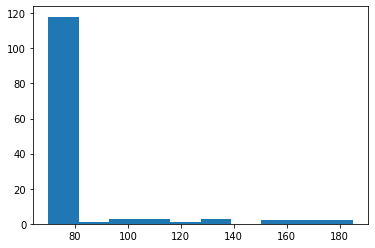

In [156]:
plt.hist(result_array_hard)

(array([  0.,   0.,   0.,   0.,   0., 135.,   0.,   0.,   0.,   0.]),
 array([10.5, 10.6, 10.7, 10.8, 10.9, 11. , 11.1, 11.2, 11.3, 11.4, 11.5]),
 <a list of 10 Patch objects>)

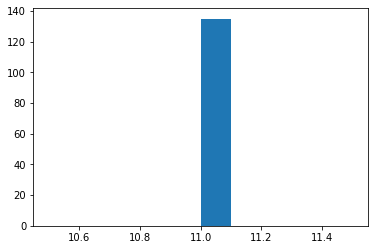

In [157]:
plt.hist(result_array_flow)

### 3: Dimensionality Reduction:

Dimensionality reduction is the base character of the pricipal component analysis (PCA). The main idea behind it is to reduce dimensions by transforming everything to a new dataset but preserving some key properties. 

The idea is that you take an n-dimensional data set, where of course every row can be seen as a point in an n-dimensional euclidian vector space and each column is one coordinate in that space. 

PCA transforms your dataset by specifying the number of desired dimensions in a way that the new dataset represents the very same points with vectors of lower dimensions, called k, which is also called **projection.**

One of the key properties which are preserved by PCA is the ratio of distances between the points. So in mathematical notation this means that if you take the distance of two random points, Pa and Pb, in the **original dataset,** and divide it by the distance of two other random points, Pc and Pd, You get **the same value** as if you take the distance of two random points, Pa and Pb in the **reduced dataset,** and divide it by a distance of two other random points, Pc and Pd. 

Another way of talking about this is if two points in the original dataset have been far away they are also far away in the reduced dataset, and if two points have been close in the original dataset they are also close in the reduced data set. 

After this projection, the **new dimensions returned are explaining the majority of the datasets' variation.** In other words, **the so-called principal components are chosen as such that the information contents of each additional dimension is decreasing.** 

This is a way of getting **rid of highly correlated dimensions in the source dataset because their information content is low.** Since the new dimensions are cloned out of ones with the lowest correlation among each other, these are called principal components. They are orthogonnal to each other. 

So this means that we can **spot clusters, potential separation planes, and outliers, also in the lower dimensional dataset** but with the **additional property that if you reduce the dimensionality, we are now able to plot the dataset.** 

When applying PCA we are losing information. PCA is very intelligent in deciding what parts of the information is less relevant so that the pain of removing information is minimized. 

Of course, the lower you choose k, the higher the loss is. Loss can be easily estimated by comparing the original dataset D with D prime where PCA was applied, and then the inverse function of PCA was applied again to reconstruct the original dataset D. The function used for comparing those two datasets is **sse which stands for sum of squared errors.** This way you get an idea of the percentage of information you are removing from your dataset. 

So, the key message is that, through PCA, we can reduce multi-dimensional data into three-dimensional data through a minimising-loss approach. This makes the relations plottable. 


We again use the df that we obtained earlier:

In [161]:
df = spark.read.parquet('washing.parquet')
df.createOrReplaceTempView('washing')
df.show()

+--------------------+--------------------+-----+--------+----------+---------+--------+-----+-----------+-------------+-------+
|                 _id|                _rev|count|flowrate|fluidlevel|frequency|hardness|speed|temperature|           ts|voltage|
+--------------------+--------------------+-----+--------+----------+---------+--------+-----+-----------+-------------+-------+
|0d86485d0f88d1f9d...|1-57940679fb8a713...|    4|      11|acceptable|     null|      77| null|        100|1547808723923|   null|
|0d86485d0f88d1f9d...|1-15ff3a0b304d789...|    2|    null|      null|     null|    null| 1046|       null|1547808729917|   null|
|0d86485d0f88d1f9d...|1-97c2742b68c7b07...|    4|    null|      null|       71|    null| null|       null|1547808731918|    236|
|0d86485d0f88d1f9d...|1-eefb903dbe45746...|   19|      11|acceptable|     null|      75| null|         86|1547808738999|   null|
|0d86485d0f88d1f9d...|1-5f68b4c72813c25...|    7|    null|      null|       75|    null| null|   

Now assume that we want to take 5 characteristics, which are: flowrate, hardness, speed, temperature and voltage. 

Unfortunately, we cannot use a plot as we have more than three dimensions currently. What we can do here is to use a PCA in order to reduce the dimensions until we can plot.

To do so, we first create additional dimensions per charateristic. This is the feature transformation part of this exercise. Since our table is mixing schemas from different sensor data sources we are creating new features. In other word we use existing columns to calculate new ones. We only use min and max for now, but using more advanced aggregations may improve the results. We are calculating those aggregations over a sliding window "w". This window is defined in the SQL statement and basically reads the table by a one by one stride in direction of increasing timestamp

In [164]:
result = spark.sql("""
SELECT * from (
    SELECT
    min(temperature) over w as min_temperature,
    max(temperature) over w as max_temperature, 
    min(voltage) over w as min_voltage,
    max(voltage) over w as max_voltage,
    min(flowrate) over w as min_flowrate,
    max(flowrate) over w as max_flowrate,
    min(frequency) over w as min_frequency,
    max(frequency) over w as max_frequency,
    min(hardness) over w as min_hardness,
    max(hardness) over w as max_hardness,
    min(speed) over w as min_speed,
    max(speed) over w as max_speed
    FROM washing 
    WINDOW w AS (ORDER BY ts ROWS BETWEEN CURRENT ROW AND 10 FOLLOWING) 
)
WHERE min_temperature is not null 
AND max_temperature is not null
AND min_voltage is not null
AND max_voltage is not null
AND min_flowrate is not null
AND max_flowrate is not null
AND min_frequency is not null
AND max_frequency is not null
AND min_hardness is not null
AND min_speed is not null
AND max_speed is not null   
""")

Before we can sample the dataset down, we now use the PCA first in order to pin down the dimensions. 

Now we import some classes from SparkML. PCA for the actual algorithm. Vectors for the data structure expected by PCA and VectorAssembler to transform data into these vector structures.

In [165]:
from pyspark.ml.feature import PCA
from pyspark.ml.linalg import Vectors
from pyspark.ml.feature import VectorAssembler


Let's define a vector transformation helper class which takes all our input features (result.columns) and created one additional column called "features" which contains all our input features as one single column wrapped in "DenseVector" objects


In [167]:
assembler = VectorAssembler(inputCols = result.columns, outputCol = "feature")

Now we actually transform the data, note that this is highly optimized code and runs really fast in contrast if we had implemented it.

The main parts here are that we simply take the vectors and store (transform) them into a new vector which combines all characteristic per datapoint. 

Then we take the PCA where wee dense out the 12 characteristics into three. We call the output columnn "pcaFeatures". As can be seen, we transformed each datapoint in a threedimensional vector. 

Lastly, we again define the subsample, map the values on the Features we selected and collect for each datapoint each of the three features to plot then. 

In [170]:
features = assembler.transform(result)

In [172]:
features.rdd.map(lambda r : r.feature).take(10)

[DenseVector([81.0, 100.0, 221.0, 223.0, 11.0, 11.0, 68.0, 76.0, 71.0, 78.0, 1033.0, 1033.0]),
 DenseVector([81.0, 100.0, 221.0, 223.0, 11.0, 11.0, 68.0, 76.0, 72.0, 78.0, 1033.0, 1033.0]),
 DenseVector([81.0, 100.0, 221.0, 223.0, 11.0, 11.0, 68.0, 76.0, 72.0, 80.0, 1033.0, 1033.0]),
 DenseVector([81.0, 100.0, 222.0, 223.0, 11.0, 11.0, 68.0, 74.0, 72.0, 80.0, 1033.0, 1046.0]),
 DenseVector([81.0, 100.0, 222.0, 223.0, 11.0, 11.0, 68.0, 74.0, 73.0, 80.0, 1033.0, 1046.0]),
 DenseVector([80.0, 94.0, 222.0, 223.0, 11.0, 11.0, 68.0, 74.0, 73.0, 80.0, 1033.0, 1046.0]),
 DenseVector([80.0, 94.0, 222.0, 236.0, 11.0, 11.0, 68.0, 74.0, 73.0, 80.0, 1046.0, 1046.0]),
 DenseVector([80.0, 94.0, 222.0, 236.0, 11.0, 11.0, 68.0, 74.0, 73.0, 80.0, 1046.0, 1046.0]),
 DenseVector([80.0, 94.0, 222.0, 236.0, 11.0, 11.0, 71.0, 74.0, 73.0, 80.0, 1046.0, 1046.0]),
 DenseVector([80.0, 94.0, 222.0, 236.0, 11.0, 11.0, 71.0, 74.0, 73.0, 80.0, 1046.0, 1046.0])]

Since the source data set has been prepared as a list of DenseVectors we can now apply PCA. Note that the first line again only prepares the algorithm by finding the transformation matrices (fit method)

In [176]:
pca = PCA(k=3, inputCol = "feature", outputCol = "pcaFeatures")
model = pca.fit(features)

In [177]:
result_pca = model.transform(features).select("pcaFeatures")
result_pca.show(truncate = False)

+-----------------------------------------------------------+
|pcaFeatures                                                |
+-----------------------------------------------------------+
|[1459.9789705814187,-18.745237781780922,70.78430794796873] |
|[1459.995481828676,-19.11343146165273,70.72738871425986]   |
|[1460.0895843561282,-20.969471062922928,70.75630600322052] |
|[1469.6993929419532,-20.403124647615513,62.013569674880955]|
|[1469.7159041892107,-20.771318327487293,61.95665044117209] |
|[1469.7128317338704,-20.790751117222456,61.896106678330966]|
|[1478.3530264572928,-20.294557029728722,71.67550104809607] |
|[1478.3530264572928,-20.294557029728722,71.67550104809607] |
|[1478.3686036138165,-20.260626897636314,71.63355353606426] |
|[1478.3686036138165,-20.260626897636314,71.63355353606426] |
|[1483.5412027684088,-20.006222577501354,66.82710394284209] |
|[1483.5171090223353,-20.867020421583753,66.86707301954084] |
|[1483.4224268542928,-19.87574823665505,66.93027077913985]  |
|[1483.4

Now we retrieve the sample and use it:

In [186]:
rdd = result_pca.rdd.sample(False, 0.2).map(lambda a: a.pcaFeatures)

In [187]:
x = rdd.map(lambda a: a[0]).collect()
y = rdd.map(lambda a: a[1]).collect()
z = rdd.map(lambda a: a[2]).collect()

In [188]:
%matplotlib inline

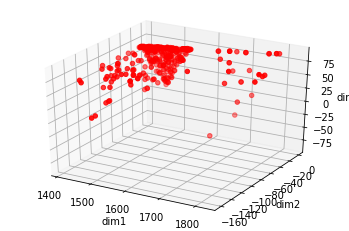

In [189]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.scatter(x,y,z, c='r', marker='o')

ax.set_xlabel('dim1')
ax.set_ylabel('dim2')
ax.set_zlabel('dim3')

plt.show()

## 4. ML Pipelines

### Introdcution to SparkML:

Pipelines are really facilitating your day to day work in machine learning. You can draw from predefined data processing steps, you make sure everything is aligned and you can switch and swap your algorithms. You can create a pipeline and you can use this pipeline in downstream data processing in a process which is called hyperparameter tuning, for example.

Convenient is that when using pipelines, you get some sort of a recipe or a predefined list of steps which you have to do.

So let's introduce this document pipelines using little sample dataset. So this dataset is called HMP dataset and it's basically SLR meter, recordings with SLR meter sensor attached to the human body. 

So the idea is, we will clone this dataset and then basically we are up with it. So the first thing is, you have to make sure that we have an Apache Spark service here associated with the project and then we go to Assets and we create a new notebook.

Then we recursively traverse through the folders we obtained and create an Apache Spark data frames from those files and then we union all data frames, giving us one data frame containing all the data.

Mainly, we follow these steps for creating pipelines: 

1. Data acquisition
2. Data transformation 
3. Pipeline command creation
4. sumarization of commands


#### Data acquisition

We start with a rather cumbersome activity. As we want to create a pipeline which combines many data-processing steps, we first have to summarize certain files into one large file. 

This can be done using the following commands, which are explained below:

In [1]:
# delete files from previous runs
!rm -f hmp.parquet*

# download the file containing the data in PARQUET format

!git clone https://github.com/wchill/HMP_Dataset.git

fatal: destination path 'HMP_Dataset' already exists and is not an empty directory.


In [242]:
! ls HMP_Dataset

Brush_teeth    Drink_glass    Liedown_bed    Sitdown_chair  final.py
Climb_stairs   Eat_meat       MANUAL.txt     Standup_chair  impdata.py
Comb_hair      Eat_soup       Pour_water     Use_telephone
Descend_stairs Getup_bed      README.txt     Walk


As we can see, we downloaded a file consisting of several steps or classes that were measured through an IoT device. First, we should combine these individual lists into one great list. 



In [2]:
import os 

list_data = os.listdir("HMP_Dataset")

However, we also see some unnecessary classes, such as README or MANUAL, final or impdata. We first should get rid of these classes: 

In [3]:
list_data_filtered = [s for s in list_data if "_" in s]

If we look at the data within the github repository, we can see that it is consisting of a three-dimensional vector. We now want to assign a column name to each of the elements within the vectors, which we call x,y,z. 

In [4]:
from pyspark.sql.types import StructType, StructField, IntegerType

schema = StructType([
    StructField("x", IntegerType(), True),
    StructField("y", IntegerType(), True),
    StructField("z", IntegerType(), True)])

#### Data transformation

Now comes the part of the data aggregation. To do so, we need to combine all files we obtained and put together into a list into a new dataframe, which is assigned all values necessary of x, y and z as well as the class and source values. 

In [9]:
df = None # create an empty dataframe 

from pyspark.sql.functions import lit # import a function that t

for category in list_data_filtered: # take each element in the list_data_filtered 
    data_files = os.listdir("HMP_Dataset/"+category) # create a new list "data_files", 
                                                     # that again sumarises all list names with the prefix "HMP_Dataset/"
                                                     # Also, each list includes all all files within the list 
    for data_file in data_files: # Take each element of the data_files created list and iterate over them
        print(data_file)
        
        temp_df = spark.read.option("header", "False").option("delimiter", " ").csv("HMP_Dataset/"+category+"/"+data_file, schema = schema)
        # temporary df, where we first define: 
            # Header: "False", as there is no header in the lists
            # Delimiter: " ", as the delimiter between x,y,z is only a space
            # csv file which is called (for the first observation): 
                #"HMP_Dataset/Liedown_bed/Accelerometer-2011-05-30-20-59-04-liedown_bed-f1.txt"
            # and which is defined according to the schema: x, y, z as column names 
            
        temp_df = temp_df.withColumn("class", lit(category)) # add a column called "class" from the category
                                                             # this is only the element e.g. "Liedown_bed"
            
        temp_df = temp_df.withColumn("source", lit(data_file)) # add a column called "source" from the data_file
                                                               # this is only the source name we created 
        if df is None: # Then we create the new dataframe consisting of each csv file we just created with 
                       # with all the inputs we require
            df = temp_df
        else:
            df = df.union(temp_df)

Accelerometer-2011-05-30-20-59-04-liedown_bed-f1.txt
Accelerometer-2011-05-30-21-41-32-liedown_bed-m2.txt
Accelerometer-2011-04-11-11-52-20-liedown_bed-f1.txt
Accelerometer-2011-05-31-14-56-04-liedown_bed-f1.txt
Accelerometer-2011-05-30-10-26-14-liedown_bed-m1.txt
Accelerometer-2011-05-30-08-25-59-liedown_bed-f1.txt
Accelerometer-2011-05-30-21-35-19-liedown_bed-m2.txt
Accelerometer-2011-06-02-17-21-57-liedown_bed-m1.txt
Accelerometer-2011-05-31-16-24-36-liedown_bed-f1.txt
Accelerometer-2011-06-02-16-58-20-liedown_bed-f4.txt
Accelerometer-2011-03-29-09-19-22-liedown_bed-f1.txt
Accelerometer-2011-03-29-09-23-22-liedown_bed-f1.txt
Accelerometer-2011-06-02-17-00-38-liedown_bed-f4.txt
Accelerometer-2011-04-11-13-33-26-liedown_bed-f1.txt
Accelerometer-2011-05-30-10-38-41-liedown_bed-m1.txt
Accelerometer-2011-05-31-15-02-19-liedown_bed-f1.txt
Accelerometer-2011-05-30-08-37-27-liedown_bed-f1.txt
Accelerometer-2011-05-30-09-41-49-liedown_bed-f1.txt
Accelerometer-2011-06-02-16-59-13-liedown_bed-

Accelerometer-2011-06-02-10-38-52-descend_stairs-f1.txt
Accelerometer-2011-06-06-10-58-14-descend_stairs-f1.txt
Accelerometer-2011-06-06-10-58-40-descend_stairs-f1.txt
Accelerometer-2011-06-06-10-56-55-descend_stairs-f1.txt
Accelerometer-2011-05-31-16-21-49-descend_stairs-f1.txt
Accelerometer-2011-05-30-21-39-11-descend_stairs-m2.txt
Accelerometer-2011-03-29-16-17-18-descend_stairs-f1.txt
Accelerometer-2011-06-06-11-01-54-descend_stairs-f1.txt
Accelerometer-2011-05-30-21-53-35-descend_stairs-m2.txt
Accelerometer-2011-06-06-10-59-38-descend_stairs-f1.txt
Accelerometer-2011-03-24-11-20-43-descend_stairs-f1.txt
Accelerometer-2011-04-11-13-32-24-descend_stairs-f1.txt
Accelerometer-2011-05-30-20-56-43-descend_stairs-f1.txt
Accelerometer-2011-05-30-21-32-18-descend_stairs-m2.txt
Accelerometer-2011-05-31-14-52-31-descend_stairs-f1.txt
Accelerometer-2011-03-29-09-15-58-descend_stairs-f1.txt
Accelerometer-2011-03-29-16-17-50-descend_stairs-f1.txt
Accelerometer-2011-05-30-10-28-13-use_telephone-

Accelerometer-2012-06-06-09-32-04-climb_stairs-m6.txt
Accelerometer-2011-04-11-11-57-50-climb_stairs-f1.txt
Accelerometer-2012-06-07-10-48-08-climb_stairs-f1.txt
Accelerometer-2011-06-06-11-01-27-climb_stairs-f1.txt
Accelerometer-2012-06-06-09-44-02-climb_stairs-m6.txt
Accelerometer-2012-06-06-14-08-44-climb_stairs-m7.txt
Accelerometer-2012-05-29-17-17-05-climb_stairs-m3.txt
Accelerometer-2012-06-06-08-53-47-climb_stairs-m5.txt
Accelerometer-2012-05-30-18-31-52-climb_stairs-f3.txt
Accelerometer-2011-05-31-16-26-09-climb_stairs-f1.txt
Accelerometer-2012-05-30-18-32-56-climb_stairs-f3.txt
Accelerometer-2011-06-06-11-02-24-climb_stairs-f1.txt
Accelerometer-2012-06-06-09-37-58-climb_stairs-m6.txt
Accelerometer-2012-06-06-09-33-15-climb_stairs-m6.txt
Accelerometer-2011-05-30-10-20-47-climb_stairs-m1.txt
Accelerometer-2011-03-24-10-24-39-climb_stairs-f1.txt
Accelerometer-2012-06-06-14-04-18-climb_stairs-m7.txt
Accelerometer-2012-06-06-09-01-08-climb_stairs-m5.txt
Accelerometer-2012-05-29-16-

Accelerometer-2012-05-25-18-28-46-sitdown_chair-f4.txt
Accelerometer-2011-12-11-08-13-16-sitdown_chair-f4.txt
Accelerometer-2012-03-26-04-58-33-sitdown_chair-f2.txt
Accelerometer-2011-12-05-09-44-08-sitdown_chair-f1.txt
Accelerometer-2011-05-30-08-22-28-sitdown_chair-f1.txt
Accelerometer-2011-03-29-09-06-48-sitdown_chair-f1.txt
Accelerometer-2011-06-02-17-44-20-sitdown_chair-m1.txt
Accelerometer-2011-05-30-10-31-12-sitdown_chair-m1.txt
Accelerometer-2011-05-31-16-33-27-sitdown_chair-f1.txt
Accelerometer-2012-03-23-03-45-26-sitdown_chair-m9.txt
Accelerometer-2012-05-25-18-33-29-sitdown_chair-f4.txt
Accelerometer-2011-04-12-21-43-15-sitdown_chair-m8.txt
Accelerometer-2011-04-08-17-34-35-sitdown_chair-f3.txt
Accelerometer-2011-06-02-16-44-37-sitdown_chair-f4.txt
Accelerometer-2011-06-02-17-41-43-sitdown_chair-m1.txt
Accelerometer-2011-06-02-16-46-07-sitdown_chair-f4.txt
Accelerometer-2011-12-05-09-50-54-sitdown_chair-f1.txt
Accelerometer-2012-03-26-04-54-57-sitdown_chair-f2.txt
Accelerome

Accelerometer-2012-05-25-18-32-32-drink_glass-f4.txt
Accelerometer-2012-05-30-22-10-16-drink_glass-m2.txt
Accelerometer-2011-06-02-17-20-47-drink_glass-m1.txt
Accelerometer-2011-04-08-18-10-09-drink_glass-m4.txt
Accelerometer-2011-03-24-13-31-22-drink_glass-f1.txt
Accelerometer-2011-06-02-17-29-13-drink_glass-m1.txt
Accelerometer-2011-06-02-17-30-51-drink_glass-m1.txt
Accelerometer-2011-03-24-10-16-02-drink_glass-f1.txt
Accelerometer-2012-05-28-17-44-02-drink_glass-m1.txt
Accelerometer-2011-03-24-16-08-10-drink_glass-f2.txt
Accelerometer-2012-05-30-19-53-49-drink_glass-f2.txt
Accelerometer-2012-05-30-19-54-48-drink_glass-f2.txt
Accelerometer-2011-06-01-15-25-43-drink_glass-f1.txt
Accelerometer-2012-05-25-18-31-18-drink_glass-f4.txt
Accelerometer-2011-04-12-21-44-55-drink_glass-m8.txt
Accelerometer-2011-05-31-15-13-09-drink_glass-f1.txt
Accelerometer-2012-05-30-19-51-49-drink_glass-f2.txt
Accelerometer-2011-06-02-17-20-17-drink_glass-m1.txt
Accelerometer-2011-05-30-21-06-42-drink_glass-

In [10]:
df.show()

+---+---+---+-----------+--------------------+
|  x|  y|  z|      class|              source|
+---+---+---+-----------+--------------------+
| 12| 28| 33|Liedown_bed|Accelerometer-201...|
| 12| 28| 31|Liedown_bed|Accelerometer-201...|
| 11| 28| 32|Liedown_bed|Accelerometer-201...|
| 11| 28| 32|Liedown_bed|Accelerometer-201...|
| 12| 27| 31|Liedown_bed|Accelerometer-201...|
| 12| 27| 31|Liedown_bed|Accelerometer-201...|
| 10| 28| 31|Liedown_bed|Accelerometer-201...|
| 11| 29| 31|Liedown_bed|Accelerometer-201...|
| 12| 29| 31|Liedown_bed|Accelerometer-201...|
| 12| 30| 31|Liedown_bed|Accelerometer-201...|
| 11| 29| 31|Liedown_bed|Accelerometer-201...|
| 10| 29| 30|Liedown_bed|Accelerometer-201...|
| 11| 30| 30|Liedown_bed|Accelerometer-201...|
| 12| 32| 32|Liedown_bed|Accelerometer-201...|
| 13| 32| 33|Liedown_bed|Accelerometer-201...|
| 13| 35| 31|Liedown_bed|Accelerometer-201...|
| 13| 37| 31|Liedown_bed|Accelerometer-201...|
| 13| 38| 31|Liedown_bed|Accelerometer-201...|
| 13| 36| 31|

#### Pipeline creation

Now, having transferred the data into a system we can work with, we can use the pipeline command to tell the program what we want to be executed for each step:

In [20]:
from pyspark.ml.feature import OneHotEncoder, StringIndexer, VectorAssembler, Normalizer, MinMaxScaler
from pyspark.ml.linalg import Vectors
from pyspark.ml import Pipeline

indexer = StringIndexer(inputCol = "class", outputCol = "classIndex")
encoder = OneHotEncoder(inputCol = "classIndex", outputCol = "categoryVec") # create 7 digit feature of a classIndex
VectorAssembler = VectorAssembler(inputCols = ["x", "y", "z"], outputCol = "features")
normalizer = Normalizer(inputCol = "features", outputCol = "featureNorm", p = 1.0)
MinMax = MinMaxScaler(inputCol="features", outputCol="scaledFeatures")

pipeline = Pipeline(stages = [indexer, encoder, VectorAssembler, normalizer, MinMax])

model = pipeline.fit(df)
prediction = model.transform(df)

### B: Introduction to supervised and unsupervised learning techniques with ApacheSpark ML

As we have now created a dataset that we can use for ML analysis through a pipeline, we can start taking first learning techniques of the program. These are rather rudimentary, and we will look at Linear and Logistic regressions, Random Forests and Gradient Boosts. 

For the exercise, however, we will work with a different dataset. 

In [ ]:
# download the file containing the data in CSV format
!wget http://max-training-data.s3-api.us-geo.objectstorage.softlayer.net/noaa-weather/jfk_weather.tar.gz

In [49]:
# download the file containing the data in CSV format
!wget http://max-training-data.s3-api.us-geo.objectstorage.softlayer.net/noaa-weather/jfk_weather.tar.gz

# extract the data
!tar xvfz jfk_weather.tar.gz

# create csv

df = spark.read.option("header", "true").option("inferSchema", "true").csv("jfk_weather.csv")

# register a corresponding query table

df.createOrReplaceTempView("df")
                                               

--2020-08-27 16:23:31--  http://max-training-data.s3-api.us-geo.objectstorage.softlayer.net/noaa-weather/jfk_weather.tar.gz
Resolving max-training-data.s3-api.us-geo.objectstorage.softlayer.net (max-training-data.s3-api.us-geo.objectstorage.softlayer.net)... 67.228.254.196
Connecting to max-training-data.s3-api.us-geo.objectstorage.softlayer.net (max-training-data.s3-api.us-geo.objectstorage.softlayer.net)|67.228.254.196|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2575759 (2,5M) [application/x-tar]
Saving to: ‘jfk_weather.tar.gz.2’

jfk_weather.tar.gz. 100%[===================>]   2,46M  1,10MB/s    in 2,2s    

2020-08-27 16:23:34 (1,10 MB/s) - ‘jfk_weather.tar.gz.2’ saved [2575759/2575759]

x jfk_weather.csv


In [55]:
import random
random.seed(42)

from pyspark.sql.functions import translate, col

df_cleaned = df \
    .withColumn("HOURLYWindSpeed", df.HOURLYWindSpeed.cast('double')) \
    .withColumn("HOURLYWindDirection", df.HOURLYWindDirection.cast('double')) \
    .withColumn("HOURLYStationPressure", translate(col("HOURLYStationPressure"), "s,", "")) \
    .withColumn("HOURLYPrecip", translate(col("HOURLYPrecip"), "s,", "")) \
    .withColumn("HOURLYRelativeHumidity", translate(col("HOURLYRelativeHumidity"), "*", "")) \
    .withColumn("HOURLYDRYBULBTEMPC", translate(col("HOURLYDRYBULBTEMPC"), "*", "")) \

df_cleaned =   df_cleaned \
                    .withColumn("HOURLYStationPressure", df_cleaned.HOURLYStationPressure.cast('double')) \
                    .withColumn("HOURLYPrecip", df_cleaned.HOURLYPrecip.cast('double')) \
                    .withColumn("HOURLYRelativeHumidity", df_cleaned.HOURLYRelativeHumidity.cast('double')) \
                    .withColumn("HOURLYDRYBULBTEMPC", df_cleaned.HOURLYDRYBULBTEMPC.cast('double')) \

df_filtered = df_cleaned.filter("""
    HOURLYWindSpeed <> 0
    and HOURLYWindSpeed IS NOT NULL
    and HOURLYWindDirection IS NOT NULL
    and HOURLYStationPressure IS NOT NULL
    and HOURLYPressureTendency IS NOT NULL
    and HOURLYPrecip IS NOT NULL
    and HOURLYRelativeHumidity IS NOT NULL
    and HOURLYDRYBULBTEMPC IS NOT NULL
""")

In [60]:
from pyspark.ml.feature import VectorAssembler 

vectorassembler = VectorAssembler(inputCols = ["HOURLYWindSpeed","HOURLYPressureTendency","HOURLYStationPressure"],
                                 outputCol = "features")

df_pipeline = vectorassembler.transform(df_filtered)

from pyspark.ml.stat import Correlation
Correlation.corr(df_pipeline, "features").head()[0].toArray()


array([[ 1.        , -0.01324305, -0.26171147],
       [-0.01324305,  1.        , -0.05821663],
       [-0.26171147, -0.05821663,  1.        ]])

In [64]:
splits = df_filtered.randomSplit([0.8, 0.2])
df_train = splits[0]
df_test = splits[1]

In [62]:
from pyspark.ml.feature import StringIndexer, OneHotEncoder
from pyspark.ml.linalg import Vectors
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.feature import Normalizer
from pyspark.ml import Pipeline

vectorAssembler = VectorAssembler(inputCols=[
                                    "HOURLYWindDirection",
                                    "ELEVATION",
                                    "HOURLYStationPressure"],
                                  outputCol="features")

normalizer = Normalizer(inputCol = "features", outputCol = "features_norm", p = 1.0)

In [63]:
def regression_metrics(prediction):
    from pyspark.ml.evaluation import RegressionEvaluator
    evaluator = RegressionEvaluator(
    labelCol = "HOURLYWindSpeed", predictionCol = "prediction", metricName = "rmse")
    rmse = evaluator.evaluate(prediction)
    print("RMSE on test data = %g" % rmse)

In [67]:
# Linear Regression

from pyspark.ml.regression import LinearRegression

lr = LinearRegression(labelCol = "HOURLYWindSpeed", featuresCol = "features_norm", maxIter = 100, regParam=0.0, elasticNetParam=0.0)
pipeline = Pipeline(stages = [vectorAssembler, normalizer, lr])

model = pipeline.fit(df_train)
prediction = model.transform(df_test)
regression_metrics(prediction)

RMSE on test data = 5.65452


In [70]:
# Gradient Boost

from pyspark.ml.regression import GBTRegressor

gbt = GBTRegressor(labelCol="HOURLYWindSpeed", maxIter=100)
pipeline = Pipeline(stages = [vectorAssembler, normalizer, gbt])

model = pipeline.fit(df_train)
prediction = model.transform(df_test)
regression_metrics(prediction)

RMSE on test data = 5.18238


Now let’s switch gears. Previously, we tried to predict HOURLYWindSpeed, but now we predict HOURLYWindDirection. In order to turn this into a classification problem we discretize the value using the Bucketizer. The new feature is called HOURLYWindDirectionBucketized.

In [75]:
from pyspark.ml.feature import Bucketizer, OneHotEncoder

bucketizer = Bucketizer(splits = [0, 180, float("Inf")], inputCol = "HOURLYWindDirection", outputCol = "HOURLYWindDirectionBucketized")
encoder = OneHotEncoder(inputCol = "HOURLYWindDirectionBucketized", outputCol="HOURLYWindDirectionOHE")

Again, we define a function in order to assess how we perform. Here we just use the accuracy measure which gives us the fraction of correctly classified examples. Again, 0 is bad, 1 is good.

In [76]:
def classification_metrics(prediction):
    from pyspark.ml.evaluation import MulticlassClassificationEvaluator
    mcEval = MulticlassClassificationEvaluator().setMetricName("accuracy").setPredictionCol("prediction").setLabelCol("HOURLYWindDirectionBucketized")
    accuracy = mcEval.evaluate(prediction)
    print("Accuracy on test data = %g" % accuracy)


In [77]:
# Logistic Regression

from pyspark.ml.classification import LogisticRegression

lor = LogisticRegression(labelCol = "HOURLYWindDirectionBucketized", maxIter = 100)

vectorAssembler = VectorAssembler(inputCols=["HOURLYWindSpeed","HOURLYDRYBULBTEMPC"],
                                  outputCol="features")

normalizer = Normalizer(inputCol = "features", outputCol = "features_norm", p = 1.0)

pipeline = Pipeline(stages = [bucketizer, vectorAssembler, normalizer, lor])

model = pipeline.fit(df_train)
prediction = model.transform(df_test)
classification_metrics(prediction)

Accuracy on test data = 0.689773


In [78]:
# Random Forest 

from pyspark.ml.classification import RandomForestClassifier

rfc = RandomForestClassifier(labelCol="HOURLYWindDirectionBucketized", numTrees=10)

vectorAssembler = VectorAssembler(inputCols=["HOURLYWindSpeed","HOURLYDRYBULBTEMPC","ELEVATION","HOURLYStationPressure","HOURLYPressureTendency","HOURLYPrecip"],
                                  outputCol="features")

pipeline = Pipeline(stages = [bucketizer, vectorAssembler, normalizer, rfc])
model = pipeline.fit(df_train)
prediction = model.transform(df_test)
classification_metrics(prediction)

Accuracy on test data = 0.713864


In [81]:
# Gradient Boost Split

gbt2 = GBTRegressor(labelCol = "HOURLYWindDirectionBucketized", maxIter = 100)

vectorAssembler = VectorAssembler(inputCols=["HOURLYWindSpeed","HOURLYDRYBULBTEMPC","ELEVATION","HOURLYStationPressure","HOURLYPressureTendency","HOURLYPrecip"],
                                  outputCol="features")

pipeline = Pipeline(stages = [bucketizer, vectorAssembler, normalizer, gbt2])

model = pipeline.fit(df_train)
prediction = model.transform(df_test)
classification_metrics(prediction)

Exception ignored in: <function JavaWrapper.__del__ at 0x1177c3cb0>
Traceback (most recent call last):
  File "/Users/nikolas.anic/opt/anaconda3/lib/python3.7/site-packages/pyspark/ml/wrapper.py", line 40, in __del__
    if SparkContext._active_spark_context and self._java_obj is not None:
AttributeError: 'LinearRegression' object has no attribute '_java_obj'


Accuracy on test data = 0


# Chapter 3: Introduction to DeepLearning & Neural Networks with Keras

All the algorithms that are used in deep learning are largely inspired by the way neurons and neural networks function and process data in the brain. This image is one of the very first pictures of a neuron. It was drawn by Santiago Ramon y Cajal, back in 1899 based on what he saw after placing a pigeon's brain under the microscope. He is now known as the father of modern neuroscience, but based on his drawing, the neurons, one of them labeled A, have big bodies in the middle and long arms that stretch out and branch off to connect with other neurons. Going back to the drawing of neurons by Ramon y Cajal, let's rotate it 90 degrees to the left. The main body of the neuron is called the soma, which contains the nucleus of the neuron. The big network of arms sticking out of the body is called the dendrites, and then the long arm that sticks out of the soma in the other direction is called the axon. The whiskers at the end of the axon are called the terminal buttons or synapses. So the dendrites receive electrical impulses which carry information, or data, from sensors or terminal buttons of other adjoining neurons. The dendrites then carry the impulses or data to the soma. In the nucleus, electrical impulses, or the data, are processed by combining them together, and then they are passed on to the axon. The axon then carries the processed information to the terminal button or synapse, and the output of this neuron becomes the input to thousands of other neurons. 

**Learning in the brain occurs by repeatedly activating certain neural connections over others, and this reinforces those connections.** This makes them more likely to produce a desired outcome given a specified input. Once the desired outcome occurs, the neural connections causing that outcome become strengthened. 

An artificial neuron behaves in the same way as a biological neuron. So it consists of a soma, dendrites, and an axon to pass on the output of this neuron to other neurons. The end of the axon can branch off to connect to many other neurons, but for simplicity we are just showing one branch here. The learning process also very much resembles the way learning occurs in the brain. Now that we understand the different parts of an artificial neuron, let's learn how we formulate the way artificial neural networks process information.

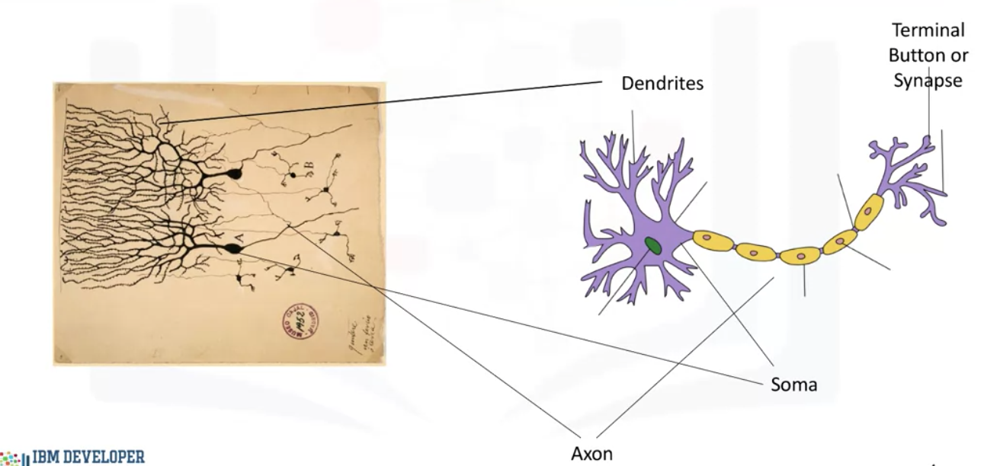

In [154]:
from IPython.display import Image
Image(filename='/Users/nikolas.anic/Desktop/ML/ML_Python_Certificate/NeuralNets.png')

For a network of neurons, we normally divide it into different layers: 

1. Input Layer
    - feeds the input into the network
2. Output Layer
    - set of nodes that provide the output of the network
3. Hidden Layers 
    - any sets of nodes in between the input and the output layers

When working with neural networks, the three main topics that we deal with are: 

1. forward propagation
2. backpropagation
3. activation functions. 

**Forward propagation** is the process through which **data passes through layers of neurons in a neural network from the input layer all the way to the output layer.** Let's use one neuron and mathematically formulate the way information flows through it. As shown here, the data flows through each neuron by connections or the dendrites. Every connection has a specific weight by which the flow of data is regulated. Here x1 and x2 are the two inputs, they could be an integer or float. When these inputs pass through the connections, they're adjusted depending on the connection weights, w1 and w2. The neuron then processes this information by outputting a weighted sum of these inputs. It also adds a constant to the sum which is referred to as the bias. So, z here is the **linear combination of the inputs and weights along with the bias, and a is the output of the network.**

However, simply outputting a weighted sum of the inputs limits the tasks that can be performed by the neural network. Therefore, a better processing of the data would be to map the weighted sum to a **nonlinear space.** A popular function is the **sigmoid function**, where if the weighted sum is a very large positive number, then the output of the neuron is close to 1, and if the weighted sum is a very large negative number, then the output of the neuron is close to zero. Non-linear transformations like the sigmoid function are called activation functions. 

**Activation functions** are another extremely important feature of artificial neural networks. They basically **decide whether a neuron should be activated or not.** In other words, whether the **information that the neuron is receiving is relevant or should be ignored.** The takeaway message here is that a neural network without an activation function is essentially just a linear regression model. The **activation function performs non-linear transformation to the input enabling the neural network of learning and performing more complex tasks, such as image classifications and language translations.**


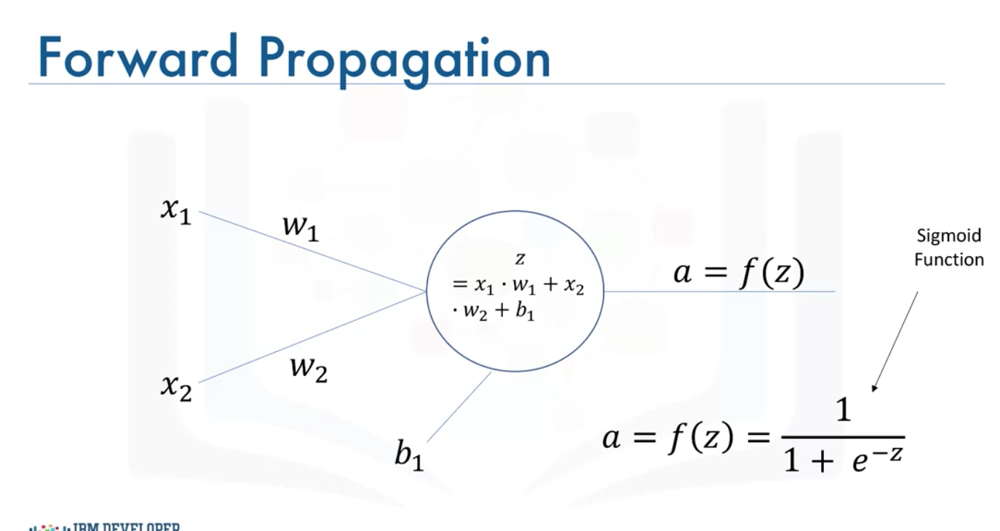

In [87]:
Image(filename='/Users/nikolas.anic/Desktop/ML/ML_Python_Certificate/Fd_Example.png')

Let's go over an example of how to compute the output. Let's say that the value of x1 is 0.1, and we want to predict the output for this input. The network has optimized weight and bias where w1 is 0.15 and b1 is 0.4. The first step is to calculate z, which is the dot product of the inputs and the corresponding weights plus the bias. So we find that z is 0.415. The neuron then uses the sigmoid function to apply non-linear transformation to z. Therefore, the output of the neuron is 0.6023. For a network with two neurons, the output from the first neuron will be the input to the second neuron. The rest is then exactly the same. The second neuron takes the input and computes the dot product of the input, which is a1 in this case, and the weight which is w2, and adds the bias which is b2. Using a sigmoid function as the activation function, the output of the network would be 0.7153. And this would be the predicted value for the input 0.1. 

This is in essence how a neural network predicts the output for any given input. No matter how complicated the network gets, it is the same exact process. To summarize, given a neural network with a set of weights and biases, you should be able to compute the output of the network for any given input.

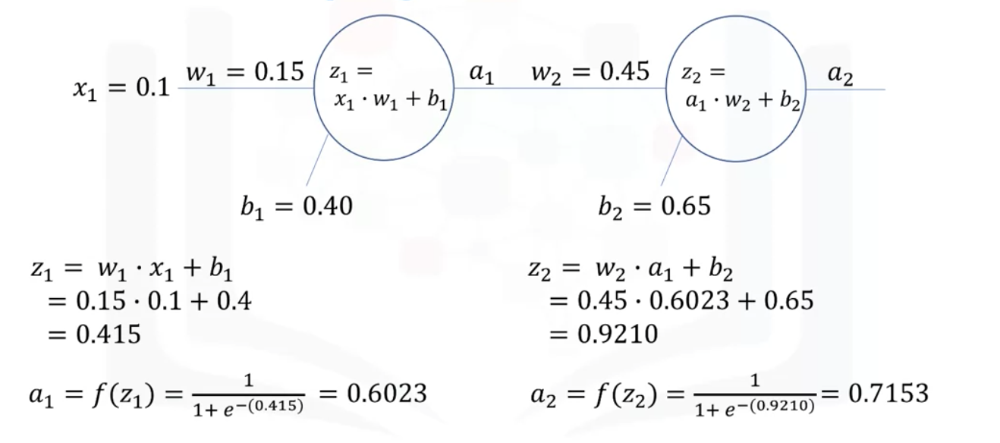

In [89]:
Image(filename='/Users/nikolas.anic/Desktop/ML/ML_Python_Certificate/Forward_Propagation.png')

Let's conceptualize this with an example-based function

In [155]:
# We crate a network which contains of the number of inputs, the number of hidden layers, 
# the number of hidden nodes per layer as well as the specified output and assign them weights and a bias term

def initialize_network(num_inputs, num_hidden_layers, num_nodes_hidden, num_outputs):
    
# First, we need an empty dataset (called network)

    network = {}
    num_nodes_previous = num_inputs
    
# Then, we define that for each layer in the network we assign and an output format (which then will consist of 
# weight and bias)

    for layer in range(num_hidden_layers + 1): 
        if layer == num_hidden_layers: # Here, we define the name and output for the last layer, the output layer
            layer_name = "output"
            layer_num = num_outputs
        else: 
            layer_name = "layer_{}".format(layer + 1) # Here, name and output for the hidden layers 
            layer_num = num_nodes_hidden[layer]
        
        network[layer_name] = {} # Now we define the data within each layer 
        
        for node in range(layer_num): 
            node_name = "node_{}".format(node + 1) # the name of each node 
            network[layer_name][node_name] = { # And the weights and bias per node 
                "weights" : np.around(np.random.uniform(size = num_nodes_previous), decimals = 2),
                "bias" : np.around(np.random.uniform(size = 1), decimals = 2)
            }
            
        num_nodes_previous = layer_num
        
    return network


In [138]:
small_network = initialize_network(5,3,[2,3,4],1)
small_network

{'layer_1': {'node_1': {'weights': array([0.92, 0.9 , 0.03, 0.96, 0.14]),
   'bias': array([0.28])},
  'node_2': {'weights': array([0.61, 0.94, 0.85, 0.  , 0.52]),
   'bias': array([0.55])}},
 'layer_2': {'node_1': {'weights': array([0.49, 0.77]), 'bias': array([0.16])},
  'node_2': {'weights': array([0.76, 0.02]), 'bias': array([0.14])},
  'node_3': {'weights': array([0.12, 0.31]), 'bias': array([0.67])}},
 'layer_3': {'node_1': {'weights': array([0.47, 0.82, 0.29]),
   'bias': array([0.73])},
  'node_2': {'weights': array([0.7 , 0.33, 0.33]), 'bias': array([0.98])},
  'node_3': {'weights': array([0.62, 0.95, 0.77]), 'bias': array([0.83])},
  'node_4': {'weights': array([0.41, 0.45, 0.4 ]), 'bias': array([1.])}},
 'output': {'node_1': {'weights': array([0.18, 0.96, 0.42, 0.42]),
   'bias': array([0.46])}}}

Then we compute the weighted sum at each node. The weighted sum at each node is computed as the dot product of the inputs and the weights plus the bias. So let's create a function called compute_weighted_sum that does just that.

In [139]:
def compute_weighted_sum(inputs, weights, bias):
    return np.sum(inputs * weights) + bias

In [144]:
# Generate five random inputs: 

from random import seed
import numpy as np

np.random.seed(12)
inputs = np.around(np.random.uniform(size=5), decimals=2)

print('The inputs to the network are {}'.format(inputs))

The inputs to the network are [0.15 0.74 0.26 0.53 0.01]


Recall that the output of each node is simply a non-linear tranformation of the weighted sum. We use activation functions for this mapping. Let's use the sigmoid function as the activation function here. So let's define a function that takes a weighted sum as input and returns the non-linear transformation of the input using the sigmoid function.

In [151]:
def node_activation(weighted_sum):
    return 1.0 / (1.0 + np.exp(-1 * weighted_sum))
node_activation(0.2675)

0.5664790559676278

The final piece of building a neural network that can perform predictions is to put everything together. So let's create a function that applies the *compute_weighted_sum* and *node_activation* functions to each node in the network and propagates the data all the way to the output layer and outputs a prediction for each node in the output layer.

The way we are going to accomplish this is through the following procedure:

1. Start with the input layer as the input to the first hidden layer.
2. Compute the weighted sum at the nodes of the current layer.
3. Compute the output of the nodes of the current layer.
4. Set the output of the current layer to be the input to the next layer.
5. Move to the next layer in the network.
5. Repeat steps 2 - 4 until we compute the output of the output layer.

In [148]:
def forward_propagate(network, inputs):
    
    layer_inputs = list(inputs) # start with the input layer as the input to the first hidden layer
    
    for layer in network:
        
        layer_data = network[layer]
        
        layer_outputs = [] 
        for layer_node in layer_data:
        
            node_data = layer_data[layer_node]
        
            # compute the weighted sum and the output of each node at the same time 
            node_output = node_activation(compute_weighted_sum(layer_inputs, node_data['weights'], node_data['bias']))
            layer_outputs.append(np.around(node_output[0], decimals=4))
            
        if layer != 'output':
            print('The outputs of the nodes in hidden layer number {} is {}'.format(layer.split('_')[1], layer_outputs))
    
        layer_inputs = layer_outputs # set the output of this layer to be the input to next layer

    network_predictions = layer_outputs
    return network_predictions
    

In [150]:
forward_propagate(small_network, inputs)
            

The outputs of the nodes in hidden layer number 1 is [0.8323, 0.8268]
The outputs of the nodes in hidden layer number 2 is [0.7693, 0.6876, 0.7362]
The outputs of the nodes in hidden layer number 3 is [0.8663, 0.8796, 0.926, 0.8721]


[0.9016]

## 1. Training a Neural Network

### A: Gradient Descent for Neural Nets

As we mentioned already in the logistic regressions, Gradient descent is an iterative optimization algorithm for finding the minimum of a function. To find the minimum of a function using gradient descent, one takes steps proportional to the negative of the gradient of the function at the current point. 

The main idea behind the gradient descent approach is to minimise the cost function on a sequential basis. 

##### The cost functions:

One way to define a cost function is through global minima detection, as long as we can ensure that our function indeed has a global minimum. This is based on the function: 

- $E = \frac{1}{2m}\sum^m_{i-1}(z_i- w*x_i)^2$

Another way to obtain the cost function is by transforming it into a log-loss function. That said, a log function which is negative, as it punishes being far away from the assignment, or treatment, group:.

- $-log(\hat{y}$ for y = 1

- $-log(1 - \hat{y})$ for y = 0

If we plug both into our previous cost function, we retrieve the log-transformed cost-function, which can easily be defined through a derivative: 

- $J(\theta) = -\frac{1}{m} * \sum^m_{i-1} y^{i}log(\hat{y}^{i}) + (1-y^{i})log(1-\hat{y}^{i})$

##### Gradient Descent to minimise the cost function: 

Gradient descent is an iterative approach to finding the minimum of a function. Specifically in our case gradient descent is a technique to **use the derivative of a cost function to change the parameter values to minimize the cost or error**. The basic idea is that we choose a random set of weights per parameter and iteratively minimise the loss function associated with their weights via a derivative approach. 

To do so, we follow certain steps: 

First, we define the loss function as given above. 

Then, we define states of weights assigned at random to define the position of the expected values and compare those with the observed values. 

Next, we calculate the loss function as the squared sum of the differences between expected and observed values and obtain the loss values. 

If the loss value is beyond a certain threshold, we must update our parameter values and re-calculate the loss function. In other words, we must direct the parameters towards values which minimise the loss function. 

To find how to update the parameters, we must calculate the **gradient of the cost function at that point**. The gradient is the slope of the surface at every point and the direction of the gradient is the direction of the greatest uphill. 

We calculate the gradient of a cost function at each point by taking the **partial derivative of the loss function with respect to each parameter at that point. (Hence if more than 1 parameter, you receive a vector of partial derivatives w1, w2,...,wN)** This gives you the slope of the move for each parameter at that point. 

The partial derivative of the cost function J is calculated using this expression (for logs): 

$\frac{\delta J}{\delta \theta_1} = - \frac{1}{m} \sum^m_{i=1}(y^{i} - \hat{y}^{i})*x^{i}_1$

A vector of all these slopes is the **gradient vector**, and we can use this vector to **change or update all the parameters**. 

Then, we **multiply the gradient value by a constant value mu**, which is called the **learning rate**. Learning rate, gives us additional control on how fast we move on the surface.

We take the **previous values of the parameters and subtract the error derivative** and obtain new weights: 

$New \theta = Old \theta - \mu * \triangle J$

This results in the new parameters for theta that we know will decrease the cost. 

We then iterate until the loss function is sufficiently smmall


Generally, we follow these five steps to find the optimal minimum of our cost function: 

1. Define independent variables for the sigmoid function which can model the probability of being in a group 
2. Calculate the sigmoid function (or other function) values through random parameter values 
3. Feed the cost function with the training set and calculate the cost (or errors) 
4. Calculate the gradient vector of the cost function as the partial derivative of each parameter combination
5. Update the weights of the parameters with the new values through the learning rate and gradient vector subtraction from the first weight
6. Repeat steps 2 to 5 until the cost function is sufficiently low 

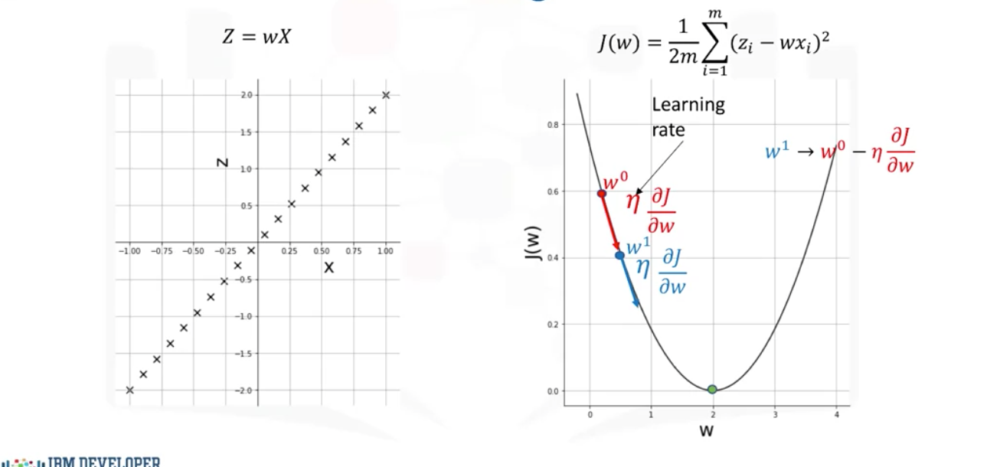

In [152]:
Image(filename='/Users/nikolas.anic/Desktop/ML/ML_Python_Certificate/GD1.png')

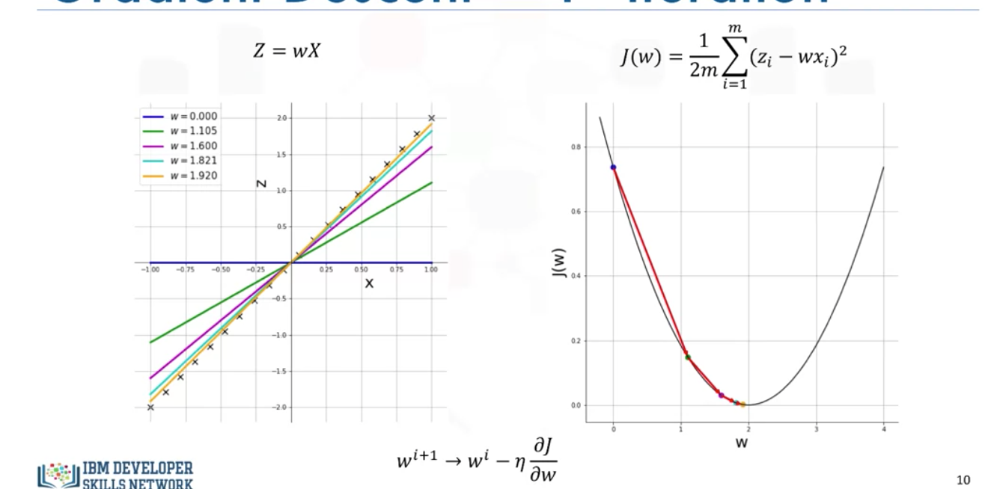

In [153]:
Image(filename='/Users/nikolas.anic/Desktop/ML/ML_Python_Certificate/GD2.png')

### B:  Backpropagating with the sygmoid function

Backpropagating describes the mechanism to choose optimal weights (w) as well as bias (b) terms for the neural network. 

In a neural net, the output value is associated with a ground truth value, which is basically the actual value the output has. The program compares each true value with its expected value and calculates the difference between these values. It assigns the training requirement if the values don't match accordingly. 

The difference calculated is called the error, which also defines the cost or loss value, discussed in the gradient descent setting. Therefore, the next step would be to propagate this error back into the network and use it to perform gradient descent on the different weights and biases in the network, to optimize them using the same equations

Therefore, the backpropagating consists of two steps: 

1. Calculate the error term of the output value 
2. Propagate the error back into the network and update each value accordingly by the following equations: 
    - $w_{i} = w_i - \eta * \frac{\delta E}{\delta w_i}$
    - $b_{i} = b_i - \eta * \frac{\delta E}{\delta b_i}$

In general, we do reverse engineering to obtain the derivative values back to the first step of the equation (where we calculate $z_1$ through $x_1$, $w_1$ and $b_1$

In our example with two neurons we therefore have to update $w_1, w_2, b_1, b_2$

Here, we follow these steps for $w_2$:

1. Calculate the error with two neurons: 
    - $E = \frac{1}{2}*(T-a_2)$
2. Calculate the new $w_2$ through the derivative: 
    - $w_{2} = w_2 - \eta * \frac{\delta E}{\delta w_2}$
3. To get the derivative value for $w_i$ we need to use the chain rule: 
    - $E = \frac{1}{2}*(T-a_2)$
    - $a_2 = f(z_2) = \frac{1}{1 + exp^{-z_2}}$
    - $z_2 = a_1*w_2 + b_2$
4. In the two-dimensional phase, this is: 
    - $\frac{\delta E}{\delta a_2} = (-T - a_2)$
    - $\frac{\delta a_2}{\delta z_2} = (a_2*(1- a_2))$
    - $\frac{\delta z_2}{\delta w_2} = (a_1)$
5. The chain rule is the multiplication of all derivatives: 
    - $(-T - a_2)*(a_2*(1- a_2))*a_1$
6. Subtract the gradient value multiplied with the learning rate from the old $w_2$:
    - $w_2 - \eta * (-T - a_2)*(a_2*(1- a_2))*a_1$
    
The steps for $w_1$ are quite similar, but here we need to obtain it back to $w_1$: 

1. Calculate the error with two neurons: 
    - $E = \frac{1}{2}*(T-a_2)$
    
2. Calculate the new w_2 through the derivative: 
    - $w_{1} = w_1 - \eta * \frac{\delta E}{\delta w_1}$
    
3. To get the derivative value for $w_i$ we need to use the chain rule: 
    - $E = \frac{1}{2}*(T-a_2)$
    - $a_2 = f(z_2) = \frac{1}{1 + exp^{-z_2}}$
    - $z_2 = a_1*w_2 + b_2$
    - $a_1 = f(z_1) = \frac{1}{1 + exp^{-z_1}}$
    - $z_1 = x_1*w_1 + b_1$
    
4. In the two-dimensional phase, this is: 
    - $\frac{\delta E}{\delta a_2} = (-T - a_2)$
    - $\frac{\delta a_2}{\delta z_2} = (a_2*(1- a_2))$
    - $\frac{\delta z_2}{\delta w_2} = (a_1)$
    - $\frac{\delta a_1}{\delta z_1} = (a_1)*(1-a_1)$
    - $\frac{\delta z_1}{\delta w_1} = (x_1)$
    
5. The chain rule is the multiplication of all derivatives: 
    - $(-T - a_2)*(a_2*(1- a_2))*a_1$
    
6. Subtract the gradient value multiplied with the learning rate from the old $w_2$:
    - $w_1 - \eta * (-T - a_2)*(a_2*(1- a_2))*a_1*(a_1*(1-a_1))*x_1$

We now have to do the same for $b_2$: 

1. Calculate the error with two neurons: 
    - $E = \frac{1}{2}*(T-a_2)$
    
2. Calculate the new w_2 through the derivative: 
    - $b_{2} = b_2 - \eta * \frac{\delta E}{\delta b_2}$
    
3. To get the derivative value for $w_i$ we need to use the chain rule: 
    - $E = \frac{1}{2}*(T-a_2)$
    - $a_2 = f(z_2) = \frac{1}{1 + exp^{-z_2}}$
    - $z_2 = a_1*w_2 + b_2$
    
4. In the two-dimensional phase, this is: 
    - $\frac{\delta E}{\delta a_2} = (-T - a_2)$
    - $\frac{\delta a_2}{\delta z_2} = (a_2*(1- a_2))$
    - $\frac{\delta z_2}{\delta b_2} = 1$
    
5. The chain rule is the multiplication of all derivatives: 
    - $(-T - a_2)*(a_2*(1- a_2))*1$
    
6. Subtract the gradient value multiplied with the learning rate from the old $b_2$:
    - $b_2 - \eta * (-T - a_2)*(a_2*(1- a_2))*1$
    
The steps for $b_1$ are, again, quite similar, but here we need to obtain it back to $b_1$: 

1. Calculate the error with two neurons: 
    - $E = \frac{1}{2}*(T-a_2)$
    
2. Calculate the new w_2 through the derivative: 
    - $w_{1} = w_1 - \eta * \frac{\delta E}{\delta w_1}$
    
3. To get the derivative value for $w_i$ we need to use the chain rule: 
    - $E = \frac{1}{2}*(T-a_2)$
    - $a_2 = f(z_2) = \frac{1}{1 + exp^{-z_2}}$
    - $z_2 = a_1*w_2 + b_2$
    - $a_1 = f(z_1) = \frac{1}{1 + exp^{-z_1}}$
    - $z_1 = x_1*w_1 + b_1$
    
4. In the two-dimensional phase, this is: 
    - $\frac{\delta E}{\delta a_2} = (-T - a_2)$
    - $\frac{\delta a_2}{\delta z_2} = (a_2*(1- a_2))$
    - $\frac{\delta z_2}{\delta w_2} = (a_1)$
    - $\frac{\delta a_1}{\delta z_1} = (a_1*(1-a_1)$
    - $\frac{\delta z_1}{\delta w_1} = 1$
    
5. The chain rule is the multiplication of all derivatives: 
    - $(-T - a_2)*(a_2*(1- a_2))*a_1$
    
6. Subtract the gradient value multiplied with the learning rate from the old $w_2$:
    - $b_1 - \eta * (-T - a_2)*(a_2*(1- a_2))*a_1*(a_1*(1-a_1))*1$

Now, through gradient descend for two neurons with each one w and b value, we obtain four gradient functions we multiply with the learning rate to obtain the correctly updated values according to partial derivatives: 

- $w_2 = w_2 - \eta * (-T - a_2)*(a_2*(1- a_2))*a_1$
- $w_1 = w_1 - \eta * (-T - a_2)*(a_2*(1- a_2))*a_1*(a_1*(1-a_1))*x_1$
- $b-2 = b_2 - \eta * (-T - a_2)*(a_2*(1- a_2))*1$
- $b_1 = b_1 - \eta * (-T - a_2)*(a_2*(1- a_2))*a_1*(a_1*(1-a_1))*1$

### C: Other activation functions

The issue with the sygmoid function is that it decreases gradually the effects or sizes of the earlier nodes, as it is a multiplication form with factors below zero. Hence, the learning ability of the earlier nodes is limited compared to that of the later ones. This is called **vanishing gradient problem**. 

Therefore, let's look at the most prominent activation functions for neural networks. 

1. Sigmoid function
    - leads to the vanishing gradient problem for the earlier layers
    - At z = 0, a is equal to 0.5 
    - When z is a very large positive number, a is close to 1
    - When z is a very large negative number, a is close to zero
    - Function is pretty flat beyond the +3 and -3 region.
        - Once the function falls in that region, the gradients become very small. 
        - This results in the vanishing gradient problem that we discussed
    - As the gradients approach 0, the network doesn't really learn. 
    - Values only range from 0 to 1. 
        - This means that the sigmoid function is not symmetric around the origin. 
        - The values received are all positive. 




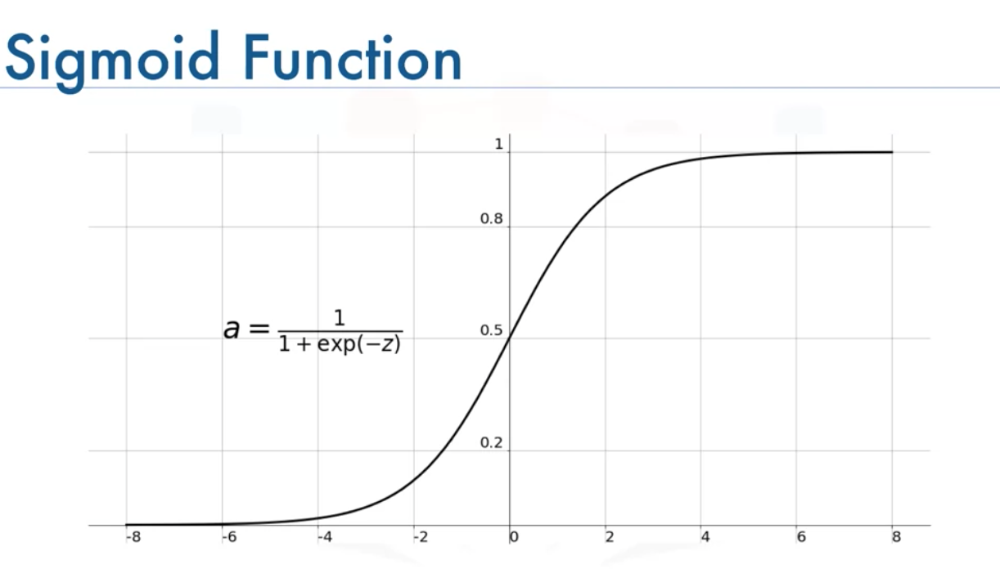

In [156]:
Image(filename='/Users/nikolas.anic/Desktop/ML/ML_Python_Certificate/sygmoid.png')

2. Hyperbolic tangent, or tanh, function
    - Scaled sigmoid function
    - Symmetric over the origin
    - It ranges from -1 to +1
    - Also leads to the vanishing gradient problem in very deep neural networks

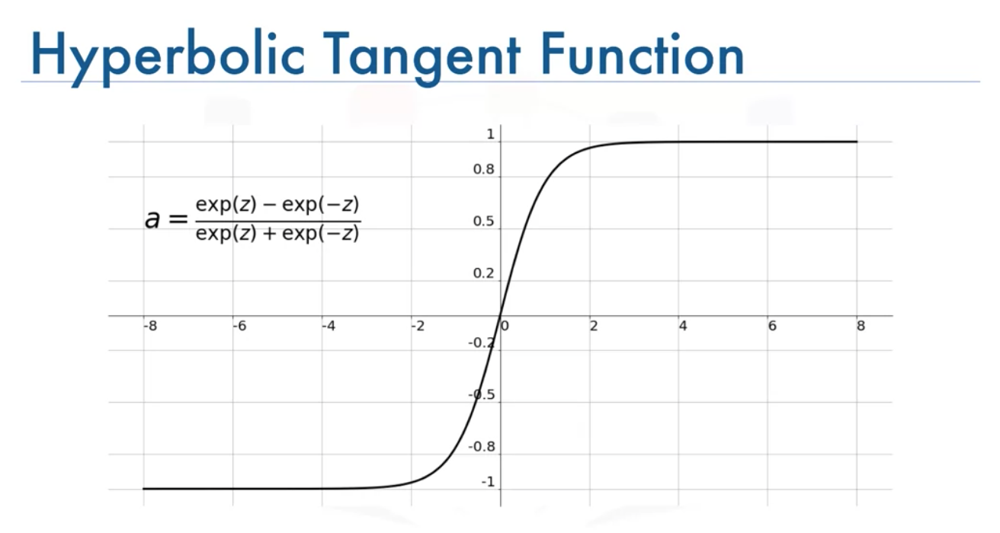

In [157]:
Image(filename='/Users/nikolas.anic/Desktop/ML/ML_Python_Certificate/tanh.png')

3. rectified linear unit (ReLU) function 
    -  most widely used activation function when designing networks 
    - nonlinear
    - Main advantage: Does not activate all the neurons at the same time 
    - If the input is negative it will be converted to 0, and the neuron does not get activated
        - This means that at a time, only a few neurons are activated, making the network sparse and very efficient 
    - No vanishing gradient problem 

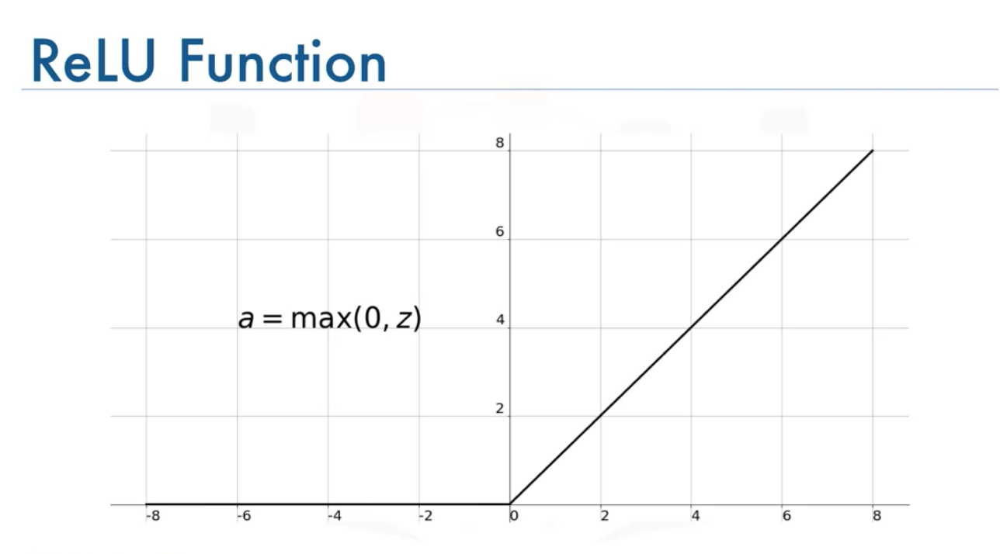

In [158]:
Image(filename='/Users/nikolas.anic/Desktop/ML/ML_Python_Certificate/relu.png')

4. Softmax function
    - A type of a sigmoid function 
    - Handy when we are trying to handle classification problems
    - Ideally used in the output layer of the classifier where we are actually trying to get the probabilities to define the class of each input
    - Function: $a_i = \frac{e^{z_i}}{\sum^m_{k=1} e^{z_k}}$

## 2. Introduction to Keras

Keras is one of the three most commonly used libraries when it comes to artificial, deep learning networks. Keras is especially well made for easy computing and quick analyses, as it is able to perform neural net tasks with only few lines of code. Keras is a high-level API for building deep learning models. It has gained favor for its ease of use and syntactic simplicity facilitating fast development. 

### A: Regression models with Keras

One possibility of using Keras is by calling it in a regression setting.

In [159]:
concrete_data = pd.read_csv('https://s3-api.us-geo.objectstorage.softlayer.net/cf-courses-data/CognitiveClass/DL0101EN/labs/data/concrete_data.csv')
concrete_data.head()

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Strength
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.99
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.89
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.27
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.05
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.30


In [161]:
concrete_data.shape

(1030, 9)

In [165]:
concrete_data.isnull().sum()

Cement                0
Blast Furnace Slag    0
Fly Ash               0
Water                 0
Superplasticizer      0
Coarse Aggregate      0
Fine Aggregate        0
Age                   0
Strength              0
dtype: int64

In [181]:
# Distribute the data into predictor and target variables: 

concrete_data_col = concrete_data.columns
predictors = concrete_data[concrete_data_col[concrete_data_col != "Strength"]]
target = concrete_data[concrete_data_col[concrete_data_col == "Strength"]]

In [183]:
predictors_norm = (predictors - predictors.mean()) / predictors.std() # standardize

In [185]:
n_cols = predictors_norm.shape[1] # number of predictors

8

In [190]:
import keras

In [186]:
from keras.models import Sequential
from keras.layers import Dense

In [192]:
def regression_model(): 
    model = Sequential()
    model.add(Dense(50, activation = "relu", input_shape = (n_cols, )))
    model.add(Dense(50, activation = "relu", input_shape = (n_cols, )))
    model.add(Dense(1)) # the three layers with 50 and 1 hidden and output node, respectively. 
    
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

In [193]:
model = regression_model()

In [194]:
# fit the model
model.fit(predictors_norm, target, validation_split=0.3, epochs=100, verbose=2)

Epoch 1/100
23/23 - 0s - loss: 1668.2013 - val_loss: 1164.1661
Epoch 2/100
23/23 - 0s - loss: 1546.9811 - val_loss: 1053.2347
Epoch 3/100
23/23 - 0s - loss: 1362.6389 - val_loss: 889.7974
Epoch 4/100
23/23 - 0s - loss: 1084.4366 - val_loss: 675.5062
Epoch 5/100
23/23 - 0s - loss: 736.3016 - val_loss: 456.5733
Epoch 6/100
23/23 - 0s - loss: 434.4312 - val_loss: 293.9365
Epoch 7/100
23/23 - 0s - loss: 285.1019 - val_loss: 221.3610
Epoch 8/100
23/23 - 0s - loss: 242.2100 - val_loss: 198.7705
Epoch 9/100
23/23 - 0s - loss: 223.3998 - val_loss: 189.9948
Epoch 10/100
23/23 - 0s - loss: 211.6031 - val_loss: 182.8966
Epoch 11/100
23/23 - 0s - loss: 201.3954 - val_loss: 180.2733
Epoch 12/100
23/23 - 0s - loss: 193.1515 - val_loss: 175.3934
Epoch 13/100
23/23 - 0s - loss: 186.3301 - val_loss: 173.6067
Epoch 14/100
23/23 - 0s - loss: 180.8284 - val_loss: 173.0802
Epoch 15/100
23/23 - 0s - loss: 175.0386 - val_loss: 170.4644
Epoch 16/100
23/23 - 0s - loss: 170.4081 - val_loss: 167.8742
Epoch 17/10

### B: Classification with Keras:

In [234]:
from keras.utils import to_categorical
from keras.datasets import mnist

In [235]:
(X_train, y_train), (X_test, y_test) = mnist.load_data()

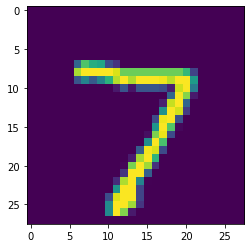

In [239]:
plt.imshow(X_test[0])

Problem is here: We cannot simply feed the network these images as keras cannot digest them. So we need to flatten the images into one-dimensional vectors, each of size 1 x (28 x 28) = 1 x 784. This means each datapoint, or image, gets a vector consisting of 784 rows indicating the values for each pixel. Here, a value of 0 clearly indicates one of the purple fields, while nonzero values indicate different sets of colours. 

In [240]:
num_pixels = X_train.shape[1] * X_train.shape[2] # find the correct number of pixels

X_train = X_train.reshape(X_train.shape[0], num_pixels).astype("float32")
X_test = X_test.reshape(X_test.shape[0], num_pixels).astype("float32")

In [242]:
# Since pixel values can range from 0 to 255, let's normalize the vectors to be between 0 and 1.

X_train = X_train / 255
X_test = X_test / 255

In [243]:
# Finally, before we start building our model, remember that for classification we need to divide our 
# target variable into categories. We use the to_categorical function from the Keras Utilities package.

y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

num_classes = y_test.shape[1]
print(num_classes)


10


In [221]:
def classification_model():
    # create model
    model = Sequential()
    model.add(Dense(num_pixels, activation='relu', input_shape=(num_pixels,)))
    model.add(Dense(100, activation='relu'))
    model.add(Dense(num_classes, activation='softmax')) # softmax used for probability of belonging into one of the 10 
                                                        # values for shapes of y
    
    
    # compile model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

In [223]:
model = classification_model()

In [224]:
model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10, verbose=2)

# evaluate the model
scores = model.evaluate(X_test, y_test, verbose=0)

Epoch 1/10
1875/1875 - 9s - loss: 0.1877 - accuracy: 0.9422 - val_loss: 0.0851 - val_accuracy: 0.9732
Epoch 2/10
1875/1875 - 10s - loss: 0.0781 - accuracy: 0.9760 - val_loss: 0.0942 - val_accuracy: 0.9697
Epoch 3/10
1875/1875 - 9s - loss: 0.0518 - accuracy: 0.9833 - val_loss: 0.0829 - val_accuracy: 0.9753
Epoch 4/10
1875/1875 - 8s - loss: 0.0399 - accuracy: 0.9874 - val_loss: 0.0693 - val_accuracy: 0.9817
Epoch 5/10
1875/1875 - 8s - loss: 0.0302 - accuracy: 0.9902 - val_loss: 0.0723 - val_accuracy: 0.9800
Epoch 6/10
1875/1875 - 7s - loss: 0.0254 - accuracy: 0.9920 - val_loss: 0.0662 - val_accuracy: 0.9812
Epoch 7/10
1875/1875 - 8s - loss: 0.0234 - accuracy: 0.9924 - val_loss: 0.0767 - val_accuracy: 0.9814
Epoch 8/10
1875/1875 - 8s - loss: 0.0189 - accuracy: 0.9941 - val_loss: 0.0836 - val_accuracy: 0.9822
Epoch 9/10
1875/1875 - 9s - loss: 0.0165 - accuracy: 0.9946 - val_loss: 0.0840 - val_accuracy: 0.9830
Epoch 10/10
1875/1875 - 8s - loss: 0.0150 - accuracy: 0.9953 - val_loss: 0.0822 -

In [225]:
print('Accuracy: {}% \n Error: {}'.format(scores[1], 1 - scores[1]))    

Accuracy: 0.984000027179718% 
 Error: 0.015999972820281982


Sometimes, you cannot afford to retrain your model everytime you want to use it, especially if you are limited on computational resources and training your model can take a long time. Therefore, with the Keras library, you can save your model after training. To do that, we use the save method.

In [226]:
model.save('classification_model.h5')

In [227]:
from keras.models import load_model
pretrained_model = load_model('classification_model.h5')

## 3. Supervised & Unsupervised Deep Learning Methods

### A: Convolutional Neural networks

Convolutional Neural Networks are NN whose property is that they can handle images as input factors. This is especially handy, since, as opposed to the method above, we are no longer required to transform each image into a n * 1 vector before the algorithm can be read. Therefore, CNNs are best for solving problems related to image recognition, object detection, and other computer vision applications. 

Here is a typical architecture of a convolutional neural network. As you can see, the network consists of a series of convolutional, ReLU, and pooling layers as well as a number of fully connected layers which are necessary before the output is generated.

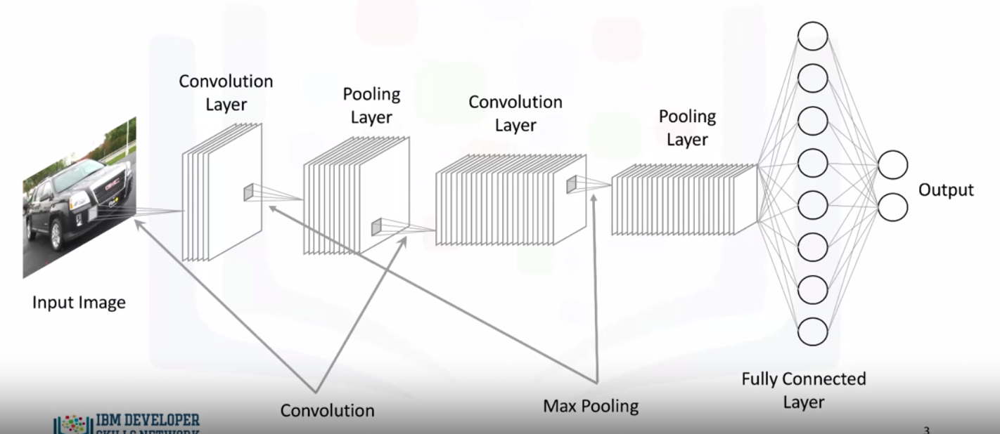

In [244]:
Image(filename='/Users/nikolas.anic/Desktop/ML/ML_Python_Certificate/CNN_Arch.png')

So far, we have dealt only with conventional neural networks that take an ( n x 1) vector as their input. The input to a convolutional neural network, on the other hand, is mostly an (n x m x 1) for grayscale images or an (n x m x 3) for colored images, where the number 3 represents the red, green, and blue components of each pixel in the image. 

In the **convolutional layer**, we basically define filters and we compute the convolution between the defined filters and each of the three images. If we take the red image for example, let's assume these are the pixel values. Now for a (2 x 2) filter with these values, let's create an empty matrix to save the results of the convolution process. We start by sliding the filter over the image and computing the dot product between the filter and the overlapping pixel values and storing the result in the empty matrix. We repeat this step moving our filter one cell at a time, and we repeat this until we cover the entire image and fill the empty matrix. The more filters we use, the more we are able to preserve the spatial dimensions better. 

It is worth mentioning that a convolutional layer also consists of ReLUs which filter the output of the convolutional step passing only positive values and turning any negative values to 0. 

The next layer in our convolutional neural network is the **pooling layer.** The pooling layer's main objective is to reduce the spatial dimensions of the data propagating through the network. There are two types of pooling that are widely used in convolutional neural networks. Max- pooling and average pooling. In max-pooling (average) which is the most common of the two, for each section of the image we scan we keep the highest (average) value. like so. In addition to reducing the dimension of the data, pooling, or max pooling in particular, provides spatial variance which enables the neural network to recognize objects in an image even if the object does not exactly resemble the original object. 

Finally, in the **fully connected layer**, we flatten the output of the last convolutional layer and connect every node of the current layer with every other node of the next layer. This layer basically **takes as input the output from the preceding layer** whether it is a convolutional layer, ReLU, or pooling layer, and **outputs an n-dimensional vector, where n is the number of classes** pertaining to the problem at hand. For example, if you are building a network to classify images of digits, the dimension n would be 10, since there are 10 digits. 

As mentioned, opposed to the Classification in which we had to set up an n*1 input vector, we can now simply insert the data into image format of n * m * 3 (1). To do so, we include: 

- First a convolutional layer, which consists of: 
    - The number of filters for each image 
    - Size of each filter
    - The slice magnitude in horizontal and vertical direction
    - The activation function
- Next a pooling layer, which consists of:: 
    - pooling size per filter 
    - slice magnitude in horizontal & vertical direction
- Then we add the convo-pool combination again, with the differecne that the number of filters in each image doubles 
- Next we flatten the filters to get the data to the fully-connected layer
- Last, we add another dense layer and finally the output layer with input = number of classes & output = softmax (for probabilities)

In [247]:
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.utils import to_categorical
from keras.layers.convolutional import Conv2D # to add convolutional layers
from keras.layers.convolutional import MaxPooling2D # to add pooling layers
from keras.layers import Flatten # to flatten data for fully connected layers

In [248]:
(X_train, Y_train), (X_test, Y_test) = mnist.load_data()

# reshape to be [samples][pixels][width][height]
X_train = X_train.reshape(X_train.shape[0],28,28,1).astype("float32")
X_test = X_test.reshape(X_test.shape[0], 28,28,1).astype("float32")

In [250]:
X_train = (X_train / 255)
X_test = X_test / 255

In [252]:
Y_train = to_categorical(Y_train)
Y_test = to_categorical(Y_test)

In [257]:
def convolutional_model(): 
    model = Sequential()
    model.add(Conv2D(16, (5,5), strides = (1,1), activation = "relu", input_shape = (28,28,1)))
    model.add(MaxPooling2D(pool_size = (2,2), strides = (1,1)))
    
    model.add(Conv2D(8, (2,2), strides = (1,1), activation = "relu"))
    model.add(MaxPooling2D(pool_size = (2,2), strides = (1,1)))
    
    model.add(Flatten())
    model.add(Dense(100, activation = "relu"))
    model.add(Dense(num_classes, activation = "softmax"))
    
    model.compile(optimizer = "adam", loss = "categorical_crossentropy", metrics = ["accuracy"])
    return model 

In [258]:
model = convolutional_model()

model.fit(X_train, Y_train, validation_data = (X_test, Y_test), epochs=10, batch_size=200, verbose=2)
scores = model.evaluate(X_test, y_test, verbose=0)
print("Accuracy: {} \n Error: {}".format(scores[1], 100-scores[1]*100))

Epoch 1/10
300/300 - 35s - loss: 0.2160 - accuracy: 0.9371 - val_loss: 0.0760 - val_accuracy: 0.9760
Epoch 2/10
300/300 - 33s - loss: 0.0611 - accuracy: 0.9815 - val_loss: 0.0516 - val_accuracy: 0.9822
Epoch 3/10
300/300 - 37s - loss: 0.0468 - accuracy: 0.9851 - val_loss: 0.0437 - val_accuracy: 0.9849
Epoch 4/10
300/300 - 40s - loss: 0.0348 - accuracy: 0.9892 - val_loss: 0.0407 - val_accuracy: 0.9870
Epoch 5/10
300/300 - 36s - loss: 0.0289 - accuracy: 0.9911 - val_loss: 0.0416 - val_accuracy: 0.9867
Epoch 6/10
300/300 - 34s - loss: 0.0226 - accuracy: 0.9930 - val_loss: 0.0366 - val_accuracy: 0.9880
Epoch 7/10
300/300 - 32s - loss: 0.0191 - accuracy: 0.9938 - val_loss: 0.0361 - val_accuracy: 0.9878
Epoch 8/10
300/300 - 35s - loss: 0.0165 - accuracy: 0.9947 - val_loss: 0.0336 - val_accuracy: 0.9906
Epoch 9/10
300/300 - 33s - loss: 0.0128 - accuracy: 0.9957 - val_loss: 0.0418 - val_accuracy: 0.9888
Epoch 10/10
300/300 - 33s - loss: 0.0115 - accuracy: 0.9962 - val_loss: 0.0460 - val_accura

### B: Recurrent Neural Networks

So far, we have seen neural networks and deep learning models that see datapoints as independent instances. That saidd, the entire process of learning was based on the idea that each datapoint for itself has a forwardd propagation which does not cross with other datapoints. 

Recurrent neural networks overcome this issue. Recurrent neural networks are networks with loops that don't just take a new input at a time, but also take in as input the output from the previous dat point that was fed into the network.

Essentially, we can start with a normal neural network. At time t = 0, the network takes in input x0 and outputs a0. Then, at time t = 1, in addition to the input x1, the network also takes a0 as input, weighted with weight w0,1, and so on and so forth.



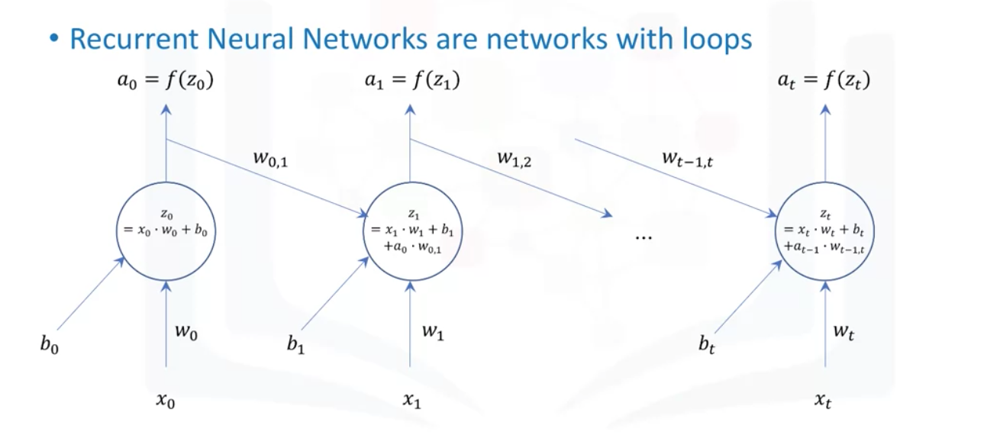

In [245]:
Image(filename='/Users/nikolas.anic/Desktop/ML/ML_Python_Certificate/RNN_Arch.png')

As a result, recurrent neural networks are very good at modelling patterns and sequences of data, such as texts, genomes, handwriting, and stock markets. **These algorithms take time and sequence into account, which means that they have a temporal dimension**.

A very popular type of recurrent neural network is the long short-term memory model or the (LSTM) model for short. It has been successfully used for many applications including image generation, handwriting generation or describing images as well as streams of videos. 

### C: Autoencoders: Unsupervised Learning 

Autoencoding is a data compression algorithm where the compression and the decompression functions are learned automatically from data, instead of being engineered by a human. Such autoencoders are built using neural networks. 

Autoencoders are data specific, which means that they will only be able to compress data similar to what they have been trained on. Therefore, an autoencoder trained on pictures of cars would do a rather poor job of compressing pictures of buildings, because the features it would learn would be vehicle or car specific. 

Some interesting applications of autoencoders are **data denoising and dimensionality reduction for data visualization.** 

Here is the architecture of an autoencoder. It takes an image, for example, as an input and uses an encoder to find the optimal compressed representation of the input image. Then, using a decoder the original image is restored. 



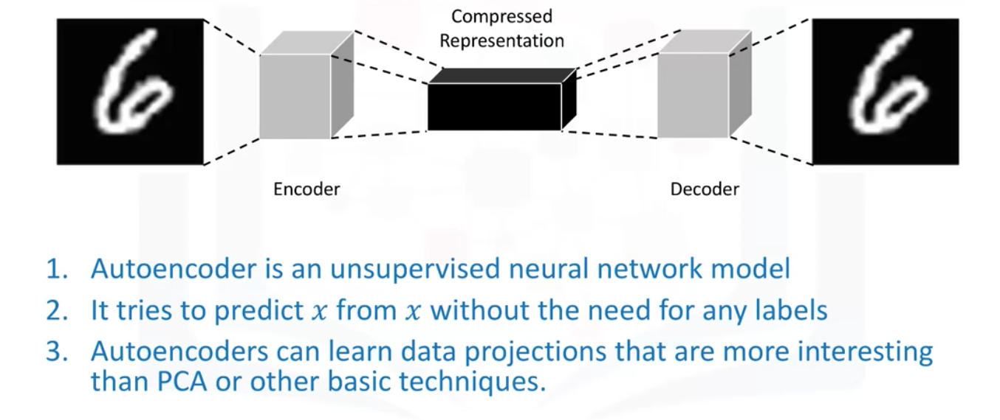

In [246]:
Image(filename='/Users/nikolas.anic/Desktop/ML/ML_Python_Certificate/Autoencoders.png')

So an autoencoder is an unsupervised neural network model. It uses **backpropagation by setting the target variable to be the same as the input**. In other words, it **tries to learn an approximation of an identity function.**

Because of **non-linear activation functions** in neural networks, autoencoders can learn data projections that are more interesting than a principal component analysis PCA or other basic techniques, which can handle only linear transformations. 

A very popular type of autoencoders is the **Restricted Boltzmann Machines**. RBMs have been successfully used for various applications, including **fixing imbalanced datasets**. 
Because RBMs **learn the input in order to be able to regenerate it, they can learn the distribution of the minority class in an imbalanced dataset and then generate more data points of that class**, transforming the imbalance dataset into a balanced data set. Similarly, RBMs can also be used to **estimate missing values in different features** of a data set. Another popular application of Restricted Boltzmann Machines is **automatic feature extraction** of especially unstructured data.